# Customer Segmentation using RFM analysis
#### Introduction:
- For a marketing organization(shop or a mall) to be able generate more revenue from its' customers,there is need for it to determine those customers that are frequently buying from the shop with high amounts of money,high frequency and with the lowest recency value.The method that is used  to do so is called RFM anlysis which is a behavorial approach of segmenting customers.
#### Aim:
- The main aim of this project is to determine the most potential customers for a UK base shop which receives customers from UK and also  from other countries around the world base on Recency(when last the customer from the hop),Frequency(how frequent does a customer buy from this shop) and Monetary value.KMeans clustering in this case is not effecient as compare RFM analysis which is used to cluster the customers.

#### Outline:
- Importation of Important libraries
- Data acquisition and Cleansing using the pandas library.
- Exploratory data analysis
- RFM analysis.
- Conclusion.

#### 1. Importation of Important libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import numpy as np
import warnings
warnings.filterwarnings('ignore')

sns.set_style('darkgrid')

#### 2. Data acquisition and Cleansing using the pandas library.

In [2]:
dataframe = pd.read_excel('Online Retail.xlsx')

In [3]:
dataframe 

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [4]:
dataframe.head(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [ ]:
dataframe.tail(5)

In [5]:
#pd.set_option('display.max_rows',dataframe.shape[0])

#### 3.Exploratory data analysis
- The essence of this section is to properly understand the dataset and it will be divided into 2 parts:
##### 3.1 Product analysis,
##### 3.2 Customer analysis.

##### 3.1 Product analysis,

In [6]:
# 1. Determine the size of the dataset.
dataframe.shape

(541909, 8)

In [7]:
# 2. What are the features of this dataset(columns)?.
dataframe.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [8]:
#3.Display the values of the dataset(content of each column).
dataframe.values

array([[536365, '85123A', 'WHITE HANGING HEART T-LIGHT HOLDER', ...,
        2.55, 17850.0, 'United Kingdom'],
       [536365, 71053, 'WHITE METAL LANTERN', ..., 3.39, 17850.0,
        'United Kingdom'],
       [536365, '84406B', 'CREAM CUPID HEARTS COAT HANGER', ..., 2.75,
        17850.0, 'United Kingdom'],
       ...,
       [581587, 23254, 'CHILDRENS CUTLERY DOLLY GIRL ', ..., 4.15,
        12680.0, 'France'],
       [581587, 23255, 'CHILDRENS CUTLERY CIRCUS PARADE', ..., 4.15,
        12680.0, 'France'],
       [581587, 22138, 'BAKING SET 9 PIECE RETROSPOT ', ..., 4.95,
        12680.0, 'France']], dtype=object)

In [9]:
#4. Checking for empty spaces in the datset.
dataframe.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [10]:
# 5. checking for duplicates in the dataset.
dataframe.duplicated().sum()

5268

- This display the number of rows with duplicates that will be dropped later.

In [11]:
# 6. Display the different products sold out by this UK shop.

dataframe['Description']

0          WHITE HANGING HEART T-LIGHT HOLDER
1                         WHITE METAL LANTERN
2              CREAM CUPID HEARTS COAT HANGER
3         KNITTED UNION FLAG HOT WATER BOTTLE
4              RED WOOLLY HOTTIE WHITE HEART.
                         ...                 
541904            PACK OF 20 SPACEBOY NAPKINS
541905           CHILDREN'S APRON DOLLY GIRL 
541906          CHILDRENS CUTLERY DOLLY GIRL 
541907        CHILDRENS CUTLERY CIRCUS PARADE
541908          BAKING SET 9 PIECE RETROSPOT 
Name: Description, Length: 541909, dtype: object

In [12]:
#7 .Identity the top 10 product IDs that were sold out by this shop in very high quantities.
productID = dataframe['StockCode'].value_counts()[:10]

In [13]:
productID 

85123A    2313
22423     2203
85099B    2159
47566     1727
20725     1639
84879     1502
22720     1477
22197     1476
21212     1385
20727     1350
Name: StockCode, dtype: int64

In [14]:
# 4.Identity the top 10 product names that were sold out by this shop in very high quantities.  
products = dataframe['Description'].value_counts()[:10]
dic = {'Product name':products.index,'ProductID':productID.index,'Quantity purchased':products.values}
product_df = pd.DataFrame(dic)

In [15]:
product_df

,Product name,ProductID,Quantity purchased
0,WHITE HANGING HEART T-LIGHT HOLDER,85123A,2369
1,REGENCY CAKESTAND 3 TIER,22423,2200
2,JUMBO BAG RED RETROSPOT,85099B,2159
3,PARTY BUNTING,47566,1727
4,LUNCH BAG RED RETROSPOT,20725,1638
5,ASSORTED COLOUR BIRD ORNAMENT,84879,1501
6,SET OF 3 CAKE TINS PANTRY DESIGN,22720,1473
7,PACK OF 72 RETROSPOT CAKE CASES,22197,1385
8,LUNCH BAG BLACK SKULL.,21212,1350
9,NATURAL SLATE HEART CHALKBOARD,20727,1280


Text(0.5, 1.0, 'No.of time purchased versus ProductID')

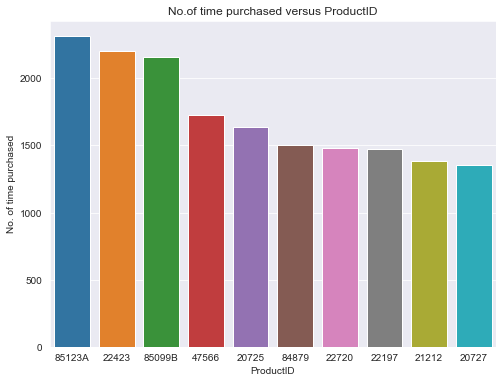

In [16]:
plt.figure(figsize = (8,6)) 
sns.barplot(x = productID.index,y = productID.values)
plt.xlabel('ProductID')
plt.ylabel('No. of time purchased')
plt.title('No.of time purchased versus ProductID')



In [17]:
# Display the top 10 products that contributed the most to the shop's revenue.
dataframe['Total price'] = dataframe['Quantity']*dataframe['UnitPrice'] 


In [18]:
dataframe['Total price']

0         15.30
1         20.34
2         22.00
3         20.34
4         20.34
          ...  
541904    10.20
541905    12.60
541906    16.60
541907    16.60
541908    14.85
Name: Total price, Length: 541909, dtype: float64

In [19]:
dataframe

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60


In [20]:
df = dataframe

In [21]:
group_1 = df.groupby('Description')

In [22]:
for name,group in group_1:
    print(name)
    print(group)
    print('/n')

20713
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
420391    572891     23343       20713      -400 2011-10-26 14:14:00   

        UnitPrice  CustomerID         Country  Total price  
420391        0.0         NaN  United Kingdom         -0.0  
/n
 4 PURPLE FLOCK DINNER CANDLES
       InvoiceNo StockCode                     Description  Quantity  \
1057      536522    72800B   4 PURPLE FLOCK DINNER CANDLES         2   
7526      537044    72800B   4 PURPLE FLOCK DINNER CANDLES        12   
38718     539595    72800B   4 PURPLE FLOCK DINNER CANDLES         2   
45025     540247    72800B   4 PURPLE FLOCK DINNER CANDLES         1   
72021     542226    72800B   4 PURPLE FLOCK DINNER CANDLES         1   
104525    545186    72800B   4 PURPLE FLOCK DINNER CANDLES         1   
142788    548642    72800B   4 PURPLE FLOCK DINNER CANDLES         3   
144795    548808    72800B   4 PURPLE FLOCK DINNER CANDLES         3   
160498    550459    72800B   4 PURPLE FLOCK D

522140       4.95     17584.0  United Kingdom        29.70  
/n
*Boombox Ipod Classic
      InvoiceNo StockCode            Description  Quantity  \
20749    538071     21120  *Boombox Ipod Classic         1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
20749 2010-12-09 14:09:00      16.98         NaN  United Kingdom        16.98  
/n
*USB Office Mirror Ball
      InvoiceNo StockCode              Description  Quantity  \
35675    539437     20954  *USB Office Mirror Ball         1   
37095    539453     20954  *USB Office Mirror Ball         1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
35675 2010-12-17 14:54:00       8.47         NaN  United Kingdom         8.47  
37095 2010-12-17 17:08:00       8.47         NaN  United Kingdom         8.47  
/n
10 COLOUR SPACEBOY PEN
       InvoiceNo StockCode             Description  Quantity  \
448       536408     22418  10 COLOUR SPACEBOY PEN        24   
1330      53653

       InvoiceNo StockCode                Description  Quantity  \
4021      536743     20984  12 PENCILS TALL TUBE POSY         2   
5036      536837     20984  12 PENCILS TALL TUBE POSY         5   
12329     537374     20984  12 PENCILS TALL TUBE POSY         1   
31879     539019     20984  12 PENCILS TALL TUBE POSY         3   
38348     539502     20984  12 PENCILS TALL TUBE POSY         6   
...          ...       ...                        ...       ...   
393673    570839     20984  12 PENCILS TALL TUBE POSY        24   
394649    570875     20984  12 PENCILS TALL TUBE POSY        24   
395819    571046     20984  12 PENCILS TALL TUBE POSY        16   
396936    571105     20984  12 PENCILS TALL TUBE POSY         2   
401195    571429     20984  12 PENCILS TALL TUBE POSY         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
4021   2010-12-02 13:32:00       0.85     17964.0  United Kingdom         1.70  
5036   2010-12-02 18:15:00       

       InvoiceNo StockCode                       Description  Quantity  \
67823     541847     21457  2 PICTURE BOOK EGGS EASTER DUCKS         1   
68035     541850     21457  2 PICTURE BOOK EGGS EASTER DUCKS         2   
74785     542526     21457  2 PICTURE BOOK EGGS EASTER DUCKS         6   
77351     542719     21457  2 PICTURE BOOK EGGS EASTER DUCKS         1   
87276     543648     21457  2 PICTURE BOOK EGGS EASTER DUCKS        12   
88722     543814     21457  2 PICTURE BOOK EGGS EASTER DUCKS        24   
90883     544074     21457  2 PICTURE BOOK EGGS EASTER DUCKS         4   
91600     544109     21457  2 PICTURE BOOK EGGS EASTER DUCKS         3   
92259     544186     21457  2 PICTURE BOOK EGGS EASTER DUCKS         1   
105159    545217     21457  2 PICTURE BOOK EGGS EASTER DUCKS         1   
112212    545874     21457  2 PICTURE BOOK EGGS EASTER DUCKS        12   
113377    545978     21457  2 PICTURE BOOK EGGS EASTER DUCKS         6   
122953    546891     21457  2 PICTURE 

       InvoiceNo StockCode                  Description  Quantity  \
58935     541265     84462  3 PINK HEN+CHICKS IN BASKET         2   
63488     541571     84462  3 PINK HEN+CHICKS IN BASKET         3   
95787     544464     84462  3 PINK HEN+CHICKS IN BASKET         3   
105865    545294     84462  3 PINK HEN+CHICKS IN BASKET         2   
116627    546261     84462  3 PINK HEN+CHICKS IN BASKET         1   
156650    550157     84462  3 PINK HEN+CHICKS IN BASKET         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
58935  2011-01-16 16:23:00       1.25     17609.0  United Kingdom         2.50  
63488  2011-01-19 12:38:00       1.25     12841.0  United Kingdom         3.75  
95787  2011-02-20 14:38:00       1.25     17323.0  United Kingdom         3.75  
105865 2011-03-01 12:07:00       1.25     17965.0  United Kingdom         2.50  
116627 2011-03-10 15:01:00       1.25     17841.0  United Kingdom         1.25  
156650 2011-04-14 15:26:00    

      InvoiceNo StockCode                        Description  Quantity  \
2340     536580     22965  3 TRADITIONAL COOKIE CUTTERS  SET         6   
4384     536771     22965  3 TRADITIONAL COOKIE CUTTERS  SET         6   
23931    538268     22965  3 TRADITIONAL COOKIE CUTTERS  SET         6   
64780    541670     22965  3 TRADITIONAL COOKIE CUTTERS  SET       144   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2340  2010-12-01 16:17:00       2.10     17690.0  United Kingdom         12.6  
4384  2010-12-02 14:49:00       2.10     17581.0  United Kingdom         12.6  
23931 2010-12-10 12:45:00       2.10     18065.0  United Kingdom         12.6  
64780 2011-01-20 12:34:00       1.85     14911.0            EIRE        266.4  
/n
3 TRADITIONAl BISCUIT CUTTERS  SET
       InvoiceNo StockCode                         Description  Quantity  \
3305      536620     22965  3 TRADITIONAl BISCUIT CUTTERS  SET         6   
3409      536626     22965  3 TRADITION

[77 rows x 9 columns]
/n
3D SHEET OF DOG STICKERS
       InvoiceNo StockCode               Description  Quantity  \
2953      536592    84559A  3D SHEET OF DOG STICKERS         1   
5672      536865    84559a  3D SHEET OF DOG STICKERS         1   
6074      536876    84559A  3D SHEET OF DOG STICKERS         2   
6744      536975    84559A  3D SHEET OF DOG STICKERS        12   
11314     537240    84559A  3D SHEET OF DOG STICKERS         1   
...          ...       ...                       ...       ...   
528719    580729    84559A  3D SHEET OF DOG STICKERS         1   
529423    580730    84559A  3D SHEET OF DOG STICKERS         1   
532046    580983    84559A  3D SHEET OF DOG STICKERS         3   
535982    581217    84559A  3D SHEET OF DOG STICKERS         1   
540554    581492    84559A  3D SHEET OF DOG STICKERS         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2953   2010-12-01 17:06:00       1.69         NaN  United Kingdom         1.

540119 2011-12-08 19:24:00       1.25     13077.0  United Kingdom         3.75  
/n
4 SKY BLUE DINNER CANDLES
       InvoiceNo StockCode                Description  Quantity  \
4370      536769    72801D  4 SKY BLUE DINNER CANDLES        12   
30961     538884    72801d  4 SKY BLUE DINNER CANDLES         1   
40686     539740    72801d  4 SKY BLUE DINNER CANDLES         1   
40845     539744    72801d  4 SKY BLUE DINNER CANDLES         2   
51549     540646    72801D  4 SKY BLUE DINNER CANDLES         2   
...          ...       ...                        ...       ...   
524860    580610    72801d  4 SKY BLUE DINNER CANDLES         1   
525103    580612    72801d  4 SKY BLUE DINNER CANDLES         1   
537227    581238    72801d  4 SKY BLUE DINNER CANDLES         5   
539162    581435    72801D  4 SKY BLUE DINNER CANDLES         1   
540116    581467    72801D  4 SKY BLUE DINNER CANDLES         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
4370

[105 rows x 9 columns]
/n
50CM METAL STRING WITH  7 CLIPS
       InvoiceNo StockCode                      Description  Quantity  \
13776     537434     47481  50CM METAL STRING WITH  7 CLIPS         1   
35162     539434     47481  50CM METAL STRING WITH  7 CLIPS         1   
59296     541280     47481  50CM METAL STRING WITH  7 CLIPS        12   
97519     544642     47481  50CM METAL STRING WITH  7 CLIPS         4   
103136    545054     47481  50CM METAL STRING WITH  7 CLIPS         1   
105670    545232     47481  50CM METAL STRING WITH  7 CLIPS        12   
107816    545464     47481  50CM METAL STRING WITH  7 CLIPS         1   
128866    547362     47481  50CM METAL STRING WITH  7 CLIPS       144   
133598    547788     47481  50CM METAL STRING WITH  7 CLIPS         1   
154834    549949     47481  50CM METAL STRING WITH  7 CLIPS         2   
194796    553671     47481  50CM METAL STRING WITH  7 CLIPS        12   
216812    555854     47481  50CM METAL STRING WITH  7 CLIPS       

       InvoiceNo StockCode                    Description  Quantity  \
231161    557237     23125  6PC WOOD PLATE SET DISPOSABLE        12   
237619    557878     23125  6PC WOOD PLATE SET DISPOSABLE         7   
241238    558195     23125  6PC WOOD PLATE SET DISPOSABLE        12   
241780    558240     23125  6PC WOOD PLATE SET DISPOSABLE         1   
244218    558475     23125  6PC WOOD PLATE SET DISPOSABLE         1   
246216    558684     23125  6PC WOOD PLATE SET DISPOSABLE        12   
248398    558813     23125  6PC WOOD PLATE SET DISPOSABLE        12   
249265    558893     23125  6PC WOOD PLATE SET DISPOSABLE        12   
250922    559051     23125  6PC WOOD PLATE SET DISPOSABLE         1   
251647    559055     23125  6PC WOOD PLATE SET DISPOSABLE         1   
252091    559063     23125  6PC WOOD PLATE SET DISPOSABLE         3   
253601    559163     23125  6PC WOOD PLATE SET DISPOSABLE         1   
255657    559359     23125  6PC WOOD PLATE SET DISPOSABLE         6   
260822

       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
337534    566449     20856          ??      -140 2011-09-12 16:07:00   
340683    566712     22030          ??      -635 2011-09-14 12:04:00   
381687    569886     90191          ??       -60 2011-10-06 15:24:00   
390852    570599    84596G          ??      -365 2011-10-11 12:00:00   
418130    572702    37479P          ??      -184 2011-10-25 14:33:00   
418840    572749     22572          ??      -335 2011-10-25 16:52:00   
455407    575615     82582          ??      -130 2011-11-10 12:51:00   

        UnitPrice  CustomerID         Country  Total price  
337534        0.0         NaN  United Kingdom         -0.0  
340683        0.0         NaN  United Kingdom         -0.0  
381687        0.0         NaN  United Kingdom         -0.0  
390852        0.0         NaN  United Kingdom         -0.0  
418130        0.0         NaN  United Kingdom         -0.0  
418840        0.0         NaN  United Kingdom         -0.

       InvoiceNo StockCode               Description  Quantity  \
77034     542678    71496B  A4 WALL TIDY RED FLOWERS         4   
379879    569714    71496B  A4 WALL TIDY RED FLOWERS         6   
386787    570246    71496B  A4 WALL TIDY RED FLOWERS         2   
434834    574063    71496B  A4 WALL TIDY RED FLOWERS         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
77034  2011-01-31 12:21:00       0.65     14688.0  United Kingdom         2.60  
379879 2011-10-05 17:28:00       0.53     18033.0  United Kingdom         3.18  
386787 2011-10-09 16:22:00       0.53     16921.0  United Kingdom         1.06  
434834 2011-11-02 14:31:00       0.53     13271.0  United Kingdom         0.53  
/n
ABC TREASURE BOOK BOX 
       InvoiceNo StockCode             Description  Quantity  \
107059    545408     23176  ABC TREASURE BOOK BOX          8   
108343    545530     23176  ABC TREASURE BOOK BOX          8   
109874    545662     23176  ABC TREASURE BOOK 

       InvoiceNo StockCode                       Description  Quantity  \
518       536409     21326  AGED GLASS SILVER T-LIGHT HOLDER        12   
938       536508     21326  AGED GLASS SILVER T-LIGHT HOLDER       144   
1039      536522     21326  AGED GLASS SILVER T-LIGHT HOLDER        12   
2013      536551     21326  AGED GLASS SILVER T-LIGHT HOLDER        12   
3574      536637     21326  AGED GLASS SILVER T-LIGHT HOLDER        24   
...          ...       ...                               ...       ...   
529894    580757     21326  AGED GLASS SILVER T-LIGHT HOLDER        12   
531029    580901     21326  AGED GLASS SILVER T-LIGHT HOLDER        12   
534807    581172     21326  AGED GLASS SILVER T-LIGHT HOLDER       144   
540385    581478     21326  AGED GLASS SILVER T-LIGHT HOLDER        12   
541711    581567     21326  AGED GLASS SILVER T-LIGHT HOLDER       144   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
518    2010-12-01 11:45:00    

       InvoiceNo StockCode             Description  Quantity  \
3296      536618     22564  ALPHABET STENCIL CRAFT        12   
7685      537050     22564  ALPHABET STENCIL CRAFT         5   
9096      537192     22564  ALPHABET STENCIL CRAFT         1   
11505    C537251     22564  ALPHABET STENCIL CRAFT        -5   
11541     537253     22564  ALPHABET STENCIL CRAFT         6   
...          ...       ...                     ...       ...   
536680    581219     22564  ALPHABET STENCIL CRAFT         2   
537422    581266     22564  ALPHABET STENCIL CRAFT        12   
537803    581352     22564  ALPHABET STENCIL CRAFT         1   
537824    581352     22564  ALPHABET STENCIL CRAFT         1   
538451    581405     22564  ALPHABET STENCIL CRAFT         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
3296   2010-12-02 10:17:00       1.25     17017.0  United Kingdom        15.00  
7685   2010-12-05 11:10:00       1.25     14800.0  United Kingdom    

       InvoiceNo StockCode                        Description  Quantity  \
4112      536749    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
25430     538369    90186A  AMETHYST HOOP EARRING FLORAL LEAF         2   
35636     539436    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
60375     541421    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
65841     541696    90186A  AMETHYST HOOP EARRING FLORAL LEAF         2   
176305    551997    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
268656    560433    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
292358    562551    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
292363    562551    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   
511989    579508    90186A  AMETHYST HOOP EARRING FLORAL LEAF         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
4112   2010-12-02 13:49:00       2.95     17976.0  United Kingdom         2.95  
25430  2010-

       InvoiceNo StockCode                    Description  Quantity  \
1893      536544     21012  ANTIQUE ALL GLASS CANDLESTICK         2   
2508      536592     21012  ANTIQUE ALL GLASS CANDLESTICK         6   
6211      536876     21012  ANTIQUE ALL GLASS CANDLESTICK        15   
11018     537240     21012  ANTIQUE ALL GLASS CANDLESTICK         8   
13294     537434     21012  ANTIQUE ALL GLASS CANDLESTICK         7   
...          ...       ...                            ...       ...   
534248    581142     21012  ANTIQUE ALL GLASS CANDLESTICK         1   
535414    581217     21012  ANTIQUE ALL GLASS CANDLESTICK         2   
536440    581219     21012  ANTIQUE ALL GLASS CANDLESTICK         2   
540589    581492     21012  ANTIQUE ALL GLASS CANDLESTICK         3   
541736    581571     21012  ANTIQUE ALL GLASS CANDLESTICK         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1893   2010-12-01 14:32:00       2.51         NaN  United Kingdom 

       InvoiceNo StockCode                   Description  Quantity  \
191159    553341     23085  ANTIQUE SILVER BAUBLE LAMP           4   
199476    554098     23085  ANTIQUE SILVER BAUBLE LAMP           3   
199480    554098     23085  ANTIQUE SILVER BAUBLE LAMP           1   
249942    558970     23085  ANTIQUE SILVER BAUBLE LAMP           2   
271477    560696     23085  ANTIQUE SILVER BAUBLE LAMP           1   
...          ...       ...                           ...       ...   
524519    580598     23085  ANTIQUE SILVER BAUBLE LAMP           2   
527295    580697     23085  ANTIQUE SILVER BAUBLE LAMP           1   
527299    580697     23085  ANTIQUE SILVER BAUBLE LAMP           4   
530238    580831     23085  ANTIQUE SILVER BAUBLE LAMP           2   
540162    581469     23085  ANTIQUE SILVER BAUBLE LAMP           1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
191159 2011-05-16 12:25:00       10.4     16293.0  United Kingdom         41.6

55239 2011-01-12 15:22:00       1.05     14514.0  United Kingdom         1.05  
/n
ASS COL SMALL SAND GECKO P'WEIGHT
      InvoiceNo StockCode                        Description  Quantity  \
1091     536525    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         2   
23149    538182    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         2   
23150    538182    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         2   
26036    538453    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         1   
28058    538625    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         5   
46805    540362    17164B  ASS COL SMALL SAND GECKO P'WEIGHT        10   
49522    540520    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         2   
67873    541848    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         3   
72313    542239    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         1   
72371    542241    17164B  ASS COL SMALL SAND GECKO P'WEIGHT         1   

              InvoiceDate  UnitPrice  CustomerID         Country  To

       InvoiceNo StockCode                     Description  Quantity  \
9737      537213     85215  ASSORTED CHEESE FRIDGE MAGNETS         1   
17505     537765     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
34783     539434     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
50712     540551     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
70440     542058     85215  ASSORTED CHEESE FRIDGE MAGNETS        24   
84922     543450     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
89586     543911     85215  ASSORTED CHEESE FRIDGE MAGNETS        72   
97173     544599     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
112437    545895     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
124472    546977     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
130875    547514     85215  ASSORTED CHEESE FRIDGE MAGNETS        12   
133743    547794     85215  ASSORTED CHEESE FRIDGE MAGNETS         6   
157622    550208     85215  ASSORTED CHEESE FRIDGE MAGNETS      

482734 2011-11-20 11:50:00       1.25     14502.0  United Kingdom        25.00  
/n
ASSORTED EASTER GIFT TAGS
       InvoiceNo StockCode                Description  Quantity  \
25752     538397     22857  ASSORTED EASTER GIFT TAGS        48   
36920     539453     22857  ASSORTED EASTER GIFT TAGS         1   
37750     539477     22857  ASSORTED EASTER GIFT TAGS        12   
45530     540267     22857  ASSORTED EASTER GIFT TAGS       144   
47985     540458     22857  ASSORTED EASTER GIFT TAGS        12   
...          ...       ...                        ...       ...   
150437    549435     22857  ASSORTED EASTER GIFT TAGS        72   
152255    549583     22857  ASSORTED EASTER GIFT TAGS        12   
153077    549729     22857  ASSORTED EASTER GIFT TAGS         5   
286903    562046     22857  ASSORTED EASTER GIFT TAGS        12   
414852    572499     22857  ASSORTED EASTER GIFT TAGS        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2575

       InvoiceNo StockCode                      Description  Quantity  \
126487    547079     21637  ASSORTED SANSKRIT MINI NOTEBOOK        18   
140313    548400     21637  ASSORTED SANSKRIT MINI NOTEBOOK        18   
183156    552651     21637  ASSORTED SANSKRIT MINI NOTEBOOK        36   
213069    555518     21637  ASSORTED SANSKRIT MINI NOTEBOOK        18   
282840    561661     21637  ASSORTED SANSKRIT MINI NOTEBOOK        18   
388731    570455     21637  ASSORTED SANSKRIT MINI NOTEBOOK         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
126487 2011-03-20 15:02:00       1.25     15408.0  United Kingdom        22.50  
140313 2011-03-30 17:33:00       1.25     17400.0  United Kingdom        22.50  
183156 2011-05-10 14:09:00       1.25     16431.0  United Kingdom        45.00  
213069 2011-06-05 10:58:00       1.25     14891.0  United Kingdom        22.50  
282840 2011-07-28 16:21:00       1.25     12743.0     Unspecified        22.50  
38

       InvoiceNo StockCode                     Description  Quantity  \
2568      536592     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         1   
6278      536876     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         1   
12562     537387     21638  ASSORTED TUTTI FRUTTI NOTEBOOK        12   
13381     537434     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         2   
16866     537666     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         3   
23365     538198     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         6   
26301     538508     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         4   
34158     539321     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         1   
36553     539451     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         1   
86293     543543     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         2   
98293     544676     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         1   
128150    547250     21638  ASSORTED TUTTI FRUTTI NOTEBOOK         2   
128661    547358     21638  ASSORTED TUTTI FRUTTI NOTEBOOK      

[86 rows x 9 columns]
/n
ASSTD RASTA KEY-CHAINS
       InvoiceNo StockCode             Description  Quantity  \
58500     541248     17174  ASSTD RASTA KEY-CHAINS         1   
484862    577544     17174  ASSTD RASTA KEY-CHAINS         3   
498830    578541     17174  ASSTD RASTA KEY-CHAINS         5   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
58500  2011-01-16 13:04:00       0.42     12748.0  United Kingdom         0.42  
484862 2011-11-20 14:43:00       0.42     17758.0  United Kingdom         1.26  
498830 2011-11-24 15:01:00       0.42     14277.0          France         2.10  
/n
Adjust bad debt
       InvoiceNo StockCode      Description  Quantity         InvoiceDate  \
299982   A563185         B  Adjust bad debt         1 2011-08-12 14:50:00   
299983   A563186         B  Adjust bad debt         1 2011-08-12 14:51:00   
299984   A563187         B  Adjust bad debt         1 2011-08-12 14:52:00   

        UnitPrice  CustomerID         Count

154802 2011-04-13 12:57:00       0.42     13208.0  United Kingdom         2.52  
/n
BAKING MOULD CHOCOLATE CUP CAKES
      InvoiceNo StockCode                       Description  Quantity  \
19781    537890     22937  BAKING MOULD CHOCOLATE CUP CAKES         6   
19789    537891     22937  BAKING MOULD CHOCOLATE CUP CAKES         6   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
19781 2010-12-09 10:04:00       2.55     15358.0  United Kingdom         15.3  
19789 2010-12-09 10:05:00       2.55     13319.0  United Kingdom         15.3  
/n
BAKING MOULD CHOCOLATE CUPCAKES
       InvoiceNo StockCode                      Description  Quantity  \
17260     537692     22937  BAKING MOULD CHOCOLATE CUPCAKES         2   
17296     537694     22937  BAKING MOULD CHOCOLATE CUPCAKES        12   
19255     537851     22937  BAKING MOULD CHOCOLATE CUPCAKES        12   
19478     537864     22937  BAKING MOULD CHOCOLATE CUPCAKES        12   
22568     538174     22

       InvoiceNo StockCode                    Description  Quantity  \
19108    C537835     22138  BAKING SET 9 PIECE RETROSPOT         -3   
20438    C538052     22138  BAKING SET 9 PIECE RETROSPOT         -1   
37738    C539476     22138  BAKING SET 9 PIECE RETROSPOT         -1   
40143     539728     22138  BAKING SET 9 PIECE RETROSPOT          3   
40244     539732     22138  BAKING SET 9 PIECE RETROSPOT          6   
...          ...       ...                            ...       ...   
539044    581426     22138  BAKING SET 9 PIECE RETROSPOT          2   
539530    581439     22138  BAKING SET 9 PIECE RETROSPOT          2   
540420    581482     22138  BAKING SET 9 PIECE RETROSPOT         24   
540766    581492     22138  BAKING SET 9 PIECE RETROSPOT          1   
541908    581587     22138  BAKING SET 9 PIECE RETROSPOT          3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
19108  2010-12-08 14:57:00       4.95     14618.0  United Kingdom 

[641 rows x 9 columns]
/n
BATHROOM METAL SIGN 
       InvoiceNo StockCode           Description  Quantity  \
13317     537434     21171  BATHROOM METAL SIGN          1   
14955     537626     21171  BATHROOM METAL SIGN         12   
24226     538346     21171  BATHROOM METAL SIGN         12   
31317     538917     21171  BATHROOM METAL SIGN          1   
34853     539434     21171  BATHROOM METAL SIGN          1   
...          ...       ...                   ...       ...   
246408    558700     21171  BATHROOM METAL SIGN          1   
258636    559665     21171  BATHROOM METAL SIGN          2   
285697    561917     21171  BATHROOM METAL SIGN          1   
286382    562031     21171  BATHROOM METAL SIGN          2   
297753    562955     21171  BATHROOM METAL SIGN          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
13317  2010-12-06 16:57:00       3.36         NaN  United Kingdom         3.36  
14955  2010-12-07 14:57:00       1.45     1234

467424 2011-11-14 15:27:00       0.83     14096.0  United Kingdom         3.32  
/n
BEADED CRYSTAL HEART BLUE SMALL
       InvoiceNo StockCode                      Description  Quantity  \
6644      536973    85129C  BEADED CRYSTAL HEART BLUE SMALL        24   
9221      537196    85129C  BEADED CRYSTAL HEART BLUE SMALL         2   
15610     537638    85129C  BEADED CRYSTAL HEART BLUE SMALL         1   
42629     540014    85129C  BEADED CRYSTAL HEART BLUE SMALL         1   
49702     540526    85129C  BEADED CRYSTAL HEART BLUE SMALL         2   
54529     540954    85129C  BEADED CRYSTAL HEART BLUE SMALL         5   
80073     543020    85129C  BEADED CRYSTAL HEART BLUE SMALL         2   
92446     544190    85129C  BEADED CRYSTAL HEART BLUE SMALL        12   
134512    547850    85129C  BEADED CRYSTAL HEART BLUE SMALL         2   
361570    568346    85129C  BEADED CRYSTAL HEART BLUE SMALL         1   
374462    569374    85129C  BEADED CRYSTAL HEART BLUE SMALL         1   
399240  

246270 2011-07-01 11:32:00       2.08     17706.0  United Kingdom        24.96  
/n
BELL HEART DECORATION
       InvoiceNo StockCode            Description  Quantity  \
185377    552813     23103  BELL HEART DECORATION        12   
190859    553213     23103  BELL HEART DECORATION       144   
201478    554286     23103  BELL HEART DECORATION        12   
205084    554708     23103  BELL HEART DECORATION        12   
220627    556204     23103  BELL HEART DECORATION        12   
239000    557963     23103  BELL HEART DECORATION        12   
246265    558685     23103  BELL HEART DECORATION        12   
263038    559931     23103  BELL HEART DECORATION        12   
336230    566311     23103  BELL HEART DECORATION        24   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
185377 2011-05-11 12:44:00       1.65     15079.0  United Kingdom         19.8  
190859 2011-05-16 09:49:00       1.45     13408.0  United Kingdom        208.8  
201478 2011-05-23 14

37328 2010-12-17 17:30:00       0.85         NaN  United Kingdom         0.85  
/n
BIRD DECORATION GREEN POLKADOT
       InvoiceNo StockCode                     Description  Quantity  \
11238     537240     22322  BIRD DECORATION GREEN POLKADOT         1   
13541     537434     22322  BIRD DECORATION GREEN POLKADOT         1   
15307     537638     22322  BIRD DECORATION GREEN POLKADOT         1   
20959     538071     22322  BIRD DECORATION GREEN POLKADOT         2   
22821     538177     22322  BIRD DECORATION GREEN POLKADOT         1   
...          ...       ...                             ...       ...   
420176    572880     22322  BIRD DECORATION GREEN POLKADOT        12   
435615    574076     22322  BIRD DECORATION GREEN POLKADOT         2   
437939    574298     22322  BIRD DECORATION GREEN POLKADOT         1   
454403    575574     22322  BIRD DECORATION GREEN POLKADOT         2   
459414    575875     22322  BIRD DECORATION GREEN POLKADOT         1   

               Invoic

       InvoiceNo StockCode                 Description  Quantity  \
218521    556051     23247  BISCUIT TIN 50'S CHRISTMAS         1   
229168    557019     23247  BISCUIT TIN 50'S CHRISTMAS         2   
229227    557019     23247  BISCUIT TIN 50'S CHRISTMAS         2   
230393    557144     23247  BISCUIT TIN 50'S CHRISTMAS         2   
248582    558861     23247  BISCUIT TIN 50'S CHRISTMAS         6   
...          ...       ...                         ...       ...   
535275    581193     23247  BISCUIT TIN 50'S CHRISTMAS         1   
535834    581217     23247  BISCUIT TIN 50'S CHRISTMAS         2   
539059    581428     23247  BISCUIT TIN 50'S CHRISTMAS         6   
539811    581439     23247  BISCUIT TIN 50'S CHRISTMAS         1   
541132    581492     23247  BISCUIT TIN 50'S CHRISTMAS         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
218521 2011-06-08 13:09:00       2.89     13742.0  United Kingdom         2.89  
229168 2011-06-16 12:

540841 2011-12-09 10:03:00       8.29         NaN  United Kingdom        24.87  
/n
BLACK BAROQUE WALL CLOCK 
       InvoiceNo StockCode                Description  Quantity  \
34742     539423    85163B  BLACK BAROQUE WALL CLOCK          1   
36438     539451    85163B  BLACK BAROQUE WALL CLOCK          1   
43146     540026    85163B  BLACK BAROQUE WALL CLOCK          1   
44058     540154    85163B  BLACK BAROQUE WALL CLOCK          1   
45175     540255    85163B  BLACK BAROQUE WALL CLOCK          2   
46330     540352    85163B  BLACK BAROQUE WALL CLOCK          1   
53999     540848    85163B  BLACK BAROQUE WALL CLOCK          1   
54918     540977    85163B  BLACK BAROQUE WALL CLOCK          1   
60344     541421    85163B  BLACK BAROQUE WALL CLOCK          2   
60588     541422    85163B  BLACK BAROQUE WALL CLOCK          2   
60870     541423    85163B  BLACK BAROQUE WALL CLOCK          4   
61298     541424    85163B  BLACK BAROQUE WALL CLOCK          9   
62204     541497   

431339 2011-10-31 14:41:00       4.15         NaN  United Kingdom         4.15  
/n
BLACK DIAMOND CLUSTER EARRINGS
       InvoiceNo StockCode                     Description  Quantity  \
3021      536592     90077  BLACK DIAMOND CLUSTER EARRINGS         1   
27907     538566     90077  BLACK DIAMOND CLUSTER EARRINGS         1   
330363    565917     90077  BLACK DIAMOND CLUSTER EARRINGS         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
3021   2010-12-01 17:06:00       2.96         NaN  United Kingdom         2.96  
27907  2010-12-13 11:21:00       2.96         NaN  United Kingdom         2.96  
330363 2011-09-07 16:15:00       2.90         NaN  United Kingdom         2.90  
/n
BLACK DIAMOND CLUSTER NECKLACE
       InvoiceNo StockCode                     Description  Quantity  \
13897     537434     90074  BLACK DIAMOND CLUSTER NECKLACE         1   
366677    568787     90074  BLACK DIAMOND CLUSTER NECKLACE         2   
507927    579187     9

[210 rows x 9 columns]
/n
BLACK LOVE BIRD CANDLE
       InvoiceNo StockCode             Description  Quantity  \
511       536409    85169B  BLACK LOVE BIRD CANDLE        12   
755       536446    85169B  BLACK LOVE BIRD CANDLE        24   
6129      536876    85169B  BLACK LOVE BIRD CANDLE         1   
16744     537666    85169B  BLACK LOVE BIRD CANDLE         1   
19265     537852    85169B  BLACK LOVE BIRD CANDLE        12   
...          ...       ...                     ...       ...   
481717    577358    85169B  BLACK LOVE BIRD CANDLE         2   
501716    578827    85169B  BLACK LOVE BIRD CANDLE         2   
504105    578942    85169B  BLACK LOVE BIRD CANDLE         1   
514209    579689    85169B  BLACK LOVE BIRD CANDLE         2   
536802    581219    85169B  BLACK LOVE BIRD CANDLE         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
511    2010-12-01 11:45:00       1.25     17908.0  United Kingdom        15.00  
755    2010-12-01 12

       InvoiceNo StockCode                     Description  Quantity  \
1068      536522     22481  BLACK TEA TOWEL CLASSIC DESIGN         3   
2009      536551     22481  BLACK TEA TOWEL CLASSIC DESIGN         2   
14820     537622     22481  BLACK TEA TOWEL CLASSIC DESIGN        24   
26431     538512     22481  BLACK TEA TOWEL CLASSIC DESIGN        12   
27935     538567     22481  BLACK TEA TOWEL CLASSIC DESIGN        12   
...          ...       ...                             ...       ...   
537801    581352     22481  BLACK TEA TOWEL CLASSIC DESIGN         4   
537811    581352     22481  BLACK TEA TOWEL CLASSIC DESIGN         2   
537817    581352     22481  BLACK TEA TOWEL CLASSIC DESIGN         2   
538448    581405     22481  BLACK TEA TOWEL CLASSIC DESIGN         6   
541869    581585     22481  BLACK TEA TOWEL CLASSIC DESIGN        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1068   2010-12-01 12:49:00       1.25     15012.0  Uni

       InvoiceNo StockCode                  Description  Quantity  \
9176      537195    84563B  BLUE & WHITE BREAKFAST TRAY         1   
42234     539958    84563B  BLUE & WHITE BREAKFAST TRAY         1   
45341     540255    84563B  BLUE & WHITE BREAKFAST TRAY         1   
48318     540468    84563B  BLUE & WHITE BREAKFAST TRAY         1   
50617     540551    84563B  BLUE & WHITE BREAKFAST TRAY         2   
51261     540646    84563B  BLUE & WHITE BREAKFAST TRAY         1   
52027     540681    84563B  BLUE & WHITE BREAKFAST TRAY         1   
52933     540821    84563B  BLUE & WHITE BREAKFAST TRAY         1   
53949     540848    84563B  BLUE & WHITE BREAKFAST TRAY         1   
57895     541219    84563B  BLUE & WHITE BREAKFAST TRAY         2   
60270     541421    84563B  BLUE & WHITE BREAKFAST TRAY         1   
62248     541497    84563B  BLUE & WHITE BREAKFAST TRAY         1   
62842     541516    84563B  BLUE & WHITE BREAKFAST TRAY         1   
64113     541592    84563B  BLUE &

534910 2011-12-07 15:16:00       1.25     14646.0     Netherlands         30.0  
/n
BLUE COAT RACK PARIS FASHION
       InvoiceNo StockCode                   Description  Quantity  \
24        536368     22914  BLUE COAT RACK PARIS FASHION         3   
471       536408     22914  BLUE COAT RACK PARIS FASHION         3   
4068      536746     22914  BLUE COAT RACK PARIS FASHION         3   
5701      536874     22914  BLUE COAT RACK PARIS FASHION         1   
5717      536874     22914  BLUE COAT RACK PARIS FASHION         1   
...          ...       ...                           ...       ...   
507142    579167     22914  BLUE COAT RACK PARIS FASHION         2   
516545    579927     22914  BLUE COAT RACK PARIS FASHION         3   
529162    580730     22914  BLUE COAT RACK PARIS FASHION         1   
539131    581433     22914  BLUE COAT RACK PARIS FASHION         3   
541038    581492     22914  BLUE COAT RACK PARIS FASHION         1   

               InvoiceDate  UnitPrice  Custome

[73 rows x 9 columns]
/n
BLUE FELT HANGING HEART W FLOWER
      InvoiceNo StockCode                       Description  Quantity  \
2884     536592    35916B  BLUE FELT HANGING HEART W FLOWER         1   
67212    541827    35916B  BLUE FELT HANGING HEART W FLOWER        15   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2884  2010-12-01 17:06:00       1.66         NaN  United Kingdom         1.66  
67212 2011-01-21 17:05:00       1.63         NaN  United Kingdom        24.45  
/n
BLUE FELT HANGING HEART WITH FLOWER
       InvoiceNo StockCode                          Description  Quantity  \
217396    555924    35916B  BLUE FELT HANGING HEART WITH FLOWER         3   
219928    556108    35916B  BLUE FELT HANGING HEART WITH FLOWER         2   
225195    556636    35916B  BLUE FELT HANGING HEART WITH FLOWER         1   
232628    557324    35916B  BLUE FELT HANGING HEART WITH FLOWER         2   
238311    557937    35916B  BLUE FELT HANGING HEART WITH F

518626 2011-12-01 16:22:00       5.79         NaN  United Kingdom         5.79  
/n
BLUE HANGING GINGHAM EASTER HEN
       InvoiceNo StockCode                      Description  Quantity  \
56228     541094    84745B  BLUE HANGING GINGHAM EASTER HEN         6   
70734     542100    84745B  BLUE HANGING GINGHAM EASTER HEN        10   
126037    547063    84745B  BLUE HANGING GINGHAM EASTER HEN         6   
153078    549729    84745B  BLUE HANGING GINGHAM EASTER HEN         4   
169848    551268    84745B  BLUE HANGING GINGHAM EASTER HEN         6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
56228  2011-01-13 13:36:00       0.42     13246.0  United Kingdom         2.52  
70734  2011-01-25 13:15:00       0.42     15339.0  United Kingdom         4.20  
126037 2011-03-20 13:33:00       0.42     14769.0  United Kingdom         2.52  
153078 2011-04-11 16:17:00       0.42     13634.0  United Kingdom         1.68  
169848 2011-04-27 12:08:00       0.42   

       InvoiceNo StockCode                 Description  Quantity  \
6145      536876    90120B  BLUE MURANO TWIST BRACELET         1   
50732     540551    90120B  BLUE MURANO TWIST BRACELET         1   
53147     540821    90120B  BLUE MURANO TWIST BRACELET         1   
70181     541999    90120B  BLUE MURANO TWIST BRACELET         8   
86152     543535    90120B  BLUE MURANO TWIST BRACELET         1   
111664    545812    90120B  BLUE MURANO TWIST BRACELET         4   
226833    556812    90120B  BLUE MURANO TWIST BRACELET         1   
266307    560251    90120B  BLUE MURANO TWIST BRACELET         1   
312885    564378    90120B  BLUE MURANO TWIST BRACELET         4   
370822    569202    90120B  BLUE MURANO TWIST BRACELET         1   
394632    570872    90120B  BLUE MURANO TWIST BRACELET         1   
431323    573585    90120B  BLUE MURANO TWIST BRACELET         1   
471106    576618    90120B  BLUE MURANO TWIST BRACELET         2   
477292    577056    90120B  BLUE MURANO TWIST BR

[120 rows x 9 columns]
/n
BLUE PATCH PURSE PINK HEART
      InvoiceNo StockCode                  Description  Quantity  \
1837     536544     20854  BLUE PATCH PURSE PINK HEART         6   
7047     536987     20854  BLUE PATCH PURSE PINK HEART         1   
7759     537054     20854  BLUE PATCH PURSE PINK HEART         3   
14121    537462     20854  BLUE PATCH PURSE PINK HEART         5   
20297    538035     20854  BLUE PATCH PURSE PINK HEART         2   
20716    538071     20854  BLUE PATCH PURSE PINK HEART         1   
26311    538508     20854  BLUE PATCH PURSE PINK HEART         2   
26657    538518     20854  BLUE PATCH PURSE PINK HEART         2   
26658    538518     20854  BLUE PATCH PURSE PINK HEART         2   
30263    538853     20854  BLUE PATCH PURSE PINK HEART         2   
33238    539243     20854  BLUE PATCH PURSE PINK HEART         2   
33640    539281     20854  BLUE PATCH PURSE PINK HEART        20   
41576    539933     20854  BLUE PATCH PURSE PINK HEART        

[152 rows x 9 columns]
/n
BLUE POLKADOT WRAP
       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
4453      536783     21499  BLUE POLKADOT WRAP       200 2010-12-02 15:19:00   
4496      536784     21499  BLUE POLKADOT WRAP        50 2010-12-02 15:20:00   
5042      536837     21499  BLUE POLKADOT WRAP        25 2010-12-02 18:15:00   
7097      536988     21499  BLUE POLKADOT WRAP        25 2010-12-03 15:05:00   
11744     537265     21499  BLUE POLKADOT WRAP        25 2010-12-06 11:26:00   
...          ...       ...                 ...       ...                 ...   
516121    579868     21499  BLUE POLKADOT WRAP        25 2011-11-30 16:43:00   
516565    579937     21499  BLUE POLKADOT WRAP        25 2011-12-01 10:10:00   
519524    580152     21499  BLUE POLKADOT WRAP        25 2011-12-02 10:22:00   
531769    580965     21499  BLUE POLKADOT WRAP        25 2011-12-06 14:52:00   
537863    581357     21499  BLUE POLKADOT WRAP        25 2011-12-08 12:29:0

       InvoiceNo StockCode                 Description  Quantity  \
147394    549116    84875D  BLUE SQUARE COMPACT MIRROR        12   
207417    554989    84875D  BLUE SQUARE COMPACT MIRROR        12   
270312    560557    84875D  BLUE SQUARE COMPACT MIRROR         1   
293068    562576    84875D  BLUE SQUARE COMPACT MIRROR         5   
315054    564716    84875D  BLUE SQUARE COMPACT MIRROR        12   
327250    565648    84875D  BLUE SQUARE COMPACT MIRROR         1   
334944    566272    84875D  BLUE SQUARE COMPACT MIRROR         2   
356965    568062    84875D  BLUE SQUARE COMPACT MIRROR         6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
147394 2011-04-06 12:49:00       1.25     16670.0  United Kingdom        15.00  
207417 2011-05-29 13:50:00       1.25     15897.0  United Kingdom        15.00  
270312 2011-07-19 13:05:00       1.25     18101.0  United Kingdom         1.25  
293068 2011-08-07 13:08:00       1.25     15518.0  United Kingd

       InvoiceNo StockCode                   Description  Quantity  \
1256      536532     21520  BOOZE & WOMEN GREETING CARD         12   
2559      536592     21520  BOOZE & WOMEN GREETING CARD          1   
3342      536623     21520  BOOZE & WOMEN GREETING CARD         12   
18645     537823     21520  BOOZE & WOMEN GREETING CARD          1   
19531     537868     21520  BOOZE & WOMEN GREETING CARD         12   
38354     539502     21520  BOOZE & WOMEN GREETING CARD         12   
41848     539958     21520  BOOZE & WOMEN GREETING CARD          7   
43125     540026     21520  BOOZE & WOMEN GREETING CARD          3   
44684     540188     21520  BOOZE & WOMEN GREETING CARD         12   
44730     540238     21520  BOOZE & WOMEN GREETING CARD          2   
48854     540477     21520  BOOZE & WOMEN GREETING CARD         12   
50329     540551     21520  BOOZE & WOMEN GREETING CARD          4   
51265     540646     21520  BOOZE & WOMEN GREETING CARD          3   
51907     540681    

[224 rows x 9 columns]
/n
BOX OF 6 MINI 50'S CRACKERS
       InvoiceNo StockCode                  Description  Quantity  \
254179    559298     23319  BOX OF 6 MINI 50'S CRACKERS        12   
263720    560033     23319  BOX OF 6 MINI 50'S CRACKERS         6   
264853    560125     23319  BOX OF 6 MINI 50'S CRACKERS         1   
273286    560807     23319  BOX OF 6 MINI 50'S CRACKERS         6   
277338    561102     23319  BOX OF 6 MINI 50'S CRACKERS        12   
...          ...       ...                          ...       ...   
536318    581219     23319  BOX OF 6 MINI 50'S CRACKERS         1   
539003    581425     23319  BOX OF 6 MINI 50'S CRACKERS         1   
541159    581492     23319  BOX OF 6 MINI 50'S CRACKERS         3   
541690    581538     23319  BOX OF 6 MINI 50'S CRACKERS         1   
541815    581579     23319  BOX OF 6 MINI 50'S CRACKERS        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
254179 2011-07-07 12:38:00       2.4

     InvoiceNo StockCode                   Description  Quantity  \
9779    537217     22849  BREAD BIN, DINER STYLE, MINT         4   

             InvoiceDate  UnitPrice  CustomerID         Country  Total price  
9779 2010-12-05 15:40:00      14.95     15502.0  United Kingdom         59.8  
/n
BRIGHT BLUES RIBBONS 
       InvoiceNo StockCode            Description  Quantity  \
397       536404    85049D  BRIGHT BLUES RIBBONS         12   
5310      536857    85049D  BRIGHT BLUES RIBBONS          5   
9414      537201    85049D  BRIGHT BLUES RIBBONS         12   
10125     537225    85049D  BRIGHT BLUES RIBBONS          1   
14976     537627    85049D  BRIGHT BLUES RIBBONS         12   
...          ...       ...                    ...       ...   
292327    562551    85049D  BRIGHT BLUES RIBBONS          2   
292915    562569    85049D  BRIGHT BLUES RIBBONS          2   
293282    562593    85049D  BRIGHT BLUES RIBBONS          2   
298309    563016    85049D  BRIGHT BLUES RIBBONS  

       InvoiceNo StockCode                          Description  Quantity  \
182291    552534     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS         1   
185105    552732     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS        12   
185676    552824     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS        12   
185890    552830     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS        24   
186432    552862     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS         2   
...          ...       ...                                  ...       ...   
533230    581020     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS        48   
533983    581125     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS         6   
534665    581166     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS         2   
534925    581175     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS        96   
537705    581334     23192  BUNDLE OF 3 ALPHABET EXERCISE BOOKS         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total pr

534008     15.000     16271.0  United Kingdom       15.000  
/n
Breakages
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
418065    572686     23118   Breakages       -30 2011-10-25 14:03:00   

        UnitPrice  CustomerID         Country  Total price  
418065        0.0         NaN  United Kingdom         -0.0  
/n
CABIN BAG VINTAGE PAISLEY
       InvoiceNo StockCode                Description  Quantity  \
2738      536592     22503  CABIN BAG VINTAGE PAISLEY         1   
5243      536851     22503  CABIN BAG VINTAGE PAISLEY         6   
13977     537440     22503  CABIN BAG VINTAGE PAISLEY         1   
31795     539013     22503  CABIN BAG VINTAGE PAISLEY         3   
34507     539401     22503  CABIN BAG VINTAGE PAISLEY        12   
42108     539958     22503  CABIN BAG VINTAGE PAISLEY         1   
43855     540150     22503  CABIN BAG VINTAGE PAISLEY         3   
50494     540551     22503  CABIN BAG VINTAGE PAISLEY         1   
58999     541267     22503 

[131 rows x 9 columns]
/n
CAKE STAND VICTORIAN FILIGREE SMALL
       InvoiceNo StockCode                          Description  Quantity  \
1528      536544     22182  CAKE STAND VICTORIAN FILIGREE SMALL         1   
2668      536592     22182  CAKE STAND VICTORIAN FILIGREE SMALL         1   
5795      536876     22182  CAKE STAND VICTORIAN FILIGREE SMALL         3   
11212     537240     22182  CAKE STAND VICTORIAN FILIGREE SMALL         1   
18781     537823     22182  CAKE STAND VICTORIAN FILIGREE SMALL         1   
...          ...       ...                                  ...       ...   
524097    580528     22182  CAKE STAND VICTORIAN FILIGREE SMALL        24   
532853    580999     22182  CAKE STAND VICTORIAN FILIGREE SMALL         4   
537600    581325     22182  CAKE STAND VICTORIAN FILIGREE SMALL         4   
539852    581443     22182  CAKE STAND VICTORIAN FILIGREE SMALL        24   
540447    581489     22182  CAKE STAND VICTORIAN FILIGREE SMALL        24   

             

[171 rows x 9 columns]
/n
CAMPHOR WOOD PORTOBELLO MUSHROOM
       InvoiceNo StockCode                       Description  Quantity  \
6465      536945     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         6   
13355     537434     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         2   
17888     537781     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         1   
25667     538379     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         4   
50325     540551     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         2   
64575     541655     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         2   
101510    544924     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         6   
104981    545216     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         3   
108690    545568     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         1   
114222    546008     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         2   
125382    547042     21379  CAMPHOR WOOD PORTOBELLO MUSHROOM         3   
134120    547826     21379  CAMPHOR WOOD PORTOBELLO M

/n
CANNABIS LEAF BEAD CURTAIN
       InvoiceNo StockCode                 Description  Quantity  \
38558     539586     44228  CANNABIS LEAF BEAD CURTAIN        24   
309668    564136     44228  CANNABIS LEAF BEAD CURTAIN        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
38558  2010-12-20 13:08:00       0.85     14298.0  United Kingdom         20.4  
309668 2011-08-23 11:16:00       0.85     14404.0  United Kingdom         10.2  
/n
CANNISTER VINTAGE LEAF DESIGN
       InvoiceNo StockCode                    Description  Quantity  \
225485    556683     23244  CANNISTER VINTAGE LEAF DESIGN         6   
225578    556722     23244  CANNISTER VINTAGE LEAF DESIGN         6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
225485 2011-06-14 09:43:00       1.95     15358.0  United Kingdom         11.7  
225578 2011-06-14 11:23:00       1.95     17428.0  United Kingdom         11.7  
/n
CAPIZ CHANDELIER
       Invoi

       InvoiceNo StockCode          Description  Quantity         InvoiceDate  \
896       536488     22713  CARD I LOVE LONDON         12 2010-12-01 12:31:00   
2014      536551     22713  CARD I LOVE LONDON         12 2010-12-01 14:34:00   
2189      536569     22713  CARD I LOVE LONDON         12 2010-12-01 15:35:00   
2796      536592     22713  CARD I LOVE LONDON          4 2010-12-01 17:06:00   
9521      537204     22713  CARD I LOVE LONDON         12 2010-12-05 14:45:00   
...          ...       ...                  ...       ...                 ...   
530400    580865     22713  CARD I LOVE LONDON         12 2011-12-06 11:58:00   
532394    580983     22713  CARD I LOVE LONDON          1 2011-12-06 16:26:00   
532703    580986     22713  CARD I LOVE LONDON         12 2011-12-06 16:34:00   
535689    581217     22713  CARD I LOVE LONDON          1 2011-12-08 09:20:00   
540990    581492     22713  CARD I LOVE LONDON          1 2011-12-09 10:03:00   

        UnitPrice  Customer

       InvoiceNo StockCode                 Description  Quantity  \
6171      536876     16218  CARTOON  PENCIL SHARPENERS         1   
10222     537237     16218  CARTOON  PENCIL SHARPENERS         1   
16783     537666     16218  CARTOON  PENCIL SHARPENERS         1   
25921     538421     16218  CARTOON  PENCIL SHARPENERS         5   
86960     543625     16218  CARTOON  PENCIL SHARPENERS        80   
...          ...       ...                         ...       ...   
520530    580290     16218  CARTOON  PENCIL SHARPENERS         5   
525806    580639     16218  CARTOON  PENCIL SHARPENERS        10   
528821    580730     16218  CARTOON  PENCIL SHARPENERS         5   
530197    580822     16218  CARTOON  PENCIL SHARPENERS        80   
540750    581492     16218  CARTOON  PENCIL SHARPENERS         5   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
6171   2010-12-03 11:36:00       2.13         NaN  United Kingdom         2.13  
10222  2010-12-06 09:

[363 rows x 9 columns]
/n
CERAMIC LOVE HEART MONEY BANK
       InvoiceNo StockCode                    Description  Quantity  \
18909     537823     22647  CERAMIC LOVE HEART MONEY BANK         1   
29847     538827     22647  CERAMIC LOVE HEART MONEY BANK        36   
31112     538895     22647  CERAMIC LOVE HEART MONEY BANK        36   
33403     539252     22647  CERAMIC LOVE HEART MONEY BANK        36   
38117     539492     22647  CERAMIC LOVE HEART MONEY BANK         1   
41475     539856     22647  CERAMIC LOVE HEART MONEY BANK         1   
42815     540022     22647  CERAMIC LOVE HEART MONEY BANK        36   
43752     540122     22647  CERAMIC LOVE HEART MONEY BANK        72   
48844     540477     22647  CERAMIC LOVE HEART MONEY BANK        36   
49502     540520     22647  CERAMIC LOVE HEART MONEY BANK         4   
49988     540541     22647  CERAMIC LOVE HEART MONEY BANK        36   
56956     541126     22647  CERAMIC LOVE HEART MONEY BANK        36   
58469     541244     

       InvoiceNo StockCode                     Description  Quantity  \
5562      536865     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
6484      536945     21100  CHARLIE AND LOLA CHARLOTTE BAG         2   
12731     537395     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
16136     537645     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
22078     538153     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
27991     538594     21100  CHARLIE AND LOLA CHARLOTTE BAG        10   
31428     538951     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
40594     539739     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
40712     539740     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
62514     541506     21100  CHARLIE AND LOLA CHARLOTTE BAG         1   
67899     541848     21100  CHARLIE AND LOLA CHARLOTTE BAG         2   
76415     542625     21100  CHARLIE AND LOLA CHARLOTTE BAG         2   
78181     542836     21100  CHARLIE AND LOLA CHARLOTTE BAG      

[458 rows x 9 columns]
/n
CHECK
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
428619    573490    85035A       CHECK       -59 2011-10-31 11:55:00   
428620    573491     21618       CHECK       -54 2011-10-31 11:56:00   
524369    580546     23406       CHECK       -21 2011-12-05 09:27:00   

        UnitPrice  CustomerID         Country  Total price  
428619        0.0         NaN  United Kingdom         -0.0  
428620        0.0         NaN  United Kingdom         -0.0  
524369        0.0         NaN  United Kingdom         -0.0  
/n
CHERRY BLOSSOM  DECORATIVE FLASK
       InvoiceNo StockCode                       Description  Quantity  \
1761      536544    84279P  CHERRY BLOSSOM  DECORATIVE FLASK         1   
2942      536592    84279P  CHERRY BLOSSOM  DECORATIVE FLASK         1   
6063      536876    84279P  CHERRY BLOSSOM  DECORATIVE FLASK         1   
7926      537065    84279P  CHERRY BLOSSOM  DECORATIVE FLASK         4   
21227     538071    84279P  C

521116 2011-12-02 15:25:00      24.95     18109.0  United Kingdom        24.95  
/n
CHEST NATURAL WOOD 20 DRAWERS
       InvoiceNo StockCode                    Description  Quantity  \
39739     539663     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
61549     541426     22823  CHEST NATURAL WOOD 20 DRAWERS         4   
66285     541789     22823  CHEST NATURAL WOOD 20 DRAWERS         3   
100581    544824     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
126150    547064     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
149887    549311     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
172793    551559     22823  CHEST NATURAL WOOD 20 DRAWERS         2   
245688    558627     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
304851    563613     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
320596    565056     22823  CHEST NATURAL WOOD 20 DRAWERS         2   
326983    565616     22823  CHEST NATURAL WOOD 20 DRAWERS         1   
338448    566557     22823  CHEST 

       InvoiceNo StockCode                      Description  Quantity  \
95268     544450    84997D  CHILDRENS CUTLERY POLKADOT PINK         5   
97480     544634    84997D  CHILDRENS CUTLERY POLKADOT PINK         2   
97844     544658    84997D  CHILDRENS CUTLERY POLKADOT PINK         6   
98184     544672    84997D  CHILDRENS CUTLERY POLKADOT PINK        72   
99636     544776    84997d  CHILDRENS CUTLERY POLKADOT PINK         5   
...          ...       ...                              ...       ...   
537588    581325    84997D  CHILDRENS CUTLERY POLKADOT PINK         1   
539332    581439    84997D  CHILDRENS CUTLERY POLKADOT PINK         1   
540376    581478    84997D  CHILDRENS CUTLERY POLKADOT PINK         4   
541531    581498    84997d  CHILDRENS CUTLERY POLKADOT PINK         1   
541776    581578    84997D  CHILDRENS CUTLERY POLKADOT PINK         8   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
95268  2011-02-20 12:23:00       4.15     

       InvoiceNo StockCode              Description  Quantity  \
10892     537240     22523  CHILDS GARDEN FORK PINK         1   
19888     537900     22523  CHILDS GARDEN FORK PINK         1   
29689     538814     22523  CHILDS GARDEN FORK PINK         1   
40127     539728     22523  CHILDS GARDEN FORK PINK        12   
43790     540146     22523  CHILDS GARDEN FORK PINK         4   
...          ...       ...                      ...       ...   
511620    579508     22523  CHILDS GARDEN FORK PINK         3   
512353    579512     22523  CHILDS GARDEN FORK PINK         1   
515540    579777     22523  CHILDS GARDEN FORK PINK         3   
525380    580615     22523  CHILDS GARDEN FORK PINK        12   
536665    581219     22523  CHILDS GARDEN FORK PINK         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10892  2010-12-06 10:08:00       1.66         NaN  United Kingdom         1.66  
19888  2010-12-09 10:45:00       0.85     15983.0  United

       InvoiceNo StockCode           Description  Quantity  \
144       536382     21832  CHOCOLATE CALCULATOR        12   
438       536408     21832  CHOCOLATE CALCULATOR        12   
2600      536592     21832  CHOCOLATE CALCULATOR         3   
6353      536885     21832  CHOCOLATE CALCULATOR        24   
10365     537237     21832  CHOCOLATE CALCULATOR         2   
...          ...       ...                   ...       ...   
535493    581217     21832  CHOCOLATE CALCULATOR         1   
537510    581310     21832  CHOCOLATE CALCULATOR         1   
539474    581439     21832  CHOCOLATE CALCULATOR         2   
540238    581473     21832  CHOCOLATE CALCULATOR         1   
540671    581492     21832  CHOCOLATE CALCULATOR         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
144    2010-12-01 09:45:00       1.65     16098.0  United Kingdom        19.80  
438    2010-12-01 11:41:00       1.65     14307.0  United Kingdom        19.80  
2600   2010-

60759 2011-01-17 17:48:00       1.63         NaN  United Kingdom         1.63  
/n
CHRISTMAS GINGHAM STAR
       InvoiceNo StockCode             Description  Quantity  \
645       536415     22593  CHRISTMAS GINGHAM STAR         4   
877       536477     22593  CHRISTMAS GINGHAM STAR       144   
2283      536572     22593  CHRISTMAS GINGHAM STAR        24   
4855     C536812     22593  CHRISTMAS GINGHAM STAR      -144   
4979      536833     22593  CHRISTMAS GINGHAM STAR        12   
...          ...       ...                     ...       ...   
536095    581219     22593  CHRISTMAS GINGHAM STAR         9   
537634    581334     22593  CHRISTMAS GINGHAM STAR         3   
538526    581407     22593  CHRISTMAS GINGHAM STAR         3   
539635    581439     22593  CHRISTMAS GINGHAM STAR         8   
540956    581492     22593  CHRISTMAS GINGHAM STAR         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
645    2010-12-01 11:57:00       0.85     12

[99 rows x 9 columns]
/n
CHRISTMAS PUDDING TRINKET POT 
       InvoiceNo StockCode                     Description  Quantity  \
1490      536544     22065  CHRISTMAS PUDDING TRINKET POT          1   
2270      536571     22065  CHRISTMAS PUDDING TRINKET POT         12   
2637      536592     22065  CHRISTMAS PUDDING TRINKET POT          1   
4803      536804     22065  CHRISTMAS PUDDING TRINKET POT         10   
4984      536833     22065  CHRISTMAS PUDDING TRINKET POT         12   
...          ...       ...                             ...       ...   
534127    581133     22065  CHRISTMAS PUDDING TRINKET POT        288   
535533    581217     22065  CHRISTMAS PUDDING TRINKET POT          3   
536560    581219     22065  CHRISTMAS PUDDING TRINKET POT          4   
539512    581439     22065  CHRISTMAS PUDDING TRINKET POT          2   
540720    581492     22065  CHRISTMAS PUDDING TRINKET POT          2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price 

       InvoiceNo StockCode                   Description  Quantity  \
7144      536991     22339  CHRISTMAS TREE PAINTED ZINC          3   
11244     537240     22339  CHRISTMAS TREE PAINTED ZINC          1   
12436     537378     22339  CHRISTMAS TREE PAINTED ZINC         24   
18820     537823     22339  CHRISTMAS TREE PAINTED ZINC          2   
22825     538177     22339  CHRISTMAS TREE PAINTED ZINC          3   
...          ...       ...                           ...       ...   
475408    576889     22339  CHRISTMAS TREE PAINTED ZINC          5   
476782    577034     22339  CHRISTMAS TREE PAINTED ZINC          2   
477673    577071     22339  CHRISTMAS TREE PAINTED ZINC          8   
482030    577403     22339  CHRISTMAS TREE PAINTED ZINC         16   
494925   C578280     22339  CHRISTMAS TREE PAINTED ZINC         -7   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
7144   2010-12-03 15:16:00       0.65         NaN  United Kingdom         1.95

       InvoiceNo StockCode                  Description  Quantity  \
10145     537226     21713  CITRONELLA CANDLE FLOWERPOT         8   
16876     537666     21713  CITRONELLA CANDLE FLOWERPOT         2   
19160     537842     21713  CITRONELLA CANDLE FLOWERPOT         4   
41890     539958     21713  CITRONELLA CANDLE FLOWERPOT         2   
56925     541123     21713  CITRONELLA CANDLE FLOWERPOT         8   
...          ...       ...                          ...       ...   
500387    578781     21713  CITRONELLA CANDLE FLOWERPOT         1   
512047    579508     21713  CITRONELLA CANDLE FLOWERPOT         3   
523748    580520     21713  CITRONELLA CANDLE FLOWERPOT         1   
531010    580893     21713  CITRONELLA CANDLE FLOWERPOT         2   
532199    580983     21713  CITRONELLA CANDLE FLOWERPOT         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10145  2010-12-06 08:34:00       2.10     15987.0  United Kingdom        16.80  
16876  20

       InvoiceNo StockCode                   Description  Quantity  \
497       536409    90210B  CLEAR ACRYLIC FACETED BANGLE         1   
7543      537045    90210B  CLEAR ACRYLIC FACETED BANGLE         1   
21324     538071    90210B  CLEAR ACRYLIC FACETED BANGLE         1   
28847     538661    90210B  CLEAR ACRYLIC FACETED BANGLE        12   
366682    568787    90210B  CLEAR ACRYLIC FACETED BANGLE         6   
422660    573102    90210B  CLEAR ACRYLIC FACETED BANGLE        10   
539159    581434    90210B  CLEAR ACRYLIC FACETED BANGLE        10   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
497    2010-12-01 11:45:00       2.95     17908.0  United Kingdom         2.95  
7543   2010-12-05 10:54:00       2.95     15038.0  United Kingdom         2.95  
21324  2010-12-09 14:09:00       2.96         NaN  United Kingdom         2.96  
28847  2010-12-13 15:42:00       1.25     15194.0  United Kingdom        15.00  
366682 2011-09-29 09:19:00       2

       InvoiceNo StockCode                     Description  Quantity  \
7737      537051     22305  COFFEE MUG PINK PAISLEY DESIGN         6   
14564     537604     22305  COFFEE MUG PINK PAISLEY DESIGN        12   
17360     537754     22305  COFFEE MUG PINK PAISLEY DESIGN         6   
22815     538177     22305  COFFEE MUG PINK PAISLEY DESIGN         1   
35402     539436     22305  COFFEE MUG PINK PAISLEY DESIGN         2   
39177     539631     22305  COFFEE MUG PINK PAISLEY DESIGN         2   
58110     541220     22305  COFFEE MUG PINK PAISLEY DESIGN       216   
70750     542100     22305  COFFEE MUG PINK PAISLEY DESIGN         6   
80773     543095     22305  COFFEE MUG PINK PAISLEY DESIGN         6   
90813     544070     22305  COFFEE MUG PINK PAISLEY DESIGN         6   
98312     544677     22305  COFFEE MUG PINK PAISLEY DESIGN         2   
112774    545899     22305  COFFEE MUG PINK PAISLEY DESIGN         1   
116658    546263     22305  COFFEE MUG PINK PAISLEY DESIGN      

       InvoiceNo StockCode  Description  Quantity         InvoiceDate  \
309580    564095     23015  CORDIAL JUG         2 2011-08-23 10:31:00   
428019    573409     23015  CORDIAL JUG         4 2011-10-30 16:00:00   

        UnitPrice  CustomerID          Country  Total price  
309580       8.25     14930.0  Channel Islands         16.5  
428019       8.25     14112.0   United Kingdom         33.0  
/n
CORONA MEXICAN TRAY
      InvoiceNo StockCode          Description  Quantity         InvoiceDate  \
2923     536592     79067  CORONA MEXICAN TRAY         1 2010-12-01 17:06:00   
4810     536804     79067  CORONA MEXICAN TRAY        17 2010-12-02 16:34:00   
5440     536862     79067  CORONA MEXICAN TRAY         2 2010-12-03 11:13:00   
5750     536874     79067  CORONA MEXICAN TRAY         1 2010-12-03 11:35:00   
7390     537036     79067  CORONA MEXICAN TRAY         1 2010-12-03 17:28:00   
10114    537225     79067  CORONA MEXICAN TRAY         1 2010-12-05 16:41:00   
12930    53

386643 2011-10-09 15:24:00       6.95     14801.0  United Kingdom         6.95  
/n
CRAZY DAISY HEART DECORATION
       InvoiceNo StockCode                   Description  Quantity  \
946       536520     20707  CRAZY DAISY HEART DECORATION         1   
20699     538071     20707  CRAZY DAISY HEART DECORATION         1   
24304     538349     20707  CRAZY DAISY HEART DECORATION         1   
29791     538826     20707  CRAZY DAISY HEART DECORATION         1   
61540     541424     20707  CRAZY DAISY HEART DECORATION         1   
...          ...       ...                           ...       ...   
458926    575854     20707  CRAZY DAISY HEART DECORATION        12   
466906    576339     20707  CRAZY DAISY HEART DECORATION         1   
503381    578925     20707  CRAZY DAISY HEART DECORATION         1   
508471    579196     20707  CRAZY DAISY HEART DECORATION         1   
527567    580727     20707  CRAZY DAISY HEART DECORATION         1   

               InvoiceDate  UnitPrice  Custome

      InvoiceNo StockCode             Description  Quantity  \
97681   C544653     85065  CREAM SWEETHEART TRAYS        -1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
97681 2011-02-22 12:55:00      12.75     13113.0  United Kingdom       -12.75  
/n
CREAM SWEETHEART WALL CABINET
      InvoiceNo StockCode                    Description  Quantity  \
1384     536539     85067  CREAM SWEETHEART WALL CABINET         1   
17528    537765     85067  CREAM SWEETHEART WALL CABINET         1   
18147    537801     85067  CREAM SWEETHEART WALL CABINET         3   
18236    537809     85067  CREAM SWEETHEART WALL CABINET         1   
56755    541113     85067  CREAM SWEETHEART WALL CABINET         1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1384  2010-12-01 14:03:00      18.95     15165.0  United Kingdom        18.95  
17528 2010-12-08 12:08:00      18.95     14606.0  United Kingdom        18.95  
18147 2010-12-08 13

       InvoiceNo StockCode                   Description  Quantity  \
10798     537237     90085  CRYSTAL STILETTO PHONE CHARM         1   
21307     538071     90085  CRYSTAL STILETTO PHONE CHARM         1   
80028     543013     90085  CRYSTAL STILETTO PHONE CHARM         1   
176404    552000     90085  CRYSTAL STILETTO PHONE CHARM         1   
181966    552514     90085  CRYSTAL STILETTO PHONE CHARM         1   
198710    554062     90085  CRYSTAL STILETTO PHONE CHARM        12   
225228    556636     90085  CRYSTAL STILETTO PHONE CHARM         2   
265410    560225     90085  CRYSTAL STILETTO PHONE CHARM         2   
292539    562553     90085  CRYSTAL STILETTO PHONE CHARM         1   
521349    580360     90085  CRYSTAL STILETTO PHONE CHARM        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10798  2010-12-06 09:58:00       1.66         NaN  United Kingdom         1.66  
21307  2010-12-09 14:09:00       1.66         NaN  United Kingdom  

       InvoiceNo StockCode                   Description  Quantity  \
21810     538145    85032C  CURIOUS IMAGES GIFT WRAP SET         6   
25750     538397    85032C  CURIOUS IMAGES GIFT WRAP SET        48   
63750     541592    85032C  CURIOUS IMAGES GIFT WRAP SET         1   
82118     543188    85032C  CURIOUS IMAGES GIFT WRAP SET         6   
85735     543518    85032C  CURIOUS IMAGES GIFT WRAP SET        48   
...          ...       ...                           ...       ...   
535999    581217    85032C  CURIOUS IMAGES GIFT WRAP SET         4   
536784    581219    85032C  CURIOUS IMAGES GIFT WRAP SET         2   
537444    581266    85032C  CURIOUS IMAGES GIFT WRAP SET        12   
537918    581376    85032C  CURIOUS IMAGES GIFT WRAP SET         2   
540822    581492    85032C  CURIOUS IMAGES GIFT WRAP SET         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
21810  2010-12-09 16:08:00       2.10     15211.0  United Kingdom        12.60

       InvoiceNo StockCode                  Description  Quantity  \
13325     537434     21204  DAISIES  HONEYCOMB GARLAND          1   
35701     539437     21204  DAISIES  HONEYCOMB GARLAND          2   
45116     540248     21204  DAISIES  HONEYCOMB GARLAND          3   
48769     540473     21204  DAISIES  HONEYCOMB GARLAND          3   
52463     540798     21204  DAISIES  HONEYCOMB GARLAND          1   
...          ...       ...                          ...       ...   
484506    577531     21204  DAISIES  HONEYCOMB GARLAND          1   
510263    579442     21204  DAISIES  HONEYCOMB GARLAND         12   
518124    580115     21204  DAISIES  HONEYCOMB GARLAND          1   
529881    580755     21204  DAISIES  HONEYCOMB GARLAND         12   
533948    581125     21204  DAISIES  HONEYCOMB GARLAND          2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
13325  2010-12-06 16:57:00       3.36         NaN  United Kingdom         3.36  
35701  20

       InvoiceNo StockCode                          Description  Quantity  \
5810      536876     22248  DECORATION  PINK CHICK MAGIC GARDEN         1   
36793     539453     22248  DECORATION  PINK CHICK MAGIC GARDEN         1   
42045     539958     22248  DECORATION  PINK CHICK MAGIC GARDEN         9   
42894     540026     22248  DECORATION  PINK CHICK MAGIC GARDEN         9   
43906     540154     22248  DECORATION  PINK CHICK MAGIC GARDEN         1   
...          ...       ...                                  ...       ...   
423154    573137     22248  DECORATION  PINK CHICK MAGIC GARDEN         1   
453005    575477     22248  DECORATION  PINK CHICK MAGIC GARDEN         1   
473446    576836     22248  DECORATION  PINK CHICK MAGIC GARDEN        16   
489047   C577889     22248  DECORATION  PINK CHICK MAGIC GARDEN       -16   
528260    580729     22248  DECORATION  PINK CHICK MAGIC GARDEN         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total pr

       InvoiceNo StockCode                    Description  Quantity  \
296724    562930     23331  DECORATIVE WICKER HEART SMALL        48   
299809    563170     23331  DECORATIVE WICKER HEART SMALL        48   
300677    563209     23331  DECORATIVE WICKER HEART SMALL        14   
301228    563247     23331  DECORATIVE WICKER HEART SMALL        48   
301449    563268     23331  DECORATIVE WICKER HEART SMALL        48   
...          ...       ...                            ...       ...   
535860    581217     23331  DECORATIVE WICKER HEART SMALL         6   
536324    581219     23331  DECORATIVE WICKER HEART SMALL         3   
539841    581439     23331  DECORATIVE WICKER HEART SMALL         3   
540020    581456     23331  DECORATIVE WICKER HEART SMALL         6   
540043    581456     23331  DECORATIVE WICKER HEART SMALL         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
296724 2011-08-10 16:01:00       0.63     14209.0  United Kingdom 

450082 2011-11-08 16:17:00        7.5     13709.0  United Kingdom         -7.5  
/n
DIAMANTE RING ASSORTED IN BOX.
       InvoiceNo StockCode                     Description  Quantity  \
28886     538662     90057  DIAMANTE RING ASSORTED IN BOX.        48   
32619     539098     90057  DIAMANTE RING ASSORTED IN BOX.        24   
33935     539307     90057  DIAMANTE RING ASSORTED IN BOX.       240   
46515     540354     90057  DIAMANTE RING ASSORTED IN BOX.        24   
47055     540372     90057  DIAMANTE RING ASSORTED IN BOX.        24   
47341     540411     90057  DIAMANTE RING ASSORTED IN BOX.        24   
63208     541530     90057  DIAMANTE RING ASSORTED IN BOX.        24   
88022     543748     90057  DIAMANTE RING ASSORTED IN BOX.        48   
97372     544601     90057  DIAMANTE RING ASSORTED IN BOX.        24   
403665    571653     90057  DIAMANTE RING ASSORTED IN BOX.        24   
424066    573182     90057  DIAMANTE RING ASSORTED IN BOX.        24   
426009    573341     

       InvoiceNo StockCode                   Description  Quantity  \
259       536394     22349  DOG BOWL CHASING BALL DESIGN        12   
3976      536742     22349  DOG BOWL CHASING BALL DESIGN         1   
18822     537823     22349  DOG BOWL CHASING BALL DESIGN         1   
24572     538349     22349  DOG BOWL CHASING BALL DESIGN         1   
26429     538512     22349  DOG BOWL CHASING BALL DESIGN         2   
...          ...       ...                           ...       ...   
514615    579711     22349  DOG BOWL CHASING BALL DESIGN         1   
520164    580272     22349  DOG BOWL CHASING BALL DESIGN         1   
520372    580279     22349  DOG BOWL CHASING BALL DESIGN         6   
527181    580695     22349  DOG BOWL CHASING BALL DESIGN         1   
529010    580730     22349  DOG BOWL CHASING BALL DESIGN         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
259    2010-12-01 10:39:00       3.75     13408.0  United Kingdom        45.00

540081 2011-12-08 18:57:00      14.95     15951.0  United Kingdom       -14.95  
/n
DOLLY GIRL BABY GIFT SET
       InvoiceNo StockCode               Description  Quantity  \
115521    546133     23008  DOLLY GIRL BABY GIFT SET         6   
116110    546213     23008  DOLLY GIRL BABY GIFT SET        36   
116517    546252     23008  DOLLY GIRL BABY GIFT SET         3   
116585    546254     23008  DOLLY GIRL BABY GIFT SET         3   
117028    546322     23008  DOLLY GIRL BABY GIFT SET         6   
...          ...       ...                       ...       ...   
518443    580115     23008  DOLLY GIRL BABY GIFT SET         1   
518812    580119     23008  DOLLY GIRL BABY GIFT SET         1   
522663    580405     23008  DOLLY GIRL BABY GIFT SET         1   
536218    581219     23008  DOLLY GIRL BABY GIFT SET         2   
539756    581439     23008  DOLLY GIRL BABY GIFT SET         1   

               InvoiceDate  UnitPrice  CustomerID          Country  \
115521 2011-03-09 15:20:00  

/n
DOORMAT 3 SMILEY CATS
       InvoiceNo StockCode            Description  Quantity  \
2114      536560     48111  DOORMAT 3 SMILEY CATS        10   
2908      536592     48111  DOORMAT 3 SMILEY CATS         1   
3667      536639     48111  DOORMAT 3 SMILEY CATS         2   
4289      536759     48111  DOORMAT 3 SMILEY CATS         4   
5536      536864     48111  DOORMAT 3 SMILEY CATS         1   
...          ...       ...                    ...       ...   
522187    580385     48111  DOORMAT 3 SMILEY CATS         2   
522390    580399     48111  DOORMAT 3 SMILEY CATS         1   
529397    580730     48111  DOORMAT 3 SMILEY CATS         1   
536732    581219     48111  DOORMAT 3 SMILEY CATS         1   
540361    581477     48111  DOORMAT 3 SMILEY CATS        10   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2114   2010-12-01 15:00:00       6.75     13093.0  United Kingdom        67.50  
2908   2010-12-01 17:06:00      14.43         NaN  Unite

       InvoiceNo StockCode                 Description  Quantity  \
18107     537795     48116  DOORMAT MULTICOLOUR STRIPE         2   
21556     538094     48116  DOORMAT MULTICOLOUR STRIPE         2   
21927     538148     48116  DOORMAT MULTICOLOUR STRIPE         1   
22039     538149     48116  DOORMAT MULTICOLOUR STRIPE         1   
22163     538153     48116  DOORMAT MULTICOLOUR STRIPE         1   
...          ...       ...                         ...       ...   
525098    580612     48116  DOORMAT MULTICOLOUR STRIPE         6   
529717    580750     48116  DOORMAT MULTICOLOUR STRIPE         2   
531112    580904     48116  DOORMAT MULTICOLOUR STRIPE         1   
533466    581023     48116  DOORMAT MULTICOLOUR STRIPE         2   
538108    581398     48116  DOORMAT MULTICOLOUR STRIPE         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
18107  2010-12-08 13:03:00       7.95     17213.0  United Kingdom        15.90  
21556  2010-12-09 14:

       InvoiceNo StockCode                 Description  Quantity  \
16513     537666     22512  DOORSTOP RACING CAR DESIGN         1   
27425     538558     22512  DOORSTOP RACING CAR DESIGN         8   
29163     538709     22512  DOORSTOP RACING CAR DESIGN         1   
33345     539250     22512  DOORSTOP RACING CAR DESIGN         8   
41485     539856     22512  DOORSTOP RACING CAR DESIGN         1   
43749     540122     22512  DOORSTOP RACING CAR DESIGN         8   
44845     540240     22512  DOORSTOP RACING CAR DESIGN         8   
47260     540402     22512  DOORSTOP RACING CAR DESIGN         8   
56964     541126     22512  DOORSTOP RACING CAR DESIGN         8   
65939     541700     22512  DOORSTOP RACING CAR DESIGN         8   
72946     542274     22512  DOORSTOP RACING CAR DESIGN         4   
226843    556813     22512  DOORSTOP RACING CAR DESIGN         1   
270958    560601     22512  DOORSTOP RACING CAR DESIGN         1   
284293    561869     22512  DOORSTOP RACING CAR 

       InvoiceNo StockCode                        Description  Quantity  \
236653    557769     23027  DRAWER KNOB VINTAGE GLASS HEXAGON        12   
239523    558058     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
240767    558115     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
242212    558319     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         1   
242683    558368     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
271050    560635     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
279320    561284     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
285648    561915     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         2   
299337    563094     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
308653    564044     23027  DRAWER KNOB VINTAGE GLASS HEXAGON        18   
309125    564061     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
316112    564746     23027  DRAWER KNOB VINTAGE GLASS HEXAGON         6   
341687    566773     2302

431349 2011-10-31 14:41:00      16.67         NaN  United Kingdom        16.67  
/n
Dotcomgiftshop Gift Voucher £30.00
       InvoiceNo     StockCode                         Description  Quantity  \
44725     540238  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   
94054     544323  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   
95034     544434  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   
208808    555149  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   
297099    562933  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   
317442    564760  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   
322164    565231  gift_0001_30  Dotcomgiftshop Gift Voucher £30.00         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
44725  2011-01-05 14:44:00      25.53         NaN  United Kingdom        25.53  
94054  2011-02-17 15:51:00      25.00         NaN  United Kingdom        25.00

EASTER TIN KEEPSAKE
       InvoiceNo StockCode          Description  Quantity         InvoiceDate  \
25761     538397     22858  EASTER TIN KEEPSAKE        42 2010-12-12 11:44:00   
32570     539089     22858  EASTER TIN KEEPSAKE         6 2010-12-16 09:46:00   
40191     539731     22858  EASTER TIN KEEPSAKE       108 2010-12-21 15:05:00   
45503     540265     22858  EASTER TIN KEEPSAKE         6 2011-01-06 10:46:00   
45531     540267     22858  EASTER TIN KEEPSAKE        48 2011-01-06 11:12:00   
...          ...       ...                  ...       ...                 ...   
166816    550953     22858  EASTER TIN KEEPSAKE         3 2011-04-21 16:17:00   
199722   C554100     22858  EASTER TIN KEEPSAKE        -1 2011-05-22 13:27:00   
206598    554946     22858  EASTER TIN KEEPSAKE         6 2011-05-27 14:22:00   
273718   C560855     22858  EASTER TIN KEEPSAKE        -6 2011-07-21 13:00:00   
382739    569943     22858  EASTER TIN KEEPSAKE         3 2011-10-06 18:08:00   

       

       InvoiceNo StockCode            Description  Quantity  \
169048    551160     23069  EDWARDIAN PHOTO FRAME         2   
174857    551855     23069  EDWARDIAN PHOTO FRAME         2   
177202    552046     23069  EDWARDIAN PHOTO FRAME         2   
179113    552262     23069  EDWARDIAN PHOTO FRAME         2   
189785    553165     23069  EDWARDIAN PHOTO FRAME         2   
190996    553227     23069  EDWARDIAN PHOTO FRAME         2   
192669    553463     23069  EDWARDIAN PHOTO FRAME         2   
197854    553938     23069  EDWARDIAN PHOTO FRAME         2   
213460    555541     23069  EDWARDIAN PHOTO FRAME         4   
234730    557595     23069  EDWARDIAN PHOTO FRAME         4   
239064    557970     23069  EDWARDIAN PHOTO FRAME         2   
270310    560557     23069  EDWARDIAN PHOTO FRAME         2   
292151    562540     23069  EDWARDIAN PHOTO FRAME         2   
294900    562727     23069  EDWARDIAN PHOTO FRAME         4   
301976    563366     23069  EDWARDIAN PHOTO FRAME      

       InvoiceNo StockCode              Description  Quantity  \
315842    564735     21507  ELEPHANT BIRTHDAY CARD         12   
317367    564760     21507  ELEPHANT BIRTHDAY CARD          1   
317793    564818     21507  ELEPHANT BIRTHDAY CARD          2   
318481    564835     21507  ELEPHANT BIRTHDAY CARD          1   
323079    565243     21507  ELEPHANT BIRTHDAY CARD         12   
...          ...       ...                      ...       ...   
536926   C581229     21507  ELEPHANT BIRTHDAY CARD        -12   
537407    581266     21507  ELEPHANT BIRTHDAY CARD         12   
538901    581420     21507  ELEPHANT BIRTHDAY CARD         12   
540636    581492     21507  ELEPHANT BIRTHDAY CARD          1   
541788    581578     21507  ELEPHANT BIRTHDAY CARD         12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
315842 2011-08-28 13:35:00       0.42     15856.0  United Kingdom         5.04  
317367 2011-08-30 10:47:00       0.83         NaN  United

       InvoiceNo StockCode                     Description  Quantity  \
354254    567868     23513  EMBROIDERED RIBBON REEL SUSIE          6   
356785    568060     23513  EMBROIDERED RIBBON REEL SUSIE          2   
357248    568069     23513  EMBROIDERED RIBBON REEL SUSIE          6   
360483    568229     23513  EMBROIDERED RIBBON REEL SUSIE          6   
360580    568236     23513  EMBROIDERED RIBBON REEL SUSIE          6   
...          ...       ...                             ...       ...   
512571    579512     23513  EMBROIDERED RIBBON REEL SUSIE          1   
521020    580308     23513  EMBROIDERED RIBBON REEL SUSIE          6   
522943    580482     23513  EMBROIDERED RIBBON REEL SUSIE          2   
526711    580676     23513  EMBROIDERED RIBBON REEL SUSIE          2   
529349    580730     23513  EMBROIDERED RIBBON REEL SUSIE          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
354254 2011-09-22 14:18:00       2.08     17603.0  Uni

       InvoiceNo StockCode                 Description  Quantity  \
1093      536525     22429  ENAMEL MEASURING JUG CREAM         1   
4701      536798     22429  ENAMEL MEASURING JUG CREAM         4   
4903      536819     22429  ENAMEL MEASURING JUG CREAM         4   
5415      536862     22429  ENAMEL MEASURING JUG CREAM         1   
8257      537131     22429  ENAMEL MEASURING JUG CREAM         1   
...          ...       ...                         ...       ...   
533356    581023     22429  ENAMEL MEASURING JUG CREAM         1   
536651    581219     22429  ENAMEL MEASURING JUG CREAM         2   
537144    581238     22429  ENAMEL MEASURING JUG CREAM         1   
538123    581400     22429  ENAMEL MEASURING JUG CREAM         1   
541425    581498     22429  ENAMEL MEASURING JUG CREAM         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1093   2010-12-01 12:54:00       4.25     14078.0  United Kingdom         4.25  
4701   2010-12-02 15:

       InvoiceNo StockCode                         Description  Quantity  \
190622    553202    47574B  ENGLISH ROSE SCENTED HANGING HEART         1   
194793    553671    47574B  ENGLISH ROSE SCENTED HANGING HEART         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
190622 2011-05-15 16:02:00       4.25     15854.0  United Kingdom         4.25  
194793 2011-05-18 12:37:00       4.25     13659.0  United Kingdom        12.75  
/n
ENGLISH ROSE SMALL SCENTED FLOWER
       InvoiceNo StockCode                        Description  Quantity  \
22291     538157    47578A  ENGLISH ROSE SMALL SCENTED FLOWER         8   
72314     542239    47578A  ENGLISH ROSE SMALL SCENTED FLOWER         1   
89373     543907    47578A  ENGLISH ROSE SMALL SCENTED FLOWER         2   
89384     543907    47578A  ENGLISH ROSE SMALL SCENTED FLOWER         2   
110364    545685    47578A  ENGLISH ROSE SMALL SCENTED FLOWER         2   
110365    545685    47578A  ENGLISH ROSE 

       InvoiceNo StockCode                   Description  Quantity  \
1819      536544    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
8749      537144    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
15562     537638    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
16369     537653    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
16404     537654    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
...          ...       ...                           ...       ...   
531349   C580917    84535B  FAIRY CAKES NOTEBOOK A6 SIZE        -1   
532044    580983    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
535258    581193    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         2   
535981    581217    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   
536759    581219    84535B  FAIRY CAKES NOTEBOOK A6 SIZE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1819   2010-12-01 14:32:00       1.49         NaN  United Kingdom         1.49

       InvoiceNo StockCode               Description  Quantity  \
2102      536558     22802  FAUX FUR CHOCOLATE THROW         5   
3079      536596     22802  FAUX FUR CHOCOLATE THROW         1   
5306      536857     22802  FAUX FUR CHOCOLATE THROW         1   
7529      537044     22802  FAUX FUR CHOCOLATE THROW         2   
10987     537240     22802  FAUX FUR CHOCOLATE THROW         1   
26723     538519     22802  FAUX FUR CHOCOLATE THROW         1   
26729     538520     22802  FAUX FUR CHOCOLATE THROW         1   
32472     539079     22802  FAUX FUR CHOCOLATE THROW         1   
32493     539082     22802  FAUX FUR CHOCOLATE THROW         1   
32899     539196     22802  FAUX FUR CHOCOLATE THROW         1   
37877     539485     22802  FAUX FUR CHOCOLATE THROW         1   
38308     539498     22802  FAUX FUR CHOCOLATE THROW         1   
41159     539753     22802  FAUX FUR CHOCOLATE THROW         1   
41628     539951     22802  FAUX FUR CHOCOLATE THROW         1   
42474     

       InvoiceNo StockCode           Description  Quantity  \
31496     538991     22259  FELT FARM ANIMAL HEN       144   
33381     539250     22259  FELT FARM ANIMAL HEN        48   
37742     539477     22259  FELT FARM ANIMAL HEN        12   
42050     539958     22259  FELT FARM ANIMAL HEN         4   
42899     540026     22259  FELT FARM ANIMAL HEN         6   
43911     540154     22259  FELT FARM ANIMAL HEN         2   
44949     540247     22259  FELT FARM ANIMAL HEN         2   
45269     540255     22259  FELT FARM ANIMAL HEN         2   
46209     540352     22259  FELT FARM ANIMAL HEN         3   
47721     540418     22259  FELT FARM ANIMAL HEN         4   
48435     540468     22259  FELT FARM ANIMAL HEN         3   
49107     540501     22259  FELT FARM ANIMAL HEN        48   
50440     540551     22259  FELT FARM ANIMAL HEN        11   
51412     540646     22259  FELT FARM ANIMAL HEN         3   
52801     540821     22259  FELT FARM ANIMAL HEN         1   
53825   

       InvoiceNo StockCode           Description  Quantity  \
588       536412     22274  FELTCRAFT DOLL EMILY         2   
2132      536561     22274  FELTCRAFT DOLL EMILY         6   
3167      536605     22274  FELTCRAFT DOLL EMILY         6   
4235      536754     22274  FELTCRAFT DOLL EMILY         3   
5200      536846     22274  FELTCRAFT DOLL EMILY         1   
...          ...       ...                   ...       ...   
528263    580729     22274  FELTCRAFT DOLL EMILY         2   
529578    580735     22274  FELTCRAFT DOLL EMILY         6   
529645    580737     22274  FELTCRAFT DOLL EMILY         6   
530821    580884     22274  FELTCRAFT DOLL EMILY         2   
535575    581217     22274  FELTCRAFT DOLL EMILY         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
588    2010-12-01 11:49:00       2.95     17920.0  United Kingdom         5.90  
2132   2010-12-01 15:06:00       2.95     12921.0  United Kingdom        17.70  
3167   2010-

       InvoiceNo StockCode                 Description  Quantity  \
205099    554708     23228  FILIGREE HEART BIRD WHITE         24   
206693    554952     23228  FILIGREE HEART BIRD WHITE         24   
210490    555280     23228  FILIGREE HEART BIRD WHITE         24   
210586    555284     23228  FILIGREE HEART BIRD WHITE         24   
211597    555393     23228  FILIGREE HEART BIRD WHITE         24   
...          ...       ...                         ...       ...   
528528    580729     23228  FILIGREE HEART BIRD WHITE          1   
529256    580730     23228  FILIGREE HEART BIRD WHITE          1   
536278    581219     23228  FILIGREE HEART BIRD WHITE          5   
537646    581334     23228  FILIGREE HEART BIRD WHITE          1   
539804    581439     23228  FILIGREE HEART BIRD WHITE          2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
205099 2011-05-26 10:25:00       1.25     16449.0  United Kingdom        30.00  
206693 2011-05-27 14:

       InvoiceNo StockCode                    Description  Quantity  \
188       536388     22318  FIVE HEART HANGING DECORATION         6   
1551      536544     22318  FIVE HEART HANGING DECORATION         1   
2125      536561     22318  FIVE HEART HANGING DECORATION         6   
3662      536638     22318  FIVE HEART HANGING DECORATION         6   
7911      537065     22318  FIVE HEART HANGING DECORATION         6   
...          ...       ...                            ...       ...   
510995    579471     22318  FIVE HEART HANGING DECORATION         1   
512886    579520     22318  FIVE HEART HANGING DECORATION         1   
519078    580136     22318  FIVE HEART HANGING DECORATION         1   
520302    580278     22318  FIVE HEART HANGING DECORATION         1   
529005    580730     22318  FIVE HEART HANGING DECORATION         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
188    2010-12-01 09:59:00       2.95     16250.0  United Kingdom 

       InvoiceNo StockCode                          Description  Quantity  \
224927    556579    90036B  FLOWER GLASS GARLAND NECKL.36"GREEN         3   
286616    562031    90036B  FLOWER GLASS GARLAND NECKL.36"GREEN         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
224927 2011-06-13 14:16:00       7.95     15069.0  United Kingdom        23.85  
286616 2011-08-01 17:37:00       7.95     16984.0  United Kingdom         7.95  
/n
FLOWER GLASS GARLD NECKL36"AMETHYST
       InvoiceNo StockCode                          Description  Quantity  \
26714     538518    90036E  FLOWER GLASS GARLD NECKL36"AMETHYST         1   
63792     541592    90036E  FLOWER GLASS GARLD NECKL36"AMETHYST         2   
104933    545215    90036E  FLOWER GLASS GARLD NECKL36"AMETHYST         1   
107864    545464    90036E  FLOWER GLASS GARLD NECKL36"AMETHYST         1   
127901    547248    90036E  FLOWER GLASS GARLD NECKL36"AMETHYST         1   
180439    552318    9003

       InvoiceNo StockCode                     Description  Quantity  \
183242    552654     23281  FOLDING BUTTERFLY MIRROR RED           1   
186834    552883     23281  FOLDING BUTTERFLY MIRROR RED          96   
191706    553385     23281  FOLDING BUTTERFLY MIRROR RED           2   
192439    553415     23281  FOLDING BUTTERFLY MIRROR RED          12   
195471    553718     23281  FOLDING BUTTERFLY MIRROR RED           1   
...          ...       ...                             ...       ...   
532529    580983     23281  FOLDING BUTTERFLY MIRROR RED           1   
534879    581175     23281  FOLDING BUTTERFLY MIRROR RED          96   
536936    581230     23281  FOLDING BUTTERFLY MIRROR RED          12   
538489    581405     23281  FOLDING BUTTERFLY MIRROR RED           2   
540076    581461     23281  FOLDING BUTTERFLY MIRROR RED          12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
183242 2011-05-10 14:20:00       0.83     15756.0  Uni

       InvoiceNo StockCode                          Description  Quantity  \
220087    556116     35966  FOLKART CHRISTMAS TREE T-LIGHT HOLD        12   
311294    564256     35966  FOLKART CHRISTMAS TREE T-LIGHT HOLD        15   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
220087 2011-06-09 09:44:00       0.38     15214.0  United Kingdom         4.56  
311294 2011-08-24 10:45:00       0.38     14796.0  United Kingdom         5.70  
/n
FOLKART CLIP ON STARS
       InvoiceNo StockCode            Description  Quantity  \
2888      536592     35964  FOLKART CLIP ON STARS         1   
21178     538071     35964  FOLKART CLIP ON STARS         1   
23006     538177     35964  FOLKART CLIP ON STARS         3   
35157     539434     35964  FOLKART CLIP ON STARS         1   
36031     539437     35964  FOLKART CLIP ON STARS         1   
...          ...       ...                    ...       ...   
536716    581219     35964  FOLKART CLIP ON STARS         2

       InvoiceNo StockCode                     Description  Quantity  \
64231     541596     35920  FOUR RABBIT EASTER DECORATIONS        10   
66765     541816     35920  FOUR RABBIT EASTER DECORATIONS         6   
75420     542595     35920  FOUR RABBIT EASTER DECORATIONS         2   
84203     543371     35920  FOUR RABBIT EASTER DECORATIONS         6   
87991     543740     35920  FOUR RABBIT EASTER DECORATIONS         3   
99810     544790     35920  FOUR RABBIT EASTER DECORATIONS         6   
105853    545294     35920  FOUR RABBIT EASTER DECORATIONS         8   
134730    547866     35920  FOUR RABBIT EASTER DECORATIONS         5   
143168    548666     35920  FOUR RABBIT EASTER DECORATIONS        13   
145658    548894     35920  FOUR RABBIT EASTER DECORATIONS         1   
147539    549121     35920  FOUR RABBIT EASTER DECORATIONS         6   
147996    549155     35920  FOUR RABBIT EASTER DECORATIONS         2   
157218    550196     35920  FOUR RABBIT EASTER DECORATIONS      

       InvoiceNo StockCode                     Description  Quantity  \
2068      536557     22686  FRENCH BLUE METAL DOOR SIGN No         1   
7250      537023     22686  FRENCH BLUE METAL DOOR SIGN No         1   
14345     537534     22686  FRENCH BLUE METAL DOOR SIGN No         2   
15416     537638     22686  FRENCH BLUE METAL DOOR SIGN No         2   
25227     538361     22686  FRENCH BLUE METAL DOOR SIGN No         2   
...          ...       ...                             ...       ...   
504447    578949     22686  FRENCH BLUE METAL DOOR SIGN No         1   
519852    580178     22686  FRENCH BLUE METAL DOOR SIGN No        96   
522133    580374     22686  FRENCH BLUE METAL DOOR SIGN No        24   
524756    580610     22686  FRENCH BLUE METAL DOOR SIGN No         1   
539040    581426     22686  FRENCH BLUE METAL DOOR SIGN No         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2068   2010-12-01 14:41:00       1.25     17841.0  Uni

       InvoiceNo StockCode                   Description  Quantity  \
172795    551560     20836  FRENCH PAISLEY CUSHION COVER        12   
180956    552404     20836  FRENCH PAISLEY CUSHION COVER        12   
195810    553747     20836  FRENCH PAISLEY CUSHION COVER        12   
215936    555744     20836  FRENCH PAISLEY CUSHION COVER        12   
216121    555820     20836  FRENCH PAISLEY CUSHION COVER        12   
240237    558096     20836  FRENCH PAISLEY CUSHION COVER         2   
241120    558183     20836  FRENCH PAISLEY CUSHION COVER         6   
255455   C559347     20836  FRENCH PAISLEY CUSHION COVER       -12   
309664    564136     20836  FRENCH PAISLEY CUSHION COVER        12   
326029    565470     20836  FRENCH PAISLEY CUSHION COVER        12   
345785    567179     20836  FRENCH PAISLEY CUSHION COVER         6   
371839    569228     20836  FRENCH PAISLEY CUSHION COVER        12   
415005    572513     20836  FRENCH PAISLEY CUSHION COVER         6   
424416    573265    

539357 2011-12-08 16:30:00       2.46         NaN  United Kingdom         4.92  
/n
FRUIT TREE AND BIRDS WALL PLAQUE
       InvoiceNo StockCode                       Description  Quantity  \
23968     538296     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
36999     539453     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
46243     540352     84631  FRUIT TREE AND BIRDS WALL PLAQUE         1   
50213     540550     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
51728     540672     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
66826    C541821     84631  FRUIT TREE AND BIRDS WALL PLAQUE        -1   
69225     541968     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
73101     542303     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
75178     542541     84631  FRUIT TREE AND BIRDS WALL PLAQUE         1   
98480     544681     84631  FRUIT TREE AND BIRDS WALL PLAQUE         2   
103583    545071     84631  FRUIT TREE AND BIRDS WALL PLAQUE         

       InvoiceNo StockCode                      Description  Quantity  \
7076      536988    47343A  FUSCHIA FLOWER PURSE WITH BEADS         3   
9349      537200    47343A  FUSCHIA FLOWER PURSE WITH BEADS         3   
143156    548666    47343A  FUSCHIA FLOWER PURSE WITH BEADS        14   
169838    551268    47343A  FUSCHIA FLOWER PURSE WITH BEADS         3   
173859    551724    47343A  FUSCHIA FLOWER PURSE WITH BEADS         2   
202078    554359    47343A  FUSCHIA FLOWER PURSE WITH BEADS        12   
210601    555284    47343A  FUSCHIA FLOWER PURSE WITH BEADS        48   
217951    555947    47343A  FUSCHIA FLOWER PURSE WITH BEADS        12   
233427    557469    47343A  FUSCHIA FLOWER PURSE WITH BEADS         3   
254556    559320    47343A  FUSCHIA FLOWER PURSE WITH BEADS         6   
279714    561363    47343A  FUSCHIA FLOWER PURSE WITH BEADS         4   
282854    561661    47343A  FUSCHIA FLOWER PURSE WITH BEADS         1   
292959    562572    47343A  FUSCHIA FLOWER PURSE WI

       InvoiceNo StockCode                          Description  Quantity  \
12143     537369    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         1   
12175     537369    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         2   
29113     538707    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         2   
37631     539473    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         4   
44184     540157    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         1   
...          ...       ...                                  ...       ...   
410224    572096    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         2   
411038    572192    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         6   
411123    572194    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         1   
431276    573585    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE         1   
471684   C576647    85036A  GARDENIA 1 WICK MORRIS BOXED CANDLE        -1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total pr

       InvoiceNo StockCode                    Description  Quantity  \
502207    578844     21175  GIN AND TONIC DIET METAL SIGN         1   
503722    578934     21175  GIN AND TONIC DIET METAL SIGN         2   
504444    578949     21175  GIN AND TONIC DIET METAL SIGN         2   
505009    578998     21175  GIN AND TONIC DIET METAL SIGN         1   
505069    578999     21175  GIN AND TONIC DIET METAL SIGN         1   
505932    579103     21175  GIN AND TONIC DIET METAL SIGN         1   
506307    579135     21175  GIN AND TONIC DIET METAL SIGN         1   
507233    579170     21175  GIN AND TONIC DIET METAL SIGN         1   
507452    579187     21175  GIN AND TONIC DIET METAL SIGN         1   
509154    579297     21175  GIN AND TONIC DIET METAL SIGN         1   
509496    579332     21175  GIN AND TONIC DIET METAL SIGN        24   
510512    579458     21175  GIN AND TONIC DIET METAL SIGN         1   
510866    579470     21175  GIN AND TONIC DIET METAL SIGN         5   
512012

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
1209      536530     21658  GLASS  BEURRE DISH         1 2010-12-01 13:21:00   
1958      536544     21658  GLASS  BEURRE DISH         1 2010-12-01 14:32:00   
2571      536592     21658  GLASS  BEURRE DISH         1 2010-12-01 17:06:00   
4802      536804     21658  GLASS  BEURRE DISH         8 2010-12-02 16:34:00   
5389      536862     21658  GLASS  BEURRE DISH         2 2010-12-03 11:13:00   
...          ...       ...                 ...       ...                 ...   
309574   C564094     21658  GLASS  BEURRE DISH        -2 2011-08-23 10:30:00   
323597   C565323     21658  GLASS  BEURRE DISH        -1 2011-09-02 13:16:00   
326856   C565597     21658  GLASS  BEURRE DISH        -2 2011-09-05 14:29:00   
345144   C567147     21658  GLASS  BEURRE DISH        -1 2011-09-16 15:14:00   
396482   C571066     21658  GLASS  BEURRE DISH        -2 2011-10-13 15:05:00   

        UnitPrice  CustomerID         C

/n
GLASS CAKE COVER AND PLATE
      InvoiceNo StockCode                 Description  Quantity  \
54363    540943     21667  GLASS CAKE COVER AND PLATE         2   
58588   C541254     21667  GLASS CAKE COVER AND PLATE        -2   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
54363 2011-01-12 12:31:00      14.95     17841.0  United Kingdom         29.9  
58588 2011-01-16 13:53:00      14.95     17841.0  United Kingdom        -29.9  
/n
GLASS CHALICE BLUE SMALL 
       InvoiceNo StockCode                Description  Quantity  \
24383     538349     21318  GLASS CHALICE BLUE SMALL          1   
35717     539437     21318  GLASS CHALICE BLUE SMALL          1   
47422     540415     21318  GLASS CHALICE BLUE SMALL          3   
48185     540467     21318  GLASS CHALICE BLUE SMALL          6   
53537     540839     21318  GLASS CHALICE BLUE SMALL          1   
66936     541827     21318  GLASS CHALICE BLUE SMALL          4   
69302     541969     21318  GL

GLASS TWIST BON BON JAR
       InvoiceNo StockCode              Description  Quantity  \
229999    557116     23016  GLASS TWIST BON BON JAR        12   
236777    557782     23016  GLASS TWIST BON BON JAR         4   
283453    561719     23016  GLASS TWIST BON BON JAR         2   
294726    562717     23016  GLASS TWIST BON BON JAR         1   
299248    563093     23016  GLASS TWIST BON BON JAR         1   
317552    564815     23016  GLASS TWIST BON BON JAR         2   
322276    565231     23016  GLASS TWIST BON BON JAR         1   
328061    565750     23016  GLASS TWIST BON BON JAR         2   
342050    566790     23016  GLASS TWIST BON BON JAR         6   
344803    567099     23016  GLASS TWIST BON BON JAR         1   
345007    567128     23016  GLASS TWIST BON BON JAR         2   
364069    568647     23016  GLASS TWIST BON BON JAR         6   
370733    569202     23016  GLASS TWIST BON BON JAR         1   
372922    569253     23016  GLASS TWIST BON BON JAR         2   
3

       InvoiceNo StockCode               Description  Quantity  \
10150     537226     20781  GOLD EAR MUFF HEADPHONES         2   
19023     537826     20781  GOLD EAR MUFF HEADPHONES         1   
26806     538524     20781  GOLD EAR MUFF HEADPHONES         2   
32900     539196     20781  GOLD EAR MUFF HEADPHONES         4   
34819     539434     20781  GOLD EAR MUFF HEADPHONES         1   
64204     541595     20781  GOLD EAR MUFF HEADPHONES         1   
83253     543293     20781  GOLD EAR MUFF HEADPHONES         2   
100817    544838     20781  GOLD EAR MUFF HEADPHONES         2   
138247    548191     20781  GOLD EAR MUFF HEADPHONES         1   
151358    549552     20781  GOLD EAR MUFF HEADPHONES         1   
203078    554511     20781  GOLD EAR MUFF HEADPHONES         1   
204036    554628     20781  GOLD EAR MUFF HEADPHONES         1   
227506    556879     20781  GOLD EAR MUFF HEADPHONES         1   
300630   C563207     20781  GOLD EAR MUFF HEADPHONES        -1   
345430    

       InvoiceNo StockCode       Description  Quantity         InvoiceDate  \
163917    550630     20823  GOLD WINE GOBLET        48 2011-04-19 14:49:00   
164460    550643     20823  GOLD WINE GOBLET         4 2011-04-19 16:14:00   
164462    550643     20823  GOLD WINE GOBLET         4 2011-04-19 16:14:00   
166234    550906     20823  GOLD WINE GOBLET        48 2011-04-21 12:34:00   
175137    551884     20823  GOLD WINE GOBLET        24 2011-05-05 09:17:00   
185116    552734     20823  GOLD WINE GOBLET        24 2011-05-11 10:49:00   
185639    552822     20823  GOLD WINE GOBLET         4 2011-05-11 12:59:00   
204662    554683     20823  GOLD WINE GOBLET         4 2011-05-25 16:09:00   
220781    556222     20823  GOLD WINE GOBLET         8 2011-06-09 14:23:00   

        UnitPrice  CustomerID         Country  Total price  
163917       0.79     14298.0  United Kingdom        37.92  
164460       0.79     18116.0  United Kingdom         3.16  
164462       0.79     18116.0  Unite

       InvoiceNo StockCode                          Description  Quantity  \
390       536404     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   
2176      536566     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   
7309      537031     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   
14944     537626     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   
15441     537638     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN         6   
...          ...       ...                                  ...       ...   
515624    579777     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN         2   
518786    580118     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   
524138    580530     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   
528403    580729     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN         6   
534047    581130     22773  GREEN DRAWER KNOB ACRYLIC EDWARDIAN        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total pr

       InvoiceNo StockCode                          Description  Quantity  \
6247      536876     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
11050     537240     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
13336     537434     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          2   
15132     537638     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
16841     537666     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
18622     537823     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          2   
20771     538071     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
23754     538216     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          2   
24376     538349     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
37125     539453     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
38143     539492     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   
46257     540352     21261  GREEN GOOSE FEATHER CHRISTMAS TREE          1   

109798 2011-03-04 14:28:00       0.19     17191.0  United Kingdom         1.14  
/n
GREEN REGENCY TEACUP AND SAUCER
       InvoiceNo StockCode                      Description  Quantity  \
1086      536524     22697  GREEN REGENCY TEACUP AND SAUCER         6   
1644      536544     22697  GREEN REGENCY TEACUP AND SAUCER         6   
2793      536592     22697  GREEN REGENCY TEACUP AND SAUCER         3   
3357      536623     22697  GREEN REGENCY TEACUP AND SAUCER        12   
3422      536627     22697  GREEN REGENCY TEACUP AND SAUCER        12   
...          ...       ...                              ...       ...   
539148    581433     22697  GREEN REGENCY TEACUP AND SAUCER         6   
540215    581472     22697  GREEN REGENCY TEACUP AND SAUCER        12   
540985    581492     22697  GREEN REGENCY TEACUP AND SAUCER         1   
541220    581495     22697  GREEN REGENCY TEACUP AND SAUCER        12   
541449    581498     22697  GREEN REGENCY TEACUP AND SAUCER         6   

       

       InvoiceNo StockCode                      Description  Quantity  \
37764     539477    84249A  GREETING CARD,SQUARE, DOUGHNUTS        12   
67247     541827    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
68596     541870    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
83695     543345    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
91252     544089    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
97300     544599    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
114138    546007    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
116943    546314    84249A  GREETING CARD,SQUARE, DOUGHNUTS        12   
116980    546317    84249A  GREETING CARD,SQUARE, DOUGHNUTS        12   
133169    547729    84249A  GREETING CARD,SQUARE, DOUGHNUTS        12   
145680    548894    84249A  GREETING CARD,SQUARE, DOUGHNUTS         1   
150379    549431    84249A  GREETING CARD,SQUARE, DOUGHNUTS        36   
176260    551997    84249A  GREETING CARD,SQUARE, D

       InvoiceNo StockCode                  Description  Quantity  \
107058    545408     23194  GYMKHANNA TREASURE BOOK BOX         8   
109582    545654     23194  GYMKHANNA TREASURE BOOK BOX         8   
109876    545662     23194  GYMKHANNA TREASURE BOOK BOX         8   
115561    546133     23194  GYMKHANNA TREASURE BOOK BOX         8   
115880    546158     23194  GYMKHANNA TREASURE BOOK BOX         8   
118530    546437     23194  GYMKHANNA TREASURE BOOK BOX         8   
119694    546563     23194  GYMKHANNA TREASURE BOOK BOX         8   
122484    546875     23194  GYMKHANNA TREASURE BOOK BOX         8   
132772    547691     23194  GYMKHANNA TREASURE BOOK BOX        16   
139934    548368     23194  GYMKHANNA TREASURE BOOK BOX         8   
165335    550783     23194  GYMKHANNA TREASURE BOOK BOX         8   
168168    551014     23194  GYMKHANNA TREASURE BOOK BOX         8   
215223    555650     23194  GYMKHANNA TREASURE BOOK BOX         8   
326537    565542     23194  GYMKHA

       InvoiceNo StockCode                    Description  Quantity  \
255       536394     22866  HAND WARMER SCOTTY DOG DESIGN        96   
277       536395     22866  HAND WARMER SCOTTY DOG DESIGN        48   
305       536398     22866  HAND WARMER SCOTTY DOG DESIGN        12   
489       536409     22866  HAND WARMER SCOTTY DOG DESIGN         1   
527       536409     22866  HAND WARMER SCOTTY DOG DESIGN         1   
...          ...       ...                            ...       ...   
538632    581412     22866  HAND WARMER SCOTTY DOG DESIGN         6   
539972    581452     22866  HAND WARMER SCOTTY DOG DESIGN        24   
540106    581467     22866  HAND WARMER SCOTTY DOG DESIGN         2   
541025    581492     22866  HAND WARMER SCOTTY DOG DESIGN         3   
541463    581498     22866  HAND WARMER SCOTTY DOG DESIGN         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
255    2010-12-01 10:39:00       1.85     13408.0  United Kingdom 

       InvoiceNo StockCode           Description  Quantity  \
29766     538826     85195  HANGING HEART BASKET         8   
84212     543371     85195  HANGING HEART BASKET         1   
121602    546774     85195  HANGING HEART BASKET         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
29766  2010-12-14 12:58:00        2.1     12370.0          Cyprus         16.8  
84212  2011-02-07 14:53:00        2.1     14048.0  United Kingdom          2.1  
121602 2011-03-16 15:45:00        2.1     14505.0  United Kingdom          4.2  
/n
HANGING HEART BONHEUR
       InvoiceNo StockCode            Description  Quantity  \
325438    565441     23398  HANGING HEART BONHEUR         6   
325577    565445     23398  HANGING HEART BONHEUR        10   
329670    565850     23398  HANGING HEART BONHEUR         5   
332387    566062     23398  HANGING HEART BONHEUR        48   
332454    566074     23398  HANGING HEART BONHEUR        24   
...          ...       .

       InvoiceNo StockCode                     Description  Quantity  \
11867     537335     47480  HANGING PHOTO CLIP ROPE LADDER         1   
20449     538053     47480  HANGING PHOTO CLIP ROPE LADDER        96   
28853     538661     47480  HANGING PHOTO CLIP ROPE LADDER        12   
35543     539436     47480  HANGING PHOTO CLIP ROPE LADDER         3   
48031     540458     47480  HANGING PHOTO CLIP ROPE LADDER        12   
...          ...       ...                             ...       ...   
528691    580729     47480  HANGING PHOTO CLIP ROPE LADDER         1   
529391    580730     47480  HANGING PHOTO CLIP ROPE LADDER         3   
531824    580972     47480  HANGING PHOTO CLIP ROPE LADDER        96   
536726    581219     47480  HANGING PHOTO CLIP ROPE LADDER         4   
540530    581492     47480  HANGING PHOTO CLIP ROPE LADDER         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
11867  2010-12-06 12:15:00       1.65     15048.0  Uni

       InvoiceNo StockCode                  Description  Quantity  \
89086     543826     82095  HEART BUTTONS JEWELLERY BOX         1   
98405     544678     82095  HEART BUTTONS JEWELLERY BOX         1   
98703     544684     82095  HEART BUTTONS JEWELLERY BOX         4   
99530     544774     82095  HEART BUTTONS JEWELLERY BOX         2   
105070    545216     82095  HEART BUTTONS JEWELLERY BOX         1   
112671    545897     82095  HEART BUTTONS JEWELLERY BOX         1   
114130    546007     82095  HEART BUTTONS JEWELLERY BOX         2   
115752    546136     82095  HEART BUTTONS JEWELLERY BOX         1   
117843    546406     82095  HEART BUTTONS JEWELLERY BOX         2   
118852    546498     82095  HEART BUTTONS JEWELLERY BOX         2   
122659    546884     82095  HEART BUTTONS JEWELLERY BOX         1   
139850    548358     82095  HEART BUTTONS JEWELLERY BOX         2   
140103    548373     82095  HEART BUTTONS JEWELLERY BOX         1   
148004    549155     82095  HEART 

       InvoiceNo StockCode                    Description  Quantity  \
12017     537362     79160  HEART SHAPE WIRELESS DOORBELL         1   
20645     538069     79160  HEART SHAPE WIRELESS DOORBELL         1   
20658     538069     79160  HEART SHAPE WIRELESS DOORBELL         2   
20664     538069     79160  HEART SHAPE WIRELESS DOORBELL         6   
21393     538077     79160  HEART SHAPE WIRELESS DOORBELL         3   
22322     538163     79160  HEART SHAPE WIRELESS DOORBELL         2   
30445     538866     79160  HEART SHAPE WIRELESS DOORBELL         1   
37515     539469     79160  HEART SHAPE WIRELESS DOORBELL         3   
41195     539760     79160  HEART SHAPE WIRELESS DOORBELL         3   
42809     540021     79160  HEART SHAPE WIRELESS DOORBELL         2   
54349     540943     79160  HEART SHAPE WIRELESS DOORBELL         1   
67918     541848     79160  HEART SHAPE WIRELESS DOORBELL         1   
76956     542664     79160  HEART SHAPE WIRELESS DOORBELL         1   
80299 

       InvoiceNo StockCode                    Description  Quantity  \
6717      536975    84849A  HELLO SAILOR BLUE SOAP HOLDER        12   
22211     538155    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
30116     538849    84849A  HELLO SAILOR BLUE SOAP HOLDER         4   
34752     539434    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
35592     539436    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
46842     540364    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
47221     540397    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
56438     541104    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
67293     541830    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
71352     542121    84849A  HELLO SAILOR BLUE SOAP HOLDER         2   
73367     542344    84849A  HELLO SAILOR BLUE SOAP HOLDER         1   
85533     543474    84849A  HELLO SAILOR BLUE SOAP HOLDER         2   
95583     544461    84849A  HELLO SAILOR BLUE SOAP HOLDER        12   
111625

       InvoiceNo StockCode                    Description  Quantity  \
29859     538827     21631  HIPPY CHIC DECORATIVE PARASOL        12   
32611     539098     21631  HIPPY CHIC DECORATIVE PARASOL        12   
33906     539307     21631  HIPPY CHIC DECORATIVE PARASOL        12   
39114     539631     21631  HIPPY CHIC DECORATIVE PARASOL         1   
41858     539958     21631  HIPPY CHIC DECORATIVE PARASOL         2   
42874     540025     21631  HIPPY CHIC DECORATIVE PARASOL        12   
45360     540255     21631  HIPPY CHIC DECORATIVE PARASOL         1   
49172     540505     21631  HIPPY CHIC DECORATIVE PARASOL        12   
53093     540821     21631  HIPPY CHIC DECORATIVE PARASOL         1   
55155     540977     21631  HIPPY CHIC DECORATIVE PARASOL         1   
55820     540999     21631  HIPPY CHIC DECORATIVE PARASOL        30   
58686     541259     21631  HIPPY CHIC DECORATIVE PARASOL        12   
60036     541421     21631  HIPPY CHIC DECORATIVE PARASOL         1   
60456 

       InvoiceNo StockCode           Description  Quantity  \
330089    565915     23415  HOME SWEET HOME HOOK         5   
335517    566290     23415  HOME SWEET HOME HOOK         1   
336898    566408     23415  HOME SWEET HOME HOOK         5   
337045    566426     23415  HOME SWEET HOME HOOK        12   
352062    567670     23415  HOME SWEET HOME HOOK         1   
366697    568788     23415  HOME SWEET HOME HOOK         2   
367142    568868     23415  HOME SWEET HOME HOOK        12   
369843    569105     23415  HOME SWEET HOME HOOK         4   
371986    569229     23415  HOME SWEET HOME HOOK         2   
378620    569653     23415  HOME SWEET HOME HOOK        12   
379537    569699     23415  HOME SWEET HOME HOOK         1   
381133    569846     23415  HOME SWEET HOME HOOK        12   
383311    570011     23415  HOME SWEET HOME HOOK        12   
388068    570414     23415  HOME SWEET HOME HOOK         1   
395708    571039     23415  HOME SWEET HOME HOOK         2   
399780  

       InvoiceNo StockCode                Description  Quantity  \
307794    563928     23357  HOT WATER BOTTLE SEX BOMB         1   
321415    565150     23357  HOT WATER BOTTLE SEX BOMB        24   
321939    565211     23357  HOT WATER BOTTLE SEX BOMB         4   
323856    565366     23357  HOT WATER BOTTLE SEX BOMB         4   
325207    565432     23357  HOT WATER BOTTLE SEX BOMB         1   
...          ...       ...                        ...       ...   
537392    581256     23357  HOT WATER BOTTLE SEX BOMB         1   
539901    581449     23357  HOT WATER BOTTLE SEX BOMB         1   
540093    581467     23357  HOT WATER BOTTLE SEX BOMB         4   
541176    581492     23357  HOT WATER BOTTLE SEX BOMB         1   
541315    581497     23357  HOT WATER BOTTLE SEX BOMB         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
307794 2011-08-21 15:17:00       4.95     17059.0  United Kingdom         4.95  
321415 2011-09-01 14:26:00       

       InvoiceNo StockCode               Description  Quantity  \
131649    547579     23078  ICE CREAM PEN LIP GLOSS         48   
132613    547672     23078  ICE CREAM PEN LIP GLOSS         24   
133234    547730     23078  ICE CREAM PEN LIP GLOSS         24   
134092    547822     23078  ICE CREAM PEN LIP GLOSS         24   
134739    547866     23078  ICE CREAM PEN LIP GLOSS         48   
...          ...       ...                       ...       ...   
521831    580367     23078  ICE CREAM PEN LIP GLOSS          4   
528473    580729     23078  ICE CREAM PEN LIP GLOSS          1   
529204    580730     23078  ICE CREAM PEN LIP GLOSS          1   
532473    580983     23078  ICE CREAM PEN LIP GLOSS          3   
533730    581104     23078  ICE CREAM PEN LIP GLOSS         24   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
131649 2011-03-24 10:40:00       1.25     13089.0  United Kingdom        60.00  
132613 2011-03-24 13:54:00       1.25     177

494722 2011-11-23 13:39:00       9.96     14096.0  United Kingdom         9.96  
/n
IVORY HANGING DECORATION  BIRD
       InvoiceNo StockCode                     Description  Quantity  \
11064     537240     21389  IVORY HANGING DECORATION  BIRD         1   
18633     537823     21389  IVORY HANGING DECORATION  BIRD         1   
34048     539317     21389  IVORY HANGING DECORATION  BIRD         1   
34422     539353     21389  IVORY HANGING DECORATION  BIRD        12   
34528     539404     21389  IVORY HANGING DECORATION  BIRD         1   
...          ...       ...                             ...       ...   
488819    577855     21389  IVORY HANGING DECORATION  BIRD         1   
497531    578400     21389  IVORY HANGING DECORATION  BIRD         4   
514150    579676     21389  IVORY HANGING DECORATION  BIRD        12   
517244    580048     21389  IVORY HANGING DECORATION  BIRD         2   
523404    580512     21389  IVORY HANGING DECORATION  BIRD        12   

               Invoi

       InvoiceNo StockCode                     Description  Quantity  \
475731    576911     23428  IVORY RETRO KITCHEN WALL CLOCK         1   
477648    577064     23428  IVORY RETRO KITCHEN WALL CLOCK        10   
485939    577695     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
488732    577850     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
489745    578024     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
491649    578071     23428  IVORY RETRO KITCHEN WALL CLOCK         4   
495630    578312     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
495675    578316     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
498306    578517     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
504135    578942     23428  IVORY RETRO KITCHEN WALL CLOCK         1   
504179    578944     23428  IVORY RETRO KITCHEN WALL CLOCK         1   
505350    579013     23428  IVORY RETRO KITCHEN WALL CLOCK         2   
507830    579187     23428  IVORY RETRO KITCHEN WALL CLOCK      

       InvoiceNo StockCode             Description  Quantity  \
375427    569464     23268  Incorrect stock entry.     -1440   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
375427 2011-10-04 11:40:00        0.0         NaN  United Kingdom         -0.0  
/n
JADE CRYSTAL+GLASS BRACELET
       InvoiceNo StockCode                  Description  Quantity  \
51877     540681    90122B  JADE CRYSTAL+GLASS BRACELET         1   
86154     543535    90122B  JADE CRYSTAL+GLASS BRACELET         1   
106462    545333    90122B  JADE CRYSTAL+GLASS BRACELET         1   
246351    558697    90122B  JADE CRYSTAL+GLASS BRACELET         1   
272856    560773    90122B  JADE CRYSTAL+GLASS BRACELET         1   
322728    565233    90122B  JADE CRYSTAL+GLASS BRACELET         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
51877  2011-01-10 16:25:00       5.09         NaN  United Kingdom         5.09  
86154  2011-02-09 13:37:00      

171744 2011-04-28 16:11:00       3.95     15210.0  United Kingdom        15.80  
/n
JARDIN ETCHED GLASS SMALL BELL JAR
       InvoiceNo StockCode                         Description  Quantity  \
31717     539009     85146  JARDIN ETCHED GLASS SMALL BELL JAR        12   
77286     542718     85146  JARDIN ETCHED GLASS SMALL BELL JAR         4   
95486     544460     85146  JARDIN ETCHED GLASS SMALL BELL JAR         1   
123377    546896     85146  JARDIN ETCHED GLASS SMALL BELL JAR         2   
134362    547833     85146  JARDIN ETCHED GLASS SMALL BELL JAR         2   
144678    548792     85146  JARDIN ETCHED GLASS SMALL BELL JAR         1   
144684    548792     85146  JARDIN ETCHED GLASS SMALL BELL JAR         4   
146422    548987     85146  JARDIN ETCHED GLASS SMALL BELL JAR         8   
149054    549272     85146  JARDIN ETCHED GLASS SMALL BELL JAR         9   
149136    549277     85146  JARDIN ETCHED GLASS SMALL BELL JAR         2   

               InvoiceDate  UnitPrice  Custo

       InvoiceNo StockCode             Description  Quantity  \
3254      536613     21360  JOY LARGE WOOD LETTERS         1   
7391      537036     21360  JOY LARGE WOOD LETTERS         1   
27446     538558     21360  JOY LARGE WOOD LETTERS         1   
29952     538836     21360  JOY LARGE WOOD LETTERS         1   
39105     539631     21360  JOY LARGE WOOD LETTERS         1   
56156     541086     21360  JOY LARGE WOOD LETTERS         1   
75695     542607     21360  JOY LARGE WOOD LETTERS         1   
98927     544687     21360  JOY LARGE WOOD LETTERS         1   
111370    545718     21360  JOY LARGE WOOD LETTERS         1   
127957    547249     21360  JOY LARGE WOOD LETTERS         1   
149882    549311     21360  JOY LARGE WOOD LETTERS        12   
150015    549318     21360  JOY LARGE WOOD LETTERS         4   
187120    552950     21360  JOY LARGE WOOD LETTERS         4   
190323    553189     21360  JOY LARGE WOOD LETTERS         1   
201369    554283     21360  JOY LARGE WO

       InvoiceNo StockCode              Description  Quantity  \
86        536378     22386  JUMBO BAG PINK POLKADOT        10   
789       536464     22386  JUMBO BAG PINK POLKADOT         1   
1428      536542     22386  JUMBO BAG PINK POLKADOT        30   
2427      536591     22386  JUMBO BAG PINK POLKADOT         1   
2712      536592     22386  JUMBO BAG PINK POLKADOT         3   
...          ...       ...                      ...       ...   
534742    581167     22386  JUMBO BAG PINK POLKADOT        20   
537138    581238     22386  JUMBO BAG PINK POLKADOT         5   
539585    581439     22386  JUMBO BAG PINK POLKADOT         2   
541421    581498     22386  JUMBO BAG PINK POLKADOT         1   
541806    581579     22386  JUMBO BAG PINK POLKADOT        10   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
86     2010-12-01 09:37:00       1.95     14688.0  United Kingdom        19.50  
789    2010-12-01 12:23:00       1.95     17968.0  United

       InvoiceNo StockCode                         Description  Quantity  \
2963      536592     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         2   
10740     537237     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         1   
11318     537240     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         3   
15577     537638     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         2   
17636     537772     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         1   
18470     537823     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         2   
21246     538071     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         2   
34750     539434     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         1   
37700     539475     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         2   
52950     540821     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         1   
53878     540848     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS         1   
55211     540979     84828  JUNGLE POPSICLES ICE LOLLY HOLDERS        12   
56723     54

       InvoiceNo StockCode                       Description  Quantity  \
376199    569515     23500  KEY RING BASEBALL BOOT ASSORTED        100   
381737    569893     23500  KEY RING BASEBALL BOOT ASSORTED         20   
383428    570019     23500  KEY RING BASEBALL BOOT ASSORTED          1   
383429    570019     23500  KEY RING BASEBALL BOOT ASSORTED          1   
383430    570019     23500  KEY RING BASEBALL BOOT ASSORTED          1   
...          ...       ...                               ...       ...   
532005    580982     23500  KEY RING BASEBALL BOOT ASSORTED          6   
534532    581149     23500  KEY RING BASEBALL BOOT ASSORTED         20   
536386    581219     23500  KEY RING BASEBALL BOOT ASSORTED          1   
537651    581334     23500  KEY RING BASEBALL BOOT ASSORTED          2   
539257    581439     23500  KEY RING BASEBALL BOOT ASSORTED          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
376199 2011-10-04 13:58:00    

       InvoiceNo StockCode                     Description  Quantity  \
190610    553201     23302  KNEELING MAT HOUSEWORK  DESIGN         4   
190699    553204     23302  KNEELING MAT HOUSEWORK  DESIGN         1   
192054    553389     23302  KNEELING MAT HOUSEWORK  DESIGN         1   
192752    553473     23302  KNEELING MAT HOUSEWORK  DESIGN        72   
193237    553522     23302  KNEELING MAT HOUSEWORK  DESIGN         2   
...          ...       ...                             ...       ...   
536309    581219     23302  KNEELING MAT HOUSEWORK  DESIGN         2   
537773    581336     23302  KNEELING MAT HOUSEWORK  DESIGN        24   
538087    581395     23302  KNEELING MAT HOUSEWORK  DESIGN         2   
539829    581439     23302  KNEELING MAT HOUSEWORK  DESIGN         2   
540412    581481     23302  KNEELING MAT HOUSEWORK  DESIGN        24   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
190610 2011-05-15 15:31:00       1.65     17758.0  Uni

       InvoiceNo StockCode                    Description  Quantity  \
406999    571842     23556  LANDMARK FRAME COVENT GARDEN         12   
407291    571853     23556  LANDMARK FRAME COVENT GARDEN          3   
407540    571892     23556  LANDMARK FRAME COVENT GARDEN          3   
408437    571939     23556  LANDMARK FRAME COVENT GARDEN          6   
408496    571941     23556  LANDMARK FRAME COVENT GARDEN          3   
408655    572021     23556  LANDMARK FRAME COVENT GARDEN          3   
409227    572050     23556  LANDMARK FRAME COVENT GARDEN          1   
410737    572128     23556  LANDMARK FRAME COVENT GARDEN          3   
411229    572209     23556  LANDMARK FRAME COVENT GARDEN        300   
412494    572290     23556  LANDMARK FRAME COVENT GARDEN          2   
412842    572298     23556  LANDMARK FRAME COVENT GARDEN          3   
413556    572317     23556  LANDMARK FRAME COVENT GARDEN          1   
414931    572499     23556  LANDMARK FRAME COVENT GARDEN          3   
415112

       InvoiceNo StockCode                  Description  Quantity  \
748       536446     16016  LARGE CHINESE STYLE SCISSOR        10   
6972      536983     16016  LARGE CHINESE STYLE SCISSOR        10   
12009     537362     16016  LARGE CHINESE STYLE SCISSOR         2   
21339     538073     16016  LARGE CHINESE STYLE SCISSOR         2   
28631     538652     16016  LARGE CHINESE STYLE SCISSOR         4   
...          ...       ...                          ...       ...   
517584    580064     16016  LARGE CHINESE STYLE SCISSOR        10   
530258    580831     16016  LARGE CHINESE STYLE SCISSOR        10   
538597    581411     16016  LARGE CHINESE STYLE SCISSOR        10   
540340    581476     16016  LARGE CHINESE STYLE SCISSOR        40   
541881    581585     16016  LARGE CHINESE STYLE SCISSOR        10   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
748    2010-12-01 12:15:00       0.85     15983.0  United Kingdom          8.5  
6972   20

       InvoiceNo StockCode             Description  Quantity  \
2965      536592    84856L  LARGE TAHITI BEACH BAG         1   
124053    546949    84856L  LARGE TAHITI BEACH BAG         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2965   2010-12-01 17:06:00      11.87         NaN  United Kingdom        11.87  
124053 2011-03-18 11:22:00       5.95         NaN  United Kingdom         5.95  
/n
LARGE TORTILLA DESIGN RED BOWL
       InvoiceNo StockCode                     Description  Quantity  \
23602     538207    84595E  LARGE TORTILLA DESIGN RED BOWL         1   
114140    546007    84595E  LARGE TORTILLA DESIGN RED BOWL         1   
115763    546136    84595E  LARGE TORTILLA DESIGN RED BOWL         1   
133967    547810    84595E  LARGE TORTILLA DESIGN RED BOWL         1   
165588    550818    84595E  LARGE TORTILLA DESIGN RED BOWL         1   
195491    553718    84595E  LARGE TORTILLA DESIGN RED BOWL         2   
201693    554310    84595E

       InvoiceNo StockCode               Description  Quantity  \
267759    560360     23218  LAUREL STAR ANTIQUE GOLD        48   
273509    560841     23218  LAUREL STAR ANTIQUE GOLD        24   
321387    565150     23218  LAUREL STAR ANTIQUE GOLD        24   
324826    565419     23218  LAUREL STAR ANTIQUE GOLD        12   
336900    566408     23218  LAUREL STAR ANTIQUE GOLD        25   
337692    566451     23218  LAUREL STAR ANTIQUE GOLD         4   
340905    566726     23218  LAUREL STAR ANTIQUE GOLD         1   
342002    566789     23218  LAUREL STAR ANTIQUE GOLD        12   
347413    567303     23218  LAUREL STAR ANTIQUE GOLD        12   
350839    567656     23218  LAUREL STAR ANTIQUE GOLD         1   
356441    568051     23218  LAUREL STAR ANTIQUE GOLD        12   
357586    568100     23218  LAUREL STAR ANTIQUE GOLD        12   
366551    568780     23218  LAUREL STAR ANTIQUE GOLD        12   
376062    569493     23218  LAUREL STAR ANTIQUE GOLD        12   
385713    

       InvoiceNo StockCode                Description  Quantity  \
1809      536544    90214D  LETTER "D" BLING KEY RING         1   
15648     537638    90214D  LETTER "D" BLING KEY RING         1   
16765     537666    90214D  LETTER "D" BLING KEY RING         1   
24902     538349    90214D  LETTER "D" BLING KEY RING         1   
39045     539610    90214D  LETTER "D" BLING KEY RING         1   
46363     540352    90214D  LETTER "D" BLING KEY RING         1   
51217     540646    90214D  LETTER "D" BLING KEY RING         1   
55586     540995    90214D  LETTER "D" BLING KEY RING         2   
60572     541422    90214D  LETTER "D" BLING KEY RING         1   
62438     541497    90214D  LETTER "D" BLING KEY RING         1   
80033     543013    90214D  LETTER "D" BLING KEY RING         4   
85946     543530    90214D  LETTER "D" BLING KEY RING         1   
95033     544434    90214D  LETTER "D" BLING KEY RING         1   
98530     544681    90214D  LETTER "D" BLING KEY RING         

       InvoiceNo StockCode                    Description  Quantity  \
26386     538510     16216  LETTER SHAPE PENCIL SHARPENER        10   
28001     538597     16216  LETTER SHAPE PENCIL SHARPENER        10   
78955     542906     16216  LETTER SHAPE PENCIL SHARPENER         1   
80577     543040     16216  LETTER SHAPE PENCIL SHARPENER         5   
100943    544887     16216  LETTER SHAPE PENCIL SHARPENER         5   
122114    546850     16216  LETTER SHAPE PENCIL SHARPENER        25   
136731    547971     16216  LETTER SHAPE PENCIL SHARPENER        10   
145466    548894     16216  LETTER SHAPE PENCIL SHARPENER         3   
145764    548900     16216  LETTER SHAPE PENCIL SHARPENER        20   
150201    549368     16216  LETTER SHAPE PENCIL SHARPENER         5   
155107    549966     16216  LETTER SHAPE PENCIL SHARPENER        80   
170398    551291     16216  LETTER SHAPE PENCIL SHARPENER       160   
199766    554103     16216  LETTER SHAPE PENCIL SHARPENER         5   
216284

       InvoiceNo StockCode                      Description  Quantity  \
1408      536540     21579  LOLITA  DESIGN  COTTON TOTE BAG         6   
7487      537042     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
7493      537042     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
7495      537042     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
12393     537375     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
15893     537642     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
37684     539475     21579  LOLITA  DESIGN  COTTON TOTE BAG         2   
48876     540480     21579  LOLITA  DESIGN  COTTON TOTE BAG        12   
52506     540798     21579  LOLITA  DESIGN  COTTON TOTE BAG         6   
57382     541205     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
60518     541422     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
67892     541848     21579  LOLITA  DESIGN  COTTON TOTE BAG         1   
71545     542147     21579  LOLITA  DESIGN  COTTON 

       InvoiceNo StockCode                         Description  Quantity  \
457       536408     22219  LOVEBIRD HANGING DECORATION WHITE         12   
1080      536523     22219  LOVEBIRD HANGING DECORATION WHITE         12   
1325      536535     22219  LOVEBIRD HANGING DECORATION WHITE         12   
1538      536544     22219  LOVEBIRD HANGING DECORATION WHITE          3   
3156      536605     22219  LOVEBIRD HANGING DECORATION WHITE         12   
...          ...       ...                                 ...       ...   
532290    580983     22219  LOVEBIRD HANGING DECORATION WHITE          1   
535239    581193     22219  LOVEBIRD HANGING DECORATION WHITE          4   
535570    581217     22219  LOVEBIRD HANGING DECORATION WHITE          3   
536611    581219     22219  LOVEBIRD HANGING DECORATION WHITE          2   
540789    581492     22219  LOVEBIRD HANGING DECORATION WHITE          4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
457   

       InvoiceNo StockCode              Description  Quantity  \
411       536404     22383  LUNCH BAG SUKI  DESIGN         10   
545       536412     22383  LUNCH BAG SUKI  DESIGN          3   
1427      536542     22383  LUNCH BAG SUKI  DESIGN         20   
1569      536544     22383  LUNCH BAG SUKI  DESIGN          1   
4248      536754     22383  LUNCH BAG SUKI  DESIGN          5   
...          ...       ...                      ...       ...   
142730    548632     22383  LUNCH BAG SUKI  DESIGN         10   
144214    548732     22383  LUNCH BAG SUKI  DESIGN         10   
147852    549153     22383  LUNCH BAG SUKI  DESIGN         10   
158429    550290     22383  LUNCH BAG SUKI  DESIGN         10   
168206    551014     22383  LUNCH BAG SUKI  DESIGN         10   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
411    2010-12-01 11:29:00       1.65     16218.0  United Kingdom        16.50  
545    2010-12-01 11:49:00       1.65     17920.0  United

       InvoiceNo StockCode                   Description  Quantity  \
13131     537421     22535  MAGIC DRAWING SLATE BUNNIES          2   
13243     537429     22535  MAGIC DRAWING SLATE BUNNIES          2   
14897     537624     22535  MAGIC DRAWING SLATE BUNNIES          2   
15356     537638     22535  MAGIC DRAWING SLATE BUNNIES          1   
22871     538177     22535  MAGIC DRAWING SLATE BUNNIES          1   
...          ...       ...                           ...       ...   
510770    579470     22535  MAGIC DRAWING SLATE BUNNIES          3   
516249    579885     22535  MAGIC DRAWING SLATE BUNNIES          2   
517082    580027     22535  MAGIC DRAWING SLATE BUNNIES          5   
520263    580276     22535  MAGIC DRAWING SLATE BUNNIES          7   
520748    580298     22535  MAGIC DRAWING SLATE BUNNIES         24   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
13131  2010-12-06 15:25:00       0.42     17218.0  United Kingdom         0.84

       InvoiceNo StockCode                        Description  Quantity  \
2121      536560     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE        12   
5855      536876     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         1   
20982     538071     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         1   
30561     538875     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE        12   
32293     539050     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         1   
...          ...       ...                                ...       ...   
523474    580513     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         1   
525883    580640     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         2   
526219    580654     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         2   
526579    580672     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         2   
538428    581405     22402  MAGNETS PACK OF 4 VINTAGE COLLAGE         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2121   2010-12-01 

       InvoiceNo StockCode                        Description  Quantity  \
9159      537193     21683  MEDIUM MEDINA STAMPED METAL BOWL          1   
13386     537434     21683  MEDIUM MEDINA STAMPED METAL BOWL          1   
19624     537871     21683  MEDIUM MEDINA STAMPED METAL BOWL         12   
21461     538080     21683  MEDIUM MEDINA STAMPED METAL BOWL         12   
28648     538652     21683  MEDIUM MEDINA STAMPED METAL BOWL          6   
29776     538826     21683  MEDIUM MEDINA STAMPED METAL BOWL          6   
62473     541500     21683  MEDIUM MEDINA STAMPED METAL BOWL          1   
65960     541706     21683  MEDIUM MEDINA STAMPED METAL BOWL         12   
68031     541850     21683  MEDIUM MEDINA STAMPED METAL BOWL          6   
75939     542617     21683  MEDIUM MEDINA STAMPED METAL BOWL          2   
83071     543281     21683  MEDIUM MEDINA STAMPED METAL BOWL          1   
94709     544406     21683  MEDIUM MEDINA STAMPED METAL BOWL          2   
96767     544586     2168

       InvoiceNo StockCode                      Description  Quantity  \
6642      536973     22116  METAL SIGN HIS DINNER IS SERVED         4   
9702      537211     22116  METAL SIGN HIS DINNER IS SERVED         6   
10428     537237     22116  METAL SIGN HIS DINNER IS SERVED         1   
13493     537434     22116  METAL SIGN HIS DINNER IS SERVED         1   
23537     538205     22116  METAL SIGN HIS DINNER IS SERVED         1   
...          ...       ...                              ...       ...   
527707    580727     22116  METAL SIGN HIS DINNER IS SERVED         1   
528227    580729     22116  METAL SIGN HIS DINNER IS SERVED         1   
536579    581219     22116  METAL SIGN HIS DINNER IS SERVED         3   
538940    581425     22116  METAL SIGN HIS DINNER IS SERVED         2   
540741    581492     22116  METAL SIGN HIS DINNER IS SERVED         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
6642   2010-12-03 13:43:00       2.95     

       InvoiceNo StockCode      Description  Quantity         InvoiceDate  \
395955    571049     23661  MILK MAIDS MUG         12 2011-10-13 13:43:00   
395962    571052     23661  MILK MAIDS MUG          1 2011-10-13 13:50:00   
396826    571101     23661  MILK MAIDS MUG         12 2011-10-13 15:49:00   
398275    571230     23661  MILK MAIDS MUG         12 2011-10-14 14:16:00   
403047    571545     23661  MILK MAIDS MUG          1 2011-10-17 16:59:00   
408295    571934     23661  MILK MAIDS MUG         12 2011-10-20 08:21:00   
409023    572037     23661  MILK MAIDS MUG          4 2011-10-20 12:07:00   
409042    572037     23661  MILK MAIDS MUG          6 2011-10-20 12:07:00   
416875    572562     23661  MILK MAIDS MUG         12 2011-10-25 09:07:00   
424720    573281     23661  MILK MAIDS MUG         12 2011-10-28 13:51:00   
426707    573362     23661  MILK MAIDS MUG         12 2011-10-30 13:06:00   
431160    573585     23661  MILK MAIDS MUG          1 2011-10-31 14:41:00   

       InvoiceNo StockCode                 Description  Quantity  \
42        536370     22540  MINI JIGSAW CIRCUS PARADE         24   
1248      536532     22540  MINI JIGSAW CIRCUS PARADE         24   
1600      536544     22540  MINI JIGSAW CIRCUS PARADE          1   
2379      536587     22540  MINI JIGSAW CIRCUS PARADE         24   
5885      536876     22540  MINI JIGSAW CIRCUS PARADE          2   
...          ...       ...                         ...       ...   
532338    580983     22540  MINI JIGSAW CIRCUS PARADE          1   
532919    581001     22540  MINI JIGSAW CIRCUS PARADE         48   
533971    581125     22540  MINI JIGSAW CIRCUS PARADE          6   
534903    581175     22540  MINI JIGSAW CIRCUS PARADE        144   
540931    581492     22540  MINI JIGSAW CIRCUS PARADE          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
42     2010-12-01 08:45:00       0.42     12583.0          France        10.08  
1248   2010-12-01 13:

       InvoiceNo StockCode                   Description  Quantity  \
354158    567865     23509  MINI PLAYING CARDS FUN FAIR         20   
359031    568170     23509  MINI PLAYING CARDS FUN FAIR          6   
360270    568220     23509  MINI PLAYING CARDS FUN FAIR         20   
361267    568344     23509  MINI PLAYING CARDS FUN FAIR         20   
362688    568517     23509  MINI PLAYING CARDS FUN FAIR          2   
...          ...       ...                           ...       ...   
526527    580672     23509  MINI PLAYING CARDS FUN FAIR          2   
535910    581217     23509  MINI PLAYING CARDS FUN FAIR          1   
536391    581219     23509  MINI PLAYING CARDS FUN FAIR          2   
536998    581237     23509  MINI PLAYING CARDS FUN FAIR          2   
537006    581237     23509  MINI PLAYING CARDS FUN FAIR          2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
354158 2011-09-22 14:11:00       0.42     17311.0  United Kingdom         8.40

       InvoiceNo StockCode                    Description  Quantity  \
25200     538356     22102  MIRROR MOSAIC T-LIGHT HOLDER          6   
50132     540547     22102  MIRROR MOSAIC T-LIGHT HOLDER          6   
52438     540794     22102  MIRROR MOSAIC T-LIGHT HOLDER          1   
71501     542135     22102  MIRROR MOSAIC T-LIGHT HOLDER          2   
98331     544677     22102  MIRROR MOSAIC T-LIGHT HOLDER          3   
125418    547042     22102  MIRROR MOSAIC T-LIGHT HOLDER          5   
141535    548516     22102  MIRROR MOSAIC T-LIGHT HOLDER          2   
153032    549721     22102  MIRROR MOSAIC T-LIGHT HOLDER          6   
173715    551719     22102  MIRROR MOSAIC T-LIGHT HOLDER          2   
173962    551730     22102  MIRROR MOSAIC T-LIGHT HOLDER          6   
190604    553200     22102  MIRROR MOSAIC T-LIGHT HOLDER         12   
194049    553549     22102  MIRROR MOSAIC T-LIGHT HOLDER          1   
197577    553917     22102  MIRROR MOSAIC T-LIGHT HOLDER          6   
207061

524600 2011-12-05 11:31:00       1.25     16642.0  United Kingdom        15.00  
/n
MIRRORED WALL ART STARS
       InvoiceNo StockCode              Description  Quantity  \
1938      536544     21365  MIRRORED WALL ART STARS         1   
2352      536582     21365  MIRRORED WALL ART STARS         6   
37131     539453     21365  MIRRORED WALL ART STARS         1   
57273     541138     21365  MIRRORED WALL ART STARS         6   
61242     541424     21365  MIRRORED WALL ART STARS         2   
65948     541703     21365  MIRRORED WALL ART STARS        12   
75353     542586     21365  MIRRORED WALL ART STARS        12   
112302    545895     21365  MIRRORED WALL ART STARS         1   
116734    546305     21365  MIRRORED WALL ART STARS         5   
123629    546909     21365  MIRRORED WALL ART STARS         3   
136162    547937     21365  MIRRORED WALL ART STARS         1   
181514    552493     21365  MIRRORED WALL ART STARS         1   
214710    555603     21365  MIRRORED WALL ART S

531090 2011-12-06 12:56:00       1.25     14606.0  United Kingdom         1.25  
/n
MONEY BOX CONFECTIONERY DESIGN
       InvoiceNo StockCode                     Description  Quantity  \
4826      536805     22408  MONEY BOX CONFECTIONERY DESIGN        12   
27593     538566     22408  MONEY BOX CONFECTIONERY DESIGN         1   
47871     540453     22408  MONEY BOX CONFECTIONERY DESIGN        12   
60776     541422     22408  MONEY BOX CONFECTIONERY DESIGN         1   
76266     542622     22408  MONEY BOX CONFECTIONERY DESIGN         1   
81857     543179     22408  MONEY BOX CONFECTIONERY DESIGN         1   
85877     543530     22408  MONEY BOX CONFECTIONERY DESIGN         3   
103080    545053     22408  MONEY BOX CONFECTIONERY DESIGN         1   
122023    546846     22408  MONEY BOX CONFECTIONERY DESIGN         2   
125887    547063     22408  MONEY BOX CONFECTIONERY DESIGN         1   
129273    547382     22408  MONEY BOX CONFECTIONERY DESIGN         2   
212639    555500     

[161 rows x 9 columns]
/n
MOROCCAN BEATEN METAL DISH
       InvoiceNo StockCode                 Description  Quantity  \
72708     542255     21344  MOROCCAN BEATEN METAL DISH         1   
252263    559106     21344  MOROCCAN BEATEN METAL DISH         2   
409267    572055     21344  MOROCCAN BEATEN METAL DISH         4   
409407   C572059     21344  MOROCCAN BEATEN METAL DISH        -3   
480633    577314     21344  MOROCCAN BEATEN METAL DISH         5   
523541    580514     21344  MOROCCAN BEATEN METAL DISH         1   
538005    581381     21344  MOROCCAN BEATEN METAL DISH         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
72708  2011-01-26 16:43:00      20.79         NaN  United Kingdom        20.79  
252263 2011-07-06 11:10:00       9.95     15889.0  United Kingdom        19.90  
409267 2011-10-20 12:34:00       9.95     17346.0  United Kingdom        39.80  
409407 2011-10-20 12:45:00       9.95     17346.0  United Kingdom       -29.85

       InvoiceNo StockCode                    Description  Quantity  \
1034      536522     21197  MULTICOLOUR  CONFETTI IN TUBE         1   
17599     537770     21197  MULTICOLOUR  CONFETTI IN TUBE        12   
59293     541280     21197  MULTICOLOUR  CONFETTI IN TUBE        12   
63348     541566     21197  MULTICOLOUR  CONFETTI IN TUBE        48   
94869     544434     21197  MULTICOLOUR  CONFETTI IN TUBE        14   
141678    548516     21197  MULTICOLOUR  CONFETTI IN TUBE         1   
142933    548655     21197  MULTICOLOUR  CONFETTI IN TUBE        12   
148063    549155     21197  MULTICOLOUR  CONFETTI IN TUBE         2   
173547    551718     21197  MULTICOLOUR  CONFETTI IN TUBE         1   
178203    552229     21197  MULTICOLOUR  CONFETTI IN TUBE         1   
224115    556504     21197  MULTICOLOUR  CONFETTI IN TUBE        12   
243818    558475     21197  MULTICOLOUR  CONFETTI IN TUBE        10   
245129    558610     21197  MULTICOLOUR  CONFETTI IN TUBE         2   
245203

       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
2239      536569         M      Manual         1 2010-12-01 15:35:00   
2250      536569         M      Manual         1 2010-12-01 15:35:00   
5684      536865         M      Manual         1 2010-12-03 11:28:00   
6798      536981         M      Manual         2 2010-12-03 14:26:00   
7976      537077         M      Manual        12 2010-12-05 11:59:00   
...          ...       ...         ...       ...                 ...   
531432    580956         M      Manual         4 2011-12-06 14:23:00   
533082   C581009         M      Manual        -1 2011-12-07 09:15:00   
534308   C581145         M      Manual        -1 2011-12-07 13:48:00   
538321    581405         M      Manual         3 2011-12-08 13:50:00   
541541   C581499         M      Manual        -1 2011-12-09 10:28:00   

        UnitPrice  CustomerID         Country  Total price  
2239         1.25     16274.0  United Kingdom         1.25  
2250        1

       InvoiceNo StockCode                         Description  Quantity  \
5464      536863     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
26394     538510     90094  NECKLACE+BRACELET SET FRUIT SALAD          2   
100917    544887     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
186971    552894     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
245040    558569     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
287549    562106     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
302202    563384     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
446617    574909     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
458288    575767     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
462608    575983     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
500403    578781     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
509588    579387     90094  NECKLACE+BRACELET SET FRUIT SALAD          1   
529507    58

       InvoiceNo StockCode        Description  Quantity         InvoiceDate  \
6369      536920     21027  NINJA RABBIT PINK         1 2010-12-03 12:01:00   
11019     537240     21027  NINJA RABBIT PINK         1 2010-12-06 10:08:00   
26073     538488     21027  NINJA RABBIT PINK         5 2010-12-12 12:41:00   
29738     538826     21027  NINJA RABBIT PINK        10 2010-12-14 12:58:00   
32256     539050     21027  NINJA RABBIT PINK         1 2010-12-15 16:21:00   
36500     539451     21027  NINJA RABBIT PINK         1 2010-12-17 16:59:00   
41776     539958     21027  NINJA RABBIT PINK         3 2010-12-23 13:26:00   
43083     540026     21027  NINJA RABBIT PINK         2 2011-01-04 13:25:00   
46263     540352     21027  NINJA RABBIT PINK         2 2011-01-06 14:27:00   
47839     540418     21027  NINJA RABBIT PINK         1 2011-01-07 11:04:00   
48229     540468     21027  NINJA RABBIT PINK         1 2011-01-07 13:55:00   
50285     540551     21027  NINJA RABBIT PINK       

       InvoiceNo StockCode                   Description  Quantity  \
16619     537666     22873  NUMBER TILE COTTAGE GARDEN 5         1   
32167     539044     22873  NUMBER TILE COTTAGE GARDEN 5         6   
40643     539739     22873  NUMBER TILE COTTAGE GARDEN 5         1   
72657     542255     22873  NUMBER TILE COTTAGE GARDEN 5         1   
79981     543013     22873  NUMBER TILE COTTAGE GARDEN 5         1   
88049     543754     22873  NUMBER TILE COTTAGE GARDEN 5         8   
97237     544599     22873  NUMBER TILE COTTAGE GARDEN 5         1   
105486    545226     22873  NUMBER TILE COTTAGE GARDEN 5         8   
111409    545719     22873  NUMBER TILE COTTAGE GARDEN 5         8   
124066    546950     22873  NUMBER TILE COTTAGE GARDEN 5         1   
140074    548373     22873  NUMBER TILE COTTAGE GARDEN 5         1   
154489    549915     22873  NUMBER TILE COTTAGE GARDEN 5         8   
161779    550488     22873  NUMBER TILE COTTAGE GARDEN 5         1   
173739    551719    

       InvoiceNo StockCode                  Description  Quantity  \
22152     538153     22885  NUMBER TILE VINTAGE FONT 6          1   
29834     538827     22885  NUMBER TILE VINTAGE FONT 6         24   
52150     540691     22885  NUMBER TILE VINTAGE FONT 6         16   
53217     540826     22885  NUMBER TILE VINTAGE FONT 6         12   
60235     541421     22885  NUMBER TILE VINTAGE FONT 6          1   
89079     543826     22885  NUMBER TILE VINTAGE FONT 6          1   
90300     543996     22885  NUMBER TILE VINTAGE FONT 6          8   
97239     544599     22885  NUMBER TILE VINTAGE FONT 6          1   
103569    545071     22885  NUMBER TILE VINTAGE FONT 6          2   
160845    550470     22885  NUMBER TILE VINTAGE FONT 6          1   
162004    550496     22885  NUMBER TILE VINTAGE FONT 6          1   
170217    551283     22885  NUMBER TILE VINTAGE FONT 6          1   
175961    551995     22885  NUMBER TILE VINTAGE FONT 6          1   
191843    553387     22885  NUMBER

       InvoiceNo StockCode             Description  Quantity  \
2153      536562     22313  OFFICE MUG WARMER PINK         6   
9558      537207     22313  OFFICE MUG WARMER PINK         1   
14148     537463     22313  OFFICE MUG WARMER PINK        18   
17972     537789     22313  OFFICE MUG WARMER PINK        12   
34298     539330     22313  OFFICE MUG WARMER PINK         6   
...          ...       ...                     ...       ...   
530631    580876     22313  OFFICE MUG WARMER PINK         1   
531819   C580971     22313  OFFICE MUG WARMER PINK      -250   
532746    580996     22313  OFFICE MUG WARMER PINK         1   
534760    581168     22313  OFFICE MUG WARMER PINK        12   
541249    581496     22313  OFFICE MUG WARMER PINK        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2153   2010-12-01 15:08:00       2.95     13468.0  United Kingdom        17.70  
9558   2010-12-05 15:06:00       2.95     17402.0  United Kingdom    

       InvoiceNo StockCode                         Description  Quantity  \
105111    545216     90135  ORANGE/WHT/FUSCHIA STONES NECKLACE         2   
168648    551125     90135  ORANGE/WHT/FUSCHIA STONES NECKLACE         6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
105111 2011-02-28 16:50:00       4.98         NaN  United Kingdom         9.96  
168648 2011-04-26 12:47:00       4.95     17277.0  United Kingdom        29.70  
/n
ORGANISER WOOD ANTIQUE WHITE 
       InvoiceNo StockCode                    Description  Quantity  \
173       536385     22168  ORGANISER WOOD ANTIQUE WHITE          2   
1983     C536548     22168  ORGANISER WOOD ANTIQUE WHITE         -2   
3785      536676     22168  ORGANISER WOOD ANTIQUE WHITE          2   
12399     537375     22168  ORGANISER WOOD ANTIQUE WHITE          1   
16445     537665     22168  ORGANISER WOOD ANTIQUE WHITE          1   
...          ...       ...                            ...       ...  

       InvoiceNo StockCode                Description  Quantity  \
397760    571203     23453  OVAL  MINI PORTRAIT FRAME         8   
398227    571229     23453  OVAL  MINI PORTRAIT FRAME         4   
398235    571229     23453  OVAL  MINI PORTRAIT FRAME         2   
406587    571797     23453  OVAL  MINI PORTRAIT FRAME         1   
407265    571850     23453  OVAL  MINI PORTRAIT FRAME         2   
407490    571883     23453  OVAL  MINI PORTRAIT FRAME         3   
407538    571892     23453  OVAL  MINI PORTRAIT FRAME        16   
408864    572030     23453  OVAL  MINI PORTRAIT FRAME         8   
409641    572066     23453  OVAL  MINI PORTRAIT FRAME        16   
409768    572073     23453  OVAL  MINI PORTRAIT FRAME         1   
413811    572323     23453  OVAL  MINI PORTRAIT FRAME         8   
415191    572519     23453  OVAL  MINI PORTRAIT FRAME        12   
422227    573070     23453  OVAL  MINI PORTRAIT FRAME         2   
427615    573393     23453  OVAL  MINI PORTRAIT FRAME         

       InvoiceNo StockCode                      Description  Quantity  \
133941    547809    84569C  PACK 4 FLOWER/BUTTERFLY PATCHES         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
133941 2011-03-25 13:54:00       1.25     12748.0  United Kingdom         1.25  
/n
PACK 6 HEART/ICE-CREAM PATCHES
       InvoiceNo StockCode                     Description  Quantity  \
8524      537137    84569D  PACK 6 HEART/ICE-CREAM PATCHES         6   
8697      537144    84569D  PACK 6 HEART/ICE-CREAM PATCHES         1   
12191     537370    84569D  PACK 6 HEART/ICE-CREAM PATCHES        12   
13834     537434    84569D  PACK 6 HEART/ICE-CREAM PATCHES         1   
15567     537638    84569D  PACK 6 HEART/ICE-CREAM PATCHES         1   
...          ...       ...                             ...       ...   
458611    575846    84569D  PACK 6 HEART/ICE-CREAM PATCHES         1   
459710    575875    84569D  PACK 6 HEART/ICE-CREAM PATCHES         3   
471063   

       InvoiceNo StockCode                       Description  Quantity  \
647       536415     21986  PACK OF 12 PINK POLKADOT TISSUES        12   
2388      536587     21986  PACK OF 12 PINK POLKADOT TISSUES        24   
6345      536876     21986  PACK OF 12 PINK POLKADOT TISSUES         4   
10403     537237     21986  PACK OF 12 PINK POLKADOT TISSUES         1   
12047     537362     21986  PACK OF 12 PINK POLKADOT TISSUES         1   
...          ...       ...                               ...       ...   
526947    580684     21986  PACK OF 12 PINK POLKADOT TISSUES        24   
530463    580872     21986  PACK OF 12 PINK POLKADOT TISSUES         2   
531609    580956     21986  PACK OF 12 PINK POLKADOT TISSUES         1   
540173    581469     21986  PACK OF 12 PINK POLKADOT TISSUES         1   
540707    581492     21986  PACK OF 12 PINK POLKADOT TISSUES         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
647    2010-12-01 11:57:00    

       InvoiceNo StockCode                  Description  Quantity  \
10567     537237     22613  PACK OF 20 SPACEBOY NAPKINS         1   
14853     537623     22613  PACK OF 20 SPACEBOY NAPKINS         3   
18129     537799     22613  PACK OF 20 SPACEBOY NAPKINS         6   
29484     538799     22613  PACK OF 20 SPACEBOY NAPKINS         1   
37956     539491     22613  PACK OF 20 SPACEBOY NAPKINS         2   
...          ...       ...                          ...       ...   
522473    580399     22613  PACK OF 20 SPACEBOY NAPKINS         4   
522958    580482     22613  PACK OF 20 SPACEBOY NAPKINS         1   
532367    580983     22613  PACK OF 20 SPACEBOY NAPKINS         1   
532925    581001     22613  PACK OF 20 SPACEBOY NAPKINS        12   
541904    581587     22613  PACK OF 20 SPACEBOY NAPKINS        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10567  2010-12-06 09:58:00       1.66         NaN  United Kingdom         1.66  
14853  20

       InvoiceNo StockCode                         Description  Quantity  \
98        536378     21977  PACK OF 60 PINK PAISLEY CAKE CASES        24   
266       536395     21977  PACK OF 60 PINK PAISLEY CAKE CASES        24   
660       536415     21977  PACK OF 60 PINK PAISLEY CAKE CASES         3   
774       536460     21977  PACK OF 60 PINK PAISLEY CAKE CASES        24   
805       536464     21977  PACK OF 60 PINK PAISLEY CAKE CASES         1   
...          ...       ...                                 ...       ...   
538481    581405     21977  PACK OF 60 PINK PAISLEY CAKE CASES         2   
538980    581425     21977  PACK OF 60 PINK PAISLEY CAKE CASES         3   
539498    581439     21977  PACK OF 60 PINK PAISLEY CAKE CASES         1   
540701    581492     21977  PACK OF 60 PINK PAISLEY CAKE CASES         2   
541375    581498     21977  PACK OF 60 PINK PAISLEY CAKE CASES         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
98    

       InvoiceNo StockCode                   Description  Quantity  \
2413      536590     21136  PAINTED METAL PEARS ASSORTED         8   
6420      536943     21136  PAINTED METAL PEARS ASSORTED         8   
9676      537210     21136  PAINTED METAL PEARS ASSORTED         8   
9760      537215     21136  PAINTED METAL PEARS ASSORTED         8   
10840     537239     21136  PAINTED METAL PEARS ASSORTED         8   
...          ...       ...                           ...       ...   
522174    580384     21136  PAINTED METAL PEARS ASSORTED        24   
522536    580400     21136  PAINTED METAL PEARS ASSORTED         8   
528860    580730     21136  PAINTED METAL PEARS ASSORTED         8   
530033    580772     21136  PAINTED METAL PEARS ASSORTED         8   
538390    581405     21136  PAINTED METAL PEARS ASSORTED         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2413   2010-12-01 16:52:00       1.69     13065.0  United Kingdom        13.52

       InvoiceNo StockCode                        Description  Quantity  \
31705     539009     90136  PALE PINK/AMETHYST STONE NECKLACE         1   
168647    551125     90136  PALE PINK/AMETHYST STONE NECKLACE         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
31705  2010-12-15 13:24:00       9.95     13221.0  United Kingdom         9.95  
168647 2011-04-26 12:47:00       9.95     17277.0  United Kingdom        19.90  
/n
PANDA AND BUNNIES STICKER SHEET
       InvoiceNo StockCode                      Description  Quantity  \
29        536370     21724  PANDA AND BUNNIES STICKER SHEET        12   
3322      536620     21724  PANDA AND BUNNIES STICKER SHEET        12   
7362      537034     21724  PANDA AND BUNNIES STICKER SHEET        12   
11098     537240     21724  PANDA AND BUNNIES STICKER SHEET         1   
11982     537354     21724  PANDA AND BUNNIES STICKER SHEET         2   
...          ...       ...                              ..

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
93629     544303     22978  PANTRY ROLLING PIN         2 2011-02-17 13:28:00   
93802     544311     22978  PANTRY ROLLING PIN         1 2011-02-17 14:19:00   
93890     544316     22978  PANTRY ROLLING PIN         6 2011-02-17 14:49:00   
94251     544339     22978  PANTRY ROLLING PIN         6 2011-02-18 09:04:00   
94586     544395     22978  PANTRY ROLLING PIN         6 2011-02-18 12:13:00   
...          ...       ...                 ...       ...                 ...   
522522    580399     22978  PANTRY ROLLING PIN         2 2011-12-04 11:45:00   
529182    580730     22978  PANTRY ROLLING PIN         1 2011-12-05 17:28:00   
532455    580983     22978  PANTRY ROLLING PIN         1 2011-12-06 16:26:00   
535761    581217     22978  PANTRY ROLLING PIN         1 2011-12-08 09:20:00   
539739    581439     22978  PANTRY ROLLING PIN         4 2011-12-08 16:30:00   

        UnitPrice  CustomerID         C

       InvoiceNo StockCode             Description  Quantity  \
1162      536528     22911  PAPER CHAIN KIT LONDON         1   
1165      536528     22911  PAPER CHAIN KIT LONDON         1   
3567      536637     22911  PAPER CHAIN KIT LONDON         1   
8055      537126     22911  PAPER CHAIN KIT LONDON         1   
11515    C537251     22911  PAPER CHAIN KIT LONDON        -2   
...          ...       ...                     ...       ...   
496892    578347     22911  PAPER CHAIN KIT LONDON         2   
500108    578719     22911  PAPER CHAIN KIT LONDON         1   
507705    579187     22911  PAPER CHAIN KIT LONDON         1   
519016    580133     22911  PAPER CHAIN KIT LONDON         3   
524348    580544     22911  PAPER CHAIN KIT LONDON         6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1162   2010-12-01 13:17:00       2.95     15525.0  United Kingdom         2.95  
1165   2010-12-01 13:17:00       2.95     15525.0  United Kingdom    

       InvoiceNo StockCode                         Description  Quantity  \
179206    552265     23043  PAPER LANTERN 9 POINT HOLLY STAR L         4   
179954    552295     23043  PAPER LANTERN 9 POINT HOLLY STAR L         1   
215458    555720     23043  PAPER LANTERN 9 POINT HOLLY STAR L         2   
216991    555865     23043  PAPER LANTERN 9 POINT HOLLY STAR L         2   
357051    568065     23043  PAPER LANTERN 9 POINT HOLLY STAR L         2   
358279    568140     23043  PAPER LANTERN 9 POINT HOLLY STAR L         4   
363377    568566     23043  PAPER LANTERN 9 POINT HOLLY STAR L         2   
371648    569223     23043  PAPER LANTERN 9 POINT HOLLY STAR L         4   
378480    569651     23043  PAPER LANTERN 9 POINT HOLLY STAR L         4   
384390    570118     23043  PAPER LANTERN 9 POINT HOLLY STAR L         2   
393379    570824     23043  PAPER LANTERN 9 POINT HOLLY STAR L         6   
395748    571040     23043  PAPER LANTERN 9 POINT HOLLY STAR L         4   
402809    57

       InvoiceNo StockCode               Description  Quantity  \
185474    552817     23112  PARISIENNE CURIO CABINET         2   
188542    553044     23112  PARISIENNE CURIO CABINET         2   
188840    553064     23112  PARISIENNE CURIO CABINET         1   
189270    553145     23112  PARISIENNE CURIO CABINET        12   
189459    553152     23112  PARISIENNE CURIO CABINET         4   
...          ...       ...                       ...       ...   
532482    580983     23112  PARISIENNE CURIO CABINET         1   
534956    581176     23112  PARISIENNE CURIO CABINET        12   
535787    581217     23112  PARISIENNE CURIO CABINET         1   
536234    581219     23112  PARISIENNE CURIO CABINET         1   
541097    581492     23112  PARISIENNE CURIO CABINET         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
185474 2011-05-11 12:47:00       7.50     13136.0  United Kingdom        15.00  
188542 2011-05-13 09:24:00       7.50     126

       InvoiceNo StockCode                    Description  Quantity  \
247       536392     22127  PARTY CONES CARNIVAL ASSORTED        12   
11619     537255     22127  PARTY CONES CARNIVAL ASSORTED        12   
24509     538349     22127  PARTY CONES CARNIVAL ASSORTED         1   
26349     538509     22127  PARTY CONES CARNIVAL ASSORTED         6   
26447     538513     22127  PARTY CONES CARNIVAL ASSORTED         6   
26457     538513     22127  PARTY CONES CARNIVAL ASSORTED        12   
31701     539008     22127  PARTY CONES CARNIVAL ASSORTED        24   
44966     540247     22127  PARTY CONES CARNIVAL ASSORTED        18   
45402     540257     22127  PARTY CONES CARNIVAL ASSORTED        12   
50042     540544     22127  PARTY CONES CARNIVAL ASSORTED        12   
71686     542192     22127  PARTY CONES CARNIVAL ASSORTED        12   
71776     542213     22127  PARTY CONES CARNIVAL ASSORTED         6   
71915     542219     22127  PARTY CONES CARNIVAL ASSORTED        12   
83125 

       InvoiceNo StockCode                     Description  Quantity  \
9718      537212     22344  PARTY PIZZA DISH PINK POLKADOT        12   
10496     537237     22344  PARTY PIZZA DISH PINK POLKADOT         1   
22827     538177     22344  PARTY PIZZA DISH PINK POLKADOT         1   
27440     538558     22344  PARTY PIZZA DISH PINK POLKADOT        24   
27578     538566     22344  PARTY PIZZA DISH PINK POLKADOT         2   
...          ...       ...                             ...       ...   
526154    580652     22344  PARTY PIZZA DISH PINK POLKADOT       144   
526493    580671     22344  PARTY PIZZA DISH PINK POLKADOT        24   
530030    580771     22344  PARTY PIZZA DISH PINK POLKADOT         6   
533142    581015     22344  PARTY PIZZA DISH PINK POLKADOT        24   
539986    581453     22344  PARTY PIZZA DISH PINK POLKADOT        24   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
9718   2010-12-05 15:21:00       0.85     12720.0     

       InvoiceNo StockCode                   Description  Quantity  \
398237    571229     23482  PEARLISED IVORY HEART LARGE          2   
408506    571942     23482  PEARLISED IVORY HEART LARGE         12   
409247    572051     23482  PEARLISED IVORY HEART LARGE        144   
409744    572073     23482  PEARLISED IVORY HEART LARGE          3   
410289    572101     23482  PEARLISED IVORY HEART LARGE         24   
413180    572307     23482  PEARLISED IVORY HEART LARGE         12   
413277    572309     23482  PEARLISED IVORY HEART LARGE          1   
424704    573280     23482  PEARLISED IVORY HEART LARGE         12   
425572    573330     23482  PEARLISED IVORY HEART LARGE          4   
426406    573348     23482  PEARLISED IVORY HEART LARGE         12   
427998    573407     23482  PEARLISED IVORY HEART LARGE         12   
429061    573543     23482  PEARLISED IVORY HEART LARGE          2   
429169    573546     23482  PEARLISED IVORY HEART LARGE         12   
431110    573585    

       InvoiceNo StockCode                    Description  Quantity  \
3575      536637     22796  PHOTO FRAME 3 CLASSIC HANGING         2   
5964      536876     22796  PHOTO FRAME 3 CLASSIC HANGING         1   
10835     537239     22796  PHOTO FRAME 3 CLASSIC HANGING         2   
10983     537240     22796  PHOTO FRAME 3 CLASSIC HANGING         1   
13695     537434     22796  PHOTO FRAME 3 CLASSIC HANGING         1   
...          ...       ...                            ...       ...   
522619    580403     22796  PHOTO FRAME 3 CLASSIC HANGING         4   
530670    580877     22796  PHOTO FRAME 3 CLASSIC HANGING         2   
535136    581191     22796  PHOTO FRAME 3 CLASSIC HANGING         1   
538229    581402     22796  PHOTO FRAME 3 CLASSIC HANGING         2   
539145    581433     22796  PHOTO FRAME 3 CLASSIC HANGING         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
3575   2010-12-02 11:35:00       9.95     18041.0  United Kingdom 

       InvoiceNo StockCode                Description  Quantity  \
3050      536592     22447  PIN CUSHION BABUSHKA BLUE         3   
10872     537240     22447  PIN CUSHION BABUSHKA BLUE         1   
42094     539958     22447  PIN CUSHION BABUSHKA BLUE         3   
42957     540026     22447  PIN CUSHION BABUSHKA BLUE         2   
43938     540154     22447  PIN CUSHION BABUSHKA BLUE         1   
46129     540352     22447  PIN CUSHION BABUSHKA BLUE         1   
47793     540418     22447  PIN CUSHION BABUSHKA BLUE         6   
48493     540468     22447  PIN CUSHION BABUSHKA BLUE         3   
50486     540551     22447  PIN CUSHION BABUSHKA BLUE         4   
51454     540646     22447  PIN CUSHION BABUSHKA BLUE         1   
52839     540821     22447  PIN CUSHION BABUSHKA BLUE         1   
53840     540848     22447  PIN CUSHION BABUSHKA BLUE         3   
54865     540977     22447  PIN CUSHION BABUSHKA BLUE         4   
55499     540995     22447  PIN CUSHION BABUSHKA BLUE         

       InvoiceNo StockCode                  Description  Quantity  \
1058      536522    84563A  PINK & WHITE BREAKFAST TRAY         1   
9175      537195    84563A  PINK & WHITE BREAKFAST TRAY         2   
42233     539958    84563A  PINK & WHITE BREAKFAST TRAY         3   
43209     540026    84563A  PINK & WHITE BREAKFAST TRAY         1   
44169     540157    84563A  PINK & WHITE BREAKFAST TRAY         2   
45340     540255    84563A  PINK & WHITE BREAKFAST TRAY         1   
46235     540352    84563A  PINK & WHITE BREAKFAST TRAY         1   
50616     540551    84563A  PINK & WHITE BREAKFAST TRAY         1   
51260     540646    84563A  PINK & WHITE BREAKFAST TRAY         2   
52026     540681    84563A  PINK & WHITE BREAKFAST TRAY         2   
52932     540821    84563A  PINK & WHITE BREAKFAST TRAY         2   
54835     540977    84563A  PINK & WHITE BREAKFAST TRAY         2   
56447     541104    84563A  PINK & WHITE BREAKFAST TRAY         2   
57894     541219    84563A  PINK &

       InvoiceNo StockCode                       Description  Quantity  \
1885      536544     20971  PINK BLUE FELT CRAFT TRINKET BOX         1   
2322      536576     20971  PINK BLUE FELT CRAFT TRINKET BOX       144   
4237      536754     20971  PINK BLUE FELT CRAFT TRINKET BOX         3   
4318      536762     20971  PINK BLUE FELT CRAFT TRINKET BOX        12   
4394      536778     20971  PINK BLUE FELT CRAFT TRINKET BOX        12   
...          ...       ...                               ...       ...   
533958    581125     20971  PINK BLUE FELT CRAFT TRINKET BOX         2   
535406    581217     20971  PINK BLUE FELT CRAFT TRINKET BOX         6   
539082    581432     20971  PINK BLUE FELT CRAFT TRINKET BOX       144   
539400    581439     20971  PINK BLUE FELT CRAFT TRINKET BOX         1   
540579    581492     20971  PINK BLUE FELT CRAFT TRINKET BOX         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1885   2010-12-01 14:32:00    

PINK COMBO MINI CRYSTALS NECKLACE
       InvoiceNo StockCode                        Description  Quantity  \
50739     540551     90137  PINK COMBO MINI CRYSTALS NECKLACE         1   
127907    547248     90137  PINK COMBO MINI CRYSTALS NECKLACE         1   
272605    560772     90137  PINK COMBO MINI CRYSTALS NECKLACE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
50739  2011-01-10 09:43:00       5.51         NaN  United Kingdom         5.51  
127907 2011-03-22 09:23:00       5.40         NaN  United Kingdom         5.40  
272605 2011-07-20 16:12:00       5.40         NaN  United Kingdom         5.40  
/n
PINK CREAM FELT CRAFT TRINKET BOX 
       InvoiceNo StockCode                         Description  Quantity  \
1021      536522     20972  PINK CREAM FELT CRAFT TRINKET BOX          1   
1886      536544     20972  PINK CREAM FELT CRAFT TRINKET BOX          2   
2054      536557     20972  PINK CREAM FELT CRAFT TRINKET BOX          2   

       InvoiceNo StockCode                 Description  Quantity  \
308       536398     22064  PINK DOUGHNUT TRINKET POT         12   
1489      536544     22064  PINK DOUGHNUT TRINKET POT          1   
2636      536592     22064  PINK DOUGHNUT TRINKET POT          2   
4328      536762     22064  PINK DOUGHNUT TRINKET POT         12   
8154      537126     22064  PINK DOUGHNUT TRINKET POT          1   
...          ...       ...                         ...       ...   
536559    581219     22064  PINK DOUGHNUT TRINKET POT          1   
538950    581425     22064  PINK DOUGHNUT TRINKET POT          4   
539081    581432     22064  PINK DOUGHNUT TRINKET POT         48   
539511    581439     22064  PINK DOUGHNUT TRINKET POT          1   
540719    581492     22064  PINK DOUGHNUT TRINKET POT          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
308    2010-12-01 10:52:00       1.65     13448.0  United Kingdom        19.80  
1489   2010-12-01 14:

       InvoiceNo StockCode              Description  Quantity  \
2043      536557     84920  PINK FLOWER FABRIC PONY         1   
9725      537212     84920  PINK FLOWER FABRIC PONY         4   
24830     538349     84920  PINK FLOWER FABRIC PONY         2   
36097     539437     84920  PINK FLOWER FABRIC PONY         1   
37682     539475     84920  PINK FLOWER FABRIC PONY         1   
39719     539663     84920  PINK FLOWER FABRIC PONY         1   
60949     541423     84920  PINK FLOWER FABRIC PONY         1   
126772    547099     84920  PINK FLOWER FABRIC PONY         4   
130856    547514     84920  PINK FLOWER FABRIC PONY         4   
152875    549711     84920  PINK FLOWER FABRIC PONY         4   
166191    550901     84920  PINK FLOWER FABRIC PONY         4   
172771    551558     84920  PINK FLOWER FABRIC PONY         1   
198727    554065     84920  PINK FLOWER FABRIC PONY         4   
209903    555275     84920  PINK FLOWER FABRIC PONY         1   
210282    555277     8492

       InvoiceNo StockCode                        Description  Quantity  \
396548    571081     22804  PINK HANGING HEART T-LIGHT HOLDER         2   
398254    571229     22804  PINK HANGING HEART T-LIGHT HOLDER         1   
399226    571274     22804  PINK HANGING HEART T-LIGHT HOLDER        12   
399782    571286     22804  PINK HANGING HEART T-LIGHT HOLDER         3   
401090    571418     22804  PINK HANGING HEART T-LIGHT HOLDER         3   
...          ...       ...                                ...       ...   
527888    580727     22804  PINK HANGING HEART T-LIGHT HOLDER         5   
530289    580833     22804  PINK HANGING HEART T-LIGHT HOLDER         3   
534365    581146     22804  PINK HANGING HEART T-LIGHT HOLDER         3   
534771    581169     22804  PINK HANGING HEART T-LIGHT HOLDER         6   
537290    581246     22804  PINK HANGING HEART T-LIGHT HOLDER         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
396548 2011-10-13 

      InvoiceNo StockCode                    Description  Quantity  \
49847   C540535    85023C  PINK LARGE JEWELED PHOTOFRAME        -1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
49847 2011-01-09 14:17:00       2.55     15005.0  United Kingdom        -2.55  
/n
PINK LEAVES AND BEADS PHONE CHARM
       InvoiceNo StockCode                        Description  Quantity  \
21312     538071    90128A  PINK LEAVES AND BEADS PHONE CHARM         1   
279984    561369    90128A  PINK LEAVES AND BEADS PHONE CHARM         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
21312  2010-12-09 14:09:00       2.51         NaN  United Kingdom         2.51  
279984 2011-07-26 16:22:00       2.46         NaN  United Kingdom         4.92  
/n
PINK LOVE BIRD CANDLE
       InvoiceNo StockCode            Description  Quantity  \
6131      536876    85169D  PINK LOVE BIRD CANDLE         1   
28881     538662    85169D  PINK LOVE BIRD

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
9119      537192     20702  PINK PADDED MOBILE         1 2010-12-05 13:42:00   
19993     537995     20702  PINK PADDED MOBILE        12 2010-12-09 11:39:00   
42710     540017     20702  PINK PADDED MOBILE         3 2011-01-04 11:48:00   
47932     540458     20702  PINK PADDED MOBILE         3 2011-01-07 12:28:00   
50015     540543     20702  PINK PADDED MOBILE         4 2011-01-09 15:23:00   
72382     542241     20702  PINK PADDED MOBILE         1 2011-01-26 14:51:00   
77743     542782     20702  PINK PADDED MOBILE         6 2011-02-01 10:00:00   
84288     543374     20702  PINK PADDED MOBILE         3 2011-02-07 15:05:00   
91395     544097     20702  PINK PADDED MOBILE         6 2011-02-16 09:56:00   
92069     544177     20702  PINK PADDED MOBILE         4 2011-02-16 14:27:00   
112209    545873     20702  PINK PADDED MOBILE         3 2011-03-07 14:54:00   
118321    546428     20702  PINK PADDED 

       InvoiceNo StockCode                   Description  Quantity  \
24009     538307    15058B  PINK POLKADOT GARDEN PARASOL         1   
68954     541886    15058B  PINK POLKADOT GARDEN PARASOL         3   
105133    545216    15058B  PINK POLKADOT GARDEN PARASOL         1   
105453    545226    15058B  PINK POLKADOT GARDEN PARASOL         4   
109961    545667    15058B  PINK POLKADOT GARDEN PARASOL         1   
...          ...       ...                           ...       ...   
322872    565234    15058B  PINK POLKADOT GARDEN PARASOL         1   
330637    565919    15058B  PINK POLKADOT GARDEN PARASOL         1   
335859    566294    15058B  PINK POLKADOT GARDEN PARASOL         1   
352318    567671    15058B  PINK POLKADOT GARDEN PARASOL         1   
476599    577026    15058B  PINK POLKADOT GARDEN PARASOL         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
24009  2010-12-10 13:27:00       7.95     14667.0  United Kingdom         7.95

521351 2011-12-02 16:14:00       1.95     14493.0  United Kingdom        11.70  
/n
PINK ROSEBUD PEARL EARRINGS
       InvoiceNo StockCode                  Description  Quantity  \
37052     539453    90165A  PINK ROSEBUD PEARL EARRINGS         1   
42006     539958    90165A  PINK ROSEBUD PEARL EARRINGS         1   
44088     540154    90165A  PINK ROSEBUD PEARL EARRINGS         1   
45190     540255    90165A  PINK ROSEBUD PEARL EARRINGS         1   
46353     540352    90165A  PINK ROSEBUD PEARL EARRINGS         1   
131134    547547    90165A  PINK ROSEBUD PEARL EARRINGS         1   
211675    555397    90165A  PINK ROSEBUD PEARL EARRINGS         1   
243916    558475    90165A  PINK ROSEBUD PEARL EARRINGS         2   
251789    559055    90165A  PINK ROSEBUD PEARL EARRINGS         1   
268655    560433    90165A  PINK ROSEBUD PEARL EARRINGS         1   
278751    561217    90165A  PINK ROSEBUD PEARL EARRINGS         1   
419234    572758    90165A  PINK ROSEBUD PEARL EARRINGS     

       InvoiceNo StockCode                   Description  Quantity  \
515       536409     21867  PINK UNION JACK  LUGGAGE TAG         1   
955       536520     21867  PINK UNION JACK  LUGGAGE TAG         1   
9178      537195     21867  PINK UNION JACK  LUGGAGE TAG         1   
12235     537371     21867  PINK UNION JACK  LUGGAGE TAG         6   
12958     537404     21867  PINK UNION JACK  LUGGAGE TAG         1   
...          ...       ...                           ...       ...   
525691    580635     21867  PINK UNION JACK  LUGGAGE TAG         2   
527645    580727     21867  PINK UNION JACK  LUGGAGE TAG         3   
528915    580730     21867  PINK UNION JACK  LUGGAGE TAG         1   
537658    581334     21867  PINK UNION JACK  LUGGAGE TAG         2   
540260    581474     21867  PINK UNION JACK  LUGGAGE TAG         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
515    2010-12-01 11:45:00       1.25     17908.0  United Kingdom         1.25

       InvoiceNo StockCode              Description  Quantity  \
1760      536544    84086C  PINK/PURPLE RETRO RADIO         1   
2941      536592    84086C  PINK/PURPLE RETRO RADIO         1   
13813     537434    84086C  PINK/PURPLE RETRO RADIO         1   
16689     537666    84086C  PINK/PURPLE RETRO RADIO         1   
35194     539434    84086C  PINK/PURPLE RETRO RADIO         1   
42220     539958    84086C  PINK/PURPLE RETRO RADIO         9   
43196     540026    84086C  PINK/PURPLE RETRO RADIO         4   
44006     540154    84086C  PINK/PURPLE RETRO RADIO         4   
45332     540255    84086C  PINK/PURPLE RETRO RADIO         1   
46175     540352    84086C  PINK/PURPLE RETRO RADIO         2   
47596     540418    84086C  PINK/PURPLE RETRO RADIO         4   
48217     540468    84086C  PINK/PURPLE RETRO RADIO         1   
50597     540551    84086C  PINK/PURPLE RETRO RADIO         3   
51238     540646    84086C  PINK/PURPLE RETRO RADIO         4   
52016     540681    84086

       InvoiceNo StockCode                Description  Quantity  \
1241      536532     22555  PLASTERS IN TIN STRONGMAN        36   
1606      536544     22555  PLASTERS IN TIN STRONGMAN         1   
2006      536551     22555  PLASTERS IN TIN STRONGMAN         1   
3285      536618     22555  PLASTERS IN TIN STRONGMAN        24   
3918      536736     22555  PLASTERS IN TIN STRONGMAN       144   
...          ...       ...                        ...       ...   
538617    581412     22555  PLASTERS IN TIN STRONGMAN         4   
539993    581453     22555  PLASTERS IN TIN STRONGMAN        24   
540937    581492     22555  PLASTERS IN TIN STRONGMAN         3   
541779    581578     22555  PLASTERS IN TIN STRONGMAN        12   
541896    581587     22555  PLASTERS IN TIN STRONGMAN        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1241   2010-12-01 13:24:00       1.65     12433.0          Norway        59.40  
1606   2010-12-01 14:32:00       

       InvoiceNo StockCode                  Description  Quantity  \
1349      536538     21469  POLKA DOT RAFFIA FOOD COVER         1   
6488      536945     21469  POLKA DOT RAFFIA FOOD COVER         1   
20106     538009     21469  POLKA DOT RAFFIA FOOD COVER         6   
23738     538210     21469  POLKA DOT RAFFIA FOOD COVER         6   
57214     541134     21469  POLKA DOT RAFFIA FOOD COVER         6   
...          ...       ...                          ...       ...   
433552   C573929     21469  POLKA DOT RAFFIA FOOD COVER        -1   
462270    575972     21469  POLKA DOT RAFFIA FOOD COVER         1   
465936    576274     21469  POLKA DOT RAFFIA FOOD COVER         1   
526068    580647     21469  POLKA DOT RAFFIA FOOD COVER         1   
533051    581006     21469  POLKA DOT RAFFIA FOOD COVER         6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1349   2010-12-01 13:54:00       3.75     14594.0  United Kingdom         3.75  
6488   20

       InvoiceNo StockCode     Description  Quantity         InvoiceDate  \
223184    556474     22197  POPCORN HOLDER         2 2011-06-12 12:01:00   
223238    556475     22197  POPCORN HOLDER         3 2011-06-12 12:03:00   
223708    556488     22197  POPCORN HOLDER         4 2011-06-12 13:52:00   
224392    556520     22197  POPCORN HOLDER        12 2011-06-13 11:10:00   
224446    556527     22197  POPCORN HOLDER         3 2011-06-13 11:33:00   
...          ...       ...             ...       ...                 ...   
540321    581476     22197  POPCORN HOLDER       100 2011-12-09 08:48:00   
540785    581492     22197  POPCORN HOLDER        34 2011-12-09 10:03:00   
541285    581497     22197  POPCORN HOLDER        68 2011-12-09 10:23:00   
541678    581538     22197  POPCORN HOLDER         4 2011-12-09 11:34:00   
541825    581579     22197  POPCORN HOLDER        24 2011-12-09 12:19:00   

        UnitPrice  CustomerID         Country  Total price  
223184       0.85     1600

       InvoiceNo StockCode                       Description  Quantity  \
1913      536544     21174  POTTERING IN THE SHED METAL SIGN         1   
2524      536592     21174  POTTERING IN THE SHED METAL SIGN         4   
4721      536798     21174  POTTERING IN THE SHED METAL SIGN        12   
5381      536862     21174  POTTERING IN THE SHED METAL SIGN         1   
5569      536865     21174  POTTERING IN THE SHED METAL SIGN         1   
...          ...       ...                               ...       ...   
537067    581238     21174  POTTERING IN THE SHED METAL SIGN         1   
537268    581241     21174  POTTERING IN THE SHED METAL SIGN        12   
537723    581334     21174  POTTERING IN THE SHED METAL SIGN         1   
540605    581492     21174  POTTERING IN THE SHED METAL SIGN         2   
541341    581498     21174  POTTERING IN THE SHED METAL SIGN         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1913   2010-12-01 14:32:00    

       InvoiceNo StockCode                        Description  Quantity  \
89811     543975    90180B  PURPLE AMETHYST NECKLACE W TASSEL         1   
147591    549125    90180B  PURPLE AMETHYST NECKLACE W TASSEL         1   
515272    579777    90180B  PURPLE AMETHYST NECKLACE W TASSEL         1   
522755    580460    90180B  PURPLE AMETHYST NECKLACE W TASSEL         1   
532098    580983    90180B  PURPLE AMETHYST NECKLACE W TASSEL         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
89811  2011-02-14 15:23:00       9.95     17231.0  United Kingdom         9.95  
147591 2011-04-06 14:13:00       9.95     14964.0  United Kingdom         9.95  
515272 2011-11-30 15:13:00       9.98         NaN  United Kingdom         9.98  
522755 2011-12-04 12:29:00       9.95     12748.0  United Kingdom         9.95  
532098 2011-12-06 16:26:00       9.98         NaN  United Kingdom         9.98  
/n
PURPLE ANEMONE ARTIFICIAL FLOWER
       InvoiceNo StockCode 

       InvoiceNo StockCode                    Description  Quantity  \
4109      536749    90196A  PURPLE GEMSTONE NECKLACE 45CM         1   
20492     538056    90196A  PURPLE GEMSTONE NECKLACE 45CM         4   
74001     542398    90196A  PURPLE GEMSTONE NECKLACE 45CM         1   
452664    575368    90196A  PURPLE GEMSTONE NECKLACE 45CM         1   
508954    579286    90196A  PURPLE GEMSTONE NECKLACE 45CM         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
4109   2010-12-02 13:49:00      12.75     17976.0  United Kingdom        12.75  
20492  2010-12-09 13:34:00      12.75     17198.0  United Kingdom        51.00  
74001  2011-01-27 15:36:00      12.75     13174.0  United Kingdom        12.75  
452664 2011-11-09 15:07:00      12.75     14482.0  United Kingdom        12.75  
508954 2011-11-29 10:57:00      12.75     17772.0  United Kingdom        12.75  
/n
PURPLE GLASS TASSLE BAG CHARM
       InvoiceNo StockCode                    Descript

       InvoiceNo StockCode                      Description  Quantity  \
9031      537163     21580  RABBIT  DESIGN  COTTON TOTE BAG         6   
9088      537192     21580  RABBIT  DESIGN  COTTON TOTE BAG         1   
13070     537418     21580  RABBIT  DESIGN  COTTON TOTE BAG         1   
67891     541848     21580  RABBIT  DESIGN  COTTON TOTE BAG         1   
71544     542147     21580  RABBIT  DESIGN  COTTON TOTE BAG         6   
...          ...       ...                              ...       ...   
470526    576617     21580  RABBIT  DESIGN  COTTON TOTE BAG         1   
471521    576644     21580  RABBIT  DESIGN  COTTON TOTE BAG         1   
496649    578347     21580  RABBIT  DESIGN  COTTON TOTE BAG         3   
515714    579786     21580  RABBIT  DESIGN  COTTON TOTE BAG        12   
535469    581217     21580  RABBIT  DESIGN  COTTON TOTE BAG         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
9031   2010-12-05 13:21:00       2.25     

       InvoiceNo StockCode                Description  Quantity  \
2977      536592     84976  RECTANGULAR SHAPED MIRROR         1   
69719     541979     84976  RECTANGULAR SHAPED MIRROR         6   
71882     542216     84976  RECTANGULAR SHAPED MIRROR         6   
80011     543013     84976  RECTANGULAR SHAPED MIRROR         1   
126019    547063     84976  RECTANGULAR SHAPED MIRROR         6   
176391    552000     84976  RECTANGULAR SHAPED MIRROR         1   
249944    558970     84976  RECTANGULAR SHAPED MIRROR         6   
253956    559205     84976  RECTANGULAR SHAPED MIRROR        72   
266141    560245     84976  RECTANGULAR SHAPED MIRROR         3   
267479    560299     84976  RECTANGULAR SHAPED MIRROR        24   
274350    560901     84976  RECTANGULAR SHAPED MIRROR        12   
282646    561651     84976  RECTANGULAR SHAPED MIRROR         1   
288866    562211     84976  RECTANGULAR SHAPED MIRROR        12   
289696   C562281     84976  RECTANGULAR SHAPED MIRROR        -

       InvoiceNo StockCode                        Description  Quantity  \
90        536378    84997B  RED 3 PIECE RETROSPOT CUTLERY SET        12   
468       536408    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         6   
2403      536588    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         6   
3717      536643    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         3   
5112      536845    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         1   
...          ...       ...                                ...       ...   
102710    545031    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         4   
105931    545301    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         5   
109325    545596    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         4   
113183    545914    84997B  RED 3 PIECE RETROSPOT CUTLERY SET        12   
114785    546084    84997B  RED 3 PIECE RETROSPOT CUTLERY SET         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
90     2010-12-01 

       InvoiceNo StockCode                        Description  Quantity  \
1884      536544     20969  RED FLORAL FELTCRAFT SHOULDER BAG         2   
3700      536643     20969  RED FLORAL FELTCRAFT SHOULDER BAG         2   
4136      536749     20969  RED FLORAL FELTCRAFT SHOULDER BAG         1   
4396      536778     20969  RED FLORAL FELTCRAFT SHOULDER BAG         4   
6813      536981     20969  RED FLORAL FELTCRAFT SHOULDER BAG         1   
...          ...       ...                                ...       ...   
534233    581141     20969  RED FLORAL FELTCRAFT SHOULDER BAG         4   
536433    581219     20969  RED FLORAL FELTCRAFT SHOULDER BAG         2   
537061    581238     20969  RED FLORAL FELTCRAFT SHOULDER BAG         3   
537713    581334     20969  RED FLORAL FELTCRAFT SHOULDER BAG         1   
539399    581439     20969  RED FLORAL FELTCRAFT SHOULDER BAG         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1884   2010-12-01 

       InvoiceNo StockCode            Description  Quantity  \
257373    559526    84706F  RED PEONY TABLE CLOCK         1   
284493    561874    84706F  RED PEONY TABLE CLOCK         1   
335157    566279    84706F  RED PEONY TABLE CLOCK         2   
345733    567176    84706F  RED PEONY TABLE CLOCK         3   
360178    568212    84706F  RED PEONY TABLE CLOCK         1   
376254    569521    84706F  RED PEONY TABLE CLOCK         2   
391319    570668    84706F  RED PEONY TABLE CLOCK         2   
464114    576078    84706F  RED PEONY TABLE CLOCK         1   
484552    577533    84706F  RED PEONY TABLE CLOCK         1   
503809    578936    84706F  RED PEONY TABLE CLOCK         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
257373 2011-07-10 11:19:00       2.95     15756.0  United Kingdom         2.95  
284493 2011-07-31 12:02:00       2.95     16255.0  United Kingdom         2.95  
335157 2011-09-11 14:09:00       2.95     14432.0  United Kingd

RED RETROSPOT CAKE STAND
       InvoiceNo StockCode               Description  Quantity  \
1314      536533     21843  RED RETROSPOT CAKE STAND         1   
2034      536556     21843  RED RETROSPOT CAKE STAND         1   
3400      536624     21843  RED RETROSPOT CAKE STAND         4   
3479      536632     21843  RED RETROSPOT CAKE STAND         1   
3868      536707     21843  RED RETROSPOT CAKE STAND         1   
...          ...       ...                       ...       ...   
535494    581217     21843  RED RETROSPOT CAKE STAND         1   
538093    581397     21843  RED RETROSPOT CAKE STAND         3   
538700    581412     21843  RED RETROSPOT CAKE STAND         1   
540163    581469     21843  RED RETROSPOT CAKE STAND         1   
541361    581498     21843  RED RETROSPOT CAKE STAND         5   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1314   2010-12-01 13:31:00      10.95     16955.0  United Kingdom        10.95  
2034   2010-12-01 14

       InvoiceNo StockCode           Description  Quantity  \
553       536412     21242  RED RETROSPOT PLATE          1   
6848      536982     21242  RED RETROSPOT PLATE          1   
8103      537126     21242  RED RETROSPOT PLATE          1   
11495     537250     21242  RED RETROSPOT PLATE          8   
17664     537772     21242  RED RETROSPOT PLATE          6   
...          ...       ...                   ...       ...   
529782    580753     21242  RED RETROSPOT PLATE          8   
531413   C580954     21242  RED RETROSPOT PLATE         -5   
533226    581020     21242  RED RETROSPOT PLATE         96   
537351    581256     21242  RED RETROSPOT PLATE          2   
541270    581497     21242  RED RETROSPOT PLATE          2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
553    2010-12-01 11:49:00       1.69     17920.0  United Kingdom         1.69  
6848   2010-12-03 14:27:00       4.21         NaN  United Kingdom         4.21  
8103   2010-

       InvoiceNo StockCode               Description  Quantity  \
1272      536532     22094  RED RETROSPOT TISSUE BOX        12   
3512      536634     22094  RED RETROSPOT TISSUE BOX         6   
5523      536864     22094  RED RETROSPOT TISSUE BOX         1   
9120      537192     22094  RED RETROSPOT TISSUE BOX         2   
13479     537434     22094  RED RETROSPOT TISSUE BOX         1   
...          ...       ...                       ...       ...   
534402    581146     22094  RED RETROSPOT TISSUE BOX         3   
537652    581334     22094  RED RETROSPOT TISSUE BOX         2   
538502    581405     22094  RED RETROSPOT TISSUE BOX         4   
538746    581414     22094  RED RETROSPOT TISSUE BOX         1   
538756    581414     22094  RED RETROSPOT TISSUE BOX         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1272   2010-12-01 13:24:00       1.25     12433.0          Norway        15.00  
3512   2010-12-02 11:21:00       1.25     180

       InvoiceNo StockCode           Description  Quantity  \
630       536415     22186  RED STAR CARD HOLDER         5   
4970      536833     22186  RED STAR CARD HOLDER         6   
5236     C536850     22186  RED STAR CARD HOLDER       -48   
5405      536862     22186  RED STAR CARD HOLDER         1   
5796      536876     22186  RED STAR CARD HOLDER         1   
...          ...       ...                   ...       ...   
531855    580973     22186  RED STAR CARD HOLDER         6   
535561    581217     22186  RED STAR CARD HOLDER         1   
539544    581439     22186  RED STAR CARD HOLDER         1   
540780    581492     22186  RED STAR CARD HOLDER         2   
541397    581498     22186  RED STAR CARD HOLDER         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
630    2010-12-01 11:57:00       2.95     12838.0  United Kingdom        14.75  
4970   2010-12-02 17:48:00       2.95     18239.0  United Kingdom        17.70  
5236   2010-

       InvoiceNo StockCode               Description  Quantity  \
880       536477     22423  REGENCY CAKESTAND 3 TIER        16   
936       536502     22423  REGENCY CAKESTAND 3 TIER         2   
1092      536525     22423  REGENCY CAKESTAND 3 TIER         2   
1155      536528     22423  REGENCY CAKESTAND 3 TIER         1   
1197      536530     22423  REGENCY CAKESTAND 3 TIER         1   
...          ...       ...                       ...       ...   
539891    581449     22423  REGENCY CAKESTAND 3 TIER         1   
539892    581449     22423  REGENCY CAKESTAND 3 TIER         1   
540216    581472     22423  REGENCY CAKESTAND 3 TIER         2   
541231    581495     22423  REGENCY CAKESTAND 3 TIER        10   
541290    581497     22423  REGENCY CAKESTAND 3 TIER         8   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
880    2010-12-01 12:27:00      10.95     16210.0  United Kingdom       175.20  
936    2010-12-01 12:36:00      12.75     165

       InvoiceNo StockCode                         Description  Quantity  \
238991    557962     23196  RETO LEAVES MAGNETIC SHOPPING LIST        12   
271950    560725     23196  RETO LEAVES MAGNETIC SHOPPING LIST        12   
354313    567874     23196  RETO LEAVES MAGNETIC SHOPPING LIST        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
238991 2011-06-24 09:22:00       1.45     13709.0  United Kingdom         17.4  
271950 2011-07-20 13:56:00       1.45     16186.0  United Kingdom         17.4  
354313 2011-09-22 14:26:00       1.45     13055.0  United Kingdom         17.4  
/n
RETRO "TEA FOR ONE" 
       InvoiceNo StockCode           Description  Quantity  \
21354     538076     37333  RETRO "TEA FOR ONE"          1   
22237     538155     37333  RETRO "TEA FOR ONE"          1   
41456     539856     37333  RETRO "TEA FOR ONE"          1   
44522     540179     37333  RETRO "TEA FOR ONE"          1   
64164     541593     37333  RETRO "TE

       InvoiceNo StockCode               Description  Quantity  \
10013     537224    79190D  RETRO PLASTIC DAISY TRAY         1   
20451     538053    79190D  RETRO PLASTIC DAISY TRAY        15   
28678     538652    79190D  RETRO PLASTIC DAISY TRAY         6   
38723     539595    79191D  RETRO PLASTIC DAISY TRAY         1   
43184     540026    79191D  RETRO PLASTIC DAISY TRAY         1   
...          ...       ...                       ...       ...   
497100    578347    79190D  RETRO PLASTIC DAISY TRAY         5   
521257    580357    79190D  RETRO PLASTIC DAISY TRAY        15   
521998    580367    79191D  RETRO PLASTIC DAISY TRAY         2   
536743    581219    79191D  RETRO PLASTIC DAISY TRAY         1   
541686    581538    79191D  RETRO PLASTIC DAISY TRAY         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10013  2010-12-05 16:24:00       0.42     13174.0  United Kingdom         0.42  
20451  2010-12-09 13:34:00       0.42     158

       InvoiceNo StockCode                       Description  Quantity  \
229       536390     21485  RETROSPOT HEART HOT WATER BOTTLE        24   
258       536394     21485  RETROSPOT HEART HOT WATER BOTTLE        12   
707       536423     21485  RETROSPOT HEART HOT WATER BOTTLE         8   
775       536460     21485  RETROSPOT HEART HOT WATER BOTTLE         6   
1074      536523     21485  RETROSPOT HEART HOT WATER BOTTLE         3   
...          ...       ...                               ...       ...   
539046    581427     21485  RETROSPOT HEART HOT WATER BOTTLE         3   
539939    581451     21485  RETROSPOT HEART HOT WATER BOTTLE         3   
540171    581469     21485  RETROSPOT HEART HOT WATER BOTTLE         1   
540633    581492     21485  RETROSPOT HEART HOT WATER BOTTLE         1   
541620    581516     21485  RETROSPOT HEART HOT WATER BOTTLE         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
229    2010-12-01 10:19:00    

       InvoiceNo StockCode                        Description  Quantity  \
625       536415     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         3   
1043      536522     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         5   
1654      536544     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         1   
2230      536569     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         1   
2802      536592     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         7   
...          ...       ...                                ...       ...   
536143    581219     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         1   
537418    581266     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE        10   
537543    581310     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         5   
537591    581325     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         3   
539682    581439     22739  RIBBON REEL CHRISTMAS SOCK BAUBLE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
625    2010-12-01 

       InvoiceNo StockCode                          Description  Quantity  \
234346    557503     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   
236180    557743     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   
248736    558865     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER        12   
252519    559124     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   
255419    559342     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER        12   
263966    560047     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   
265098    560209     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         1   
274324    560896     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   
285929    561952     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER        12   
291225   C562438     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER        -2   
307378    563915     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   
307384    563915     23023  RIDGED BONNE JAM JAR T-LIGHT HOLDER         6   

       InvoiceNo StockCode               Description  Quantity  \
290667    562393     23351  ROLL WRAP 50'S CHRISTMAS        36   
297042    562933     23351  ROLL WRAP 50'S CHRISTMAS         1   
298086    562980     23351  ROLL WRAP 50'S CHRISTMAS        12   
298523    563022     23351  ROLL WRAP 50'S CHRISTMAS         4   
298837    563061     23351  ROLL WRAP 50'S CHRISTMAS        12   
...          ...       ...                       ...       ...   
540253    581474     23351  ROLL WRAP 50'S CHRISTMAS         1   
540429    581486     23351  ROLL WRAP 50'S CHRISTMAS        12   
541172    581492     23351  ROLL WRAP 50'S CHRISTMAS         5   
541241    581496     23351  ROLL WRAP 50'S CHRISTMAS        12   
541493    581498     23351  ROLL WRAP 50'S CHRISTMAS        22   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
290667 2011-08-04 16:17:00       1.25     18172.0  United Kingdom        45.00  
297042 2011-08-10 16:51:00       2.46        

       InvoiceNo StockCode                 Description  Quantity  \
216       536390     22968  ROSE COTTAGE KEEPSAKE BOX          8   
602       536412     22968  ROSE COTTAGE KEEPSAKE BOX          4   
1180      536528     22968  ROSE COTTAGE KEEPSAKE BOX          3   
1404      536540     22968  ROSE COTTAGE KEEPSAKE BOX          4   
1841      536544     22968  ROSE COTTAGE KEEPSAKE BOX          1   
...          ...       ...                         ...       ...   
496287    578344     22968  ROSE COTTAGE KEEPSAKE BOX          1   
502473    578844     22968  ROSE COTTAGE KEEPSAKE BOX          1   
515663    579777     22968  ROSE COTTAGE KEEPSAKE BOX          1   
528452    580729     22968  ROSE COTTAGE KEEPSAKE BOX          1   
539737    581439     22968  ROSE COTTAGE KEEPSAKE BOX          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
216    2010-12-01 10:19:00       8.50     17511.0  United Kingdom        68.00  
602    2010-12-01 11:

       InvoiceNo StockCode                        Description  Quantity  \
3085      536597    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         1   
7225      537022    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         4   
24787     538349    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         1   
37537     539470    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         3   
55293     540984    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         4   
56076     541018    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         2   
71239     542112    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         2   
71970     542221    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         1   
76016     542617    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         3   
79829     543007    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         4   
84261     543371    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         1   
99684     544778    72803A  ROSE SCENT CANDLE JEWELLED DRAWER         1   
102851    545039    72803

       InvoiceNo StockCode                        Description  Quantity  \
548       536412     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
555       536412     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
4252      536754     22327  ROUND SNACK BOXES SET OF 4 SKULLS         2   
5132      536845     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
6891      536982     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
...          ...       ...                                ...       ...   
538776    581414     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
538781    581414     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
539563    581439     22327  ROUND SNACK BOXES SET OF 4 SKULLS         2   
540806    581492     22327  ROUND SNACK BOXES SET OF 4 SKULLS         2   
541409    581498     22327  ROUND SNACK BOXES SET OF 4 SKULLS         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
548    2010-12-01 

       InvoiceNo StockCode              Description  Quantity  \
9121      537192     85187  S/12 MINI RABBIT EASTER         1   
43695     540115     85187  S/12 MINI RABBIT EASTER         6   
48701     540473     85187  S/12 MINI RABBIT EASTER         6   
56920     541123     85187  S/12 MINI RABBIT EASTER         6   
56961     541126     85187  S/12 MINI RABBIT EASTER         6   
...          ...       ...                      ...       ...   
269083    560434     85187  S/12 MINI RABBIT EASTER         1   
284142    561860     85187  S/12 MINI RABBIT EASTER         1   
432333    573870     85187  S/12 MINI RABBIT EASTER         1   
439453    574474     85187  S/12 MINI RABBIT EASTER         1   
504009    578941     85187  S/12 MINI RABBIT EASTER         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
9121   2010-12-05 13:42:00       1.65     16402.0  United Kingdom         1.65  
43695  2011-01-05 09:51:00       1.65     15235.0  United

       InvoiceNo StockCode                         Description  Quantity  \
11339     537240    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         1   
15601     537638    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         1   
16727     537666    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         3   
18490     537823    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         1   
21273     538071    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         2   
...          ...       ...                                 ...       ...   
532070    580983    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         2   
533934    581125    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         1   
536002    581217    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         3   
536787    581219    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         1   
540825    581492    85039B  S/4 IVORY MINI ROSE CANDLE IN BOWL         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
11339 

       InvoiceNo StockCode           Description  Quantity  \
9969      537224     22461  SAVOY ART DECO CLOCK         2   
10526     537237     22461  SAVOY ART DECO CLOCK         1   
10877     537240     22461  SAVOY ART DECO CLOCK         1   
11819     537334     22461  SAVOY ART DECO CLOCK         1   
15338     537638     22461  SAVOY ART DECO CLOCK         1   
...          ...       ...                   ...       ...   
297550   C562954     22461  SAVOY ART DECO CLOCK        -2   
298090    562980     22461  SAVOY ART DECO CLOCK         6   
298738    563035     22461  SAVOY ART DECO CLOCK         2   
299749    563167     22461  SAVOY ART DECO CLOCK         1   
340389   C566626     22461  SAVOY ART DECO CLOCK        -2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
9969   2010-12-05 16:24:00      12.75     13174.0  United Kingdom        25.50  
10526  2010-12-06 09:58:00      25.49         NaN  United Kingdom        25.49  
10877  2010-

       InvoiceNo StockCode          Description  Quantity         InvoiceDate  \
3594      536637     22559  SEASIDE FLYING DISC         1 2010-12-02 11:35:00   
18874     537823     22559  SEASIDE FLYING DISC         1 2010-12-08 14:25:00   
31015     538888     22559  SEASIDE FLYING DISC         6 2010-12-14 16:23:00   
39839     539708     22559  SEASIDE FLYING DISC         1 2010-12-21 12:18:00   
50496     540551     22559  SEASIDE FLYING DISC         1 2011-01-10 09:43:00   
...          ...       ...                  ...       ...                 ...   
490717    578065     22559  SEASIDE FLYING DISC         2 2011-11-22 15:41:00   
498756    578539     22559  SEASIDE FLYING DISC        12 2011-11-24 14:55:00   
502361    578844     22559  SEASIDE FLYING DISC         1 2011-11-25 16:14:00   
527808    580727     22559  SEASIDE FLYING DISC         2 2011-12-05 17:17:00   
529066    580730     22559  SEASIDE FLYING DISC         1 2011-12-05 17:28:00   

        UnitPrice  Customer

       InvoiceNo StockCode                      Description  Quantity  \
330590    565919     23646  SET 10 CARDS JINGLE BELLS 16957         1   
423272    573137     23646  SET 10 CARDS JINGLE BELLS 16957         1   
437731    574298     23646  SET 10 CARDS JINGLE BELLS 16957         3   
471020    576618     23646  SET 10 CARDS JINGLE BELLS 16957         1   
478072    577078     23646  SET 10 CARDS JINGLE BELLS 16957         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
330590 2011-09-07 16:48:00       2.49         NaN  United Kingdom         2.49  
423272 2011-10-27 17:15:00       2.49         NaN  United Kingdom         2.49  
437731 2011-11-03 15:56:00       2.49         NaN  United Kingdom         7.47  
471020 2011-11-15 17:00:00       2.49         NaN  United Kingdom         2.49  
478072 2011-11-17 15:17:00       2.49         NaN  United Kingdom         4.98  
/n
SET 10 CARDS JINGLE BELLS 17217
       InvoiceNo StockCode              

       InvoiceNo StockCode                         Description  Quantity  \
374420    569374     23604  SET 10 MINI SANTA & SNOWMAN  17087         3   
402879    571508     23604  SET 10 MINI SANTA & SNOWMAN  17087         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
374420 2011-10-03 16:14:00       1.66         NaN  United Kingdom         4.98  
402879 2011-10-17 15:27:00       1.66         NaN  United Kingdom         1.66  
/n
SET 10 MINICARDS CUTE SNOWMAN 17071
       InvoiceNo StockCode                          Description  Quantity  \
382297    569898     23612  SET 10 MINICARDS CUTE SNOWMAN 17071         1   
478065    577078     23612  SET 10 MINICARDS CUTE SNOWMAN 17071         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
382297 2011-10-06 16:08:00       1.66         NaN  United Kingdom         1.66  
478065 2011-11-17 15:17:00       1.66         NaN  United Kingdom         6.64  
/n
SET 10 NIGH

SET 12 RETRO WHITE CHALK STICKS
       InvoiceNo StockCode                      Description  Quantity  \
665       536415     21916  SET 12 RETRO WHITE CHALK STICKS         2   
2022      536551     21916  SET 12 RETRO WHITE CHALK STICKS         3   
5050      536839     21916  SET 12 RETRO WHITE CHALK STICKS        24   
5590      536865     21916  SET 12 RETRO WHITE CHALK STICKS         2   
6996      536984     21916  SET 12 RETRO WHITE CHALK STICKS         1   
...          ...       ...                              ...       ...   
537096    581238     21916  SET 12 RETRO WHITE CHALK STICKS         4   
539484    581439     21916  SET 12 RETRO WHITE CHALK STICKS         1   
540686    581492     21916  SET 12 RETRO WHITE CHALK STICKS         2   
541367    581498     21916  SET 12 RETRO WHITE CHALK STICKS         7   
541882    581585     21916  SET 12 RETRO WHITE CHALK STICKS        24   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
665    201

SET 36 COLOUR PENCILS DOLLY GIRL
       InvoiceNo StockCode                       Description  Quantity  \
354104    567859     23372  SET 36 COLOUR PENCILS DOLLY GIRL        16   
356330    568049     23372  SET 36 COLOUR PENCILS DOLLY GIRL         1   
357359    568086     23372  SET 36 COLOUR PENCILS DOLLY GIRL        32   
357897    568134     23372  SET 36 COLOUR PENCILS DOLLY GIRL         1   
358161    568135     23372  SET 36 COLOUR PENCILS DOLLY GIRL         2   
...          ...       ...                               ...       ...   
532571    580983     23372  SET 36 COLOUR PENCILS DOLLY GIRL         2   
535262    581193     23372  SET 36 COLOUR PENCILS DOLLY GIRL         1   
536349    581219     23372  SET 36 COLOUR PENCILS DOLLY GIRL         3   
539226    581439     23372  SET 36 COLOUR PENCILS DOLLY GIRL         1   
540454    581492     23372  SET 36 COLOUR PENCILS DOLLY GIRL         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price

SET 6 PAPER TABLE LANTERN HEARTS 
       InvoiceNo StockCode                        Description  Quantity  \
185226    552770     23082  SET 6 PAPER TABLE LANTERN HEARTS          6   
185361    552811     23082  SET 6 PAPER TABLE LANTERN HEARTS          6   
186646    552875     23082  SET 6 PAPER TABLE LANTERN HEARTS          6   
187182    552951     23082  SET 6 PAPER TABLE LANTERN HEARTS         12   
188700    553055     23082  SET 6 PAPER TABLE LANTERN HEARTS         48   
...          ...       ...                                ...       ...   
533218    581020     23082  SET 6 PAPER TABLE LANTERN HEARTS         48   
535781    581217     23082  SET 6 PAPER TABLE LANTERN HEARTS          4   
538014    581381     23082  SET 6 PAPER TABLE LANTERN HEARTS         12   
540387    581478     23082  SET 6 PAPER TABLE LANTERN HEARTS          6   
541088    581492     23082  SET 6 PAPER TABLE LANTERN HEARTS          1   

               InvoiceDate  UnitPrice  CustomerID         Country

SET OF 12 MINI BUNNIES IN A BUCKET
       InvoiceNo StockCode                         Description  Quantity  \
52501     540798     85197  SET OF 12 MINI BUNNIES IN A BUCKET         3   
69078     541948     85197  SET OF 12 MINI BUNNIES IN A BUCKET         2   
83306     543300     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
98334     544677     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
105859    545294     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
110354    545685     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
110408    545687     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
110414    545687     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
122110    546850     85197  SET OF 12 MINI BUNNIES IN A BUCKET         1   
135727    547910     85197  SET OF 12 MINI BUNNIES IN A BUCKET         3   
140936    548491     85197  SET OF 12 MINI BUNNIES IN A BUCKET         3   
142571    548614     85197  SET OF 12 MINI BUNNIES IN

       InvoiceNo StockCode                         Description  Quantity  \
11483     537248    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
14842     537623    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
15587     537638    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
33229     539243    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
36104     539437    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
...          ...       ...                                 ...       ...   
406376    571747    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
428905    573508    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
451090    575177    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
454703    575601    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   
461397    575939    84968F  SET OF 16 VINTAGE SKY BLUE CUTLERY         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
11483 

       InvoiceNo StockCode                    Description  Quantity  \
447       536408     84375  SET OF 20 KIDS COOKIE CUTTERS        12   
1280      536532     84375  SET OF 20 KIDS COOKIE CUTTERS        24   
1815      536544     84375  SET OF 20 KIDS COOKIE CUTTERS         4   
2944      536592     84375  SET OF 20 KIDS COOKIE CUTTERS         1   
3298      536618     84375  SET OF 20 KIDS COOKIE CUTTERS        12   
...          ...       ...                            ...       ...   
537426    581266     84375  SET OF 20 KIDS COOKIE CUTTERS        12   
537718    581334     84375  SET OF 20 KIDS COOKIE CUTTERS         1   
539317    581439     84375  SET OF 20 KIDS COOKIE CUTTERS         2   
540551    581492     84375  SET OF 20 KIDS COOKIE CUTTERS         1   
541523    581498     84375  SET OF 20 KIDS COOKIE CUTTERS         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
447    2010-12-01 11:41:00       2.10     14307.0  United Kingdom 

       InvoiceNo StockCode                 Description  Quantity  \
201       536389    35004G  SET OF 3 GOLD FLYING DUCKS         4   
78332    C542866    35004G  SET OF 3 GOLD FLYING DUCKS        -2   
82656     543245    35004G  SET OF 3 GOLD FLYING DUCKS         1   
93128     544277    35004G  SET OF 3 GOLD FLYING DUCKS         2   
98348     544677    35004G  SET OF 3 GOLD FLYING DUCKS         2   
139297    548310    35004G  SET OF 3 GOLD FLYING DUCKS         1   
149234    549282    35004G  SET OF 3 GOLD FLYING DUCKS         4   
155083    549964    35004G  SET OF 3 GOLD FLYING DUCKS         2   
174136    551747    35004G  SET OF 3 GOLD FLYING DUCKS        48   
200347    554126    35004G  SET OF 3 GOLD FLYING DUCKS         4   
215651    555728    35004G  SET OF 3 GOLD FLYING DUCKS         1   
232357    557315    35004G  SET OF 3 GOLD FLYING DUCKS         1   
299906    563179    35004G  SET OF 3 GOLD FLYING DUCKS         4   
330725    565922    35004G  SET OF 3 GOLD FLYING

       InvoiceNo StockCode                      Description  Quantity  \
213129    555522     23306  SET OF 36 DOILIES PANTRY DESIGN        10   
213421    555540     23306  SET OF 36 DOILIES PANTRY DESIGN         3   
217120    555896     23306  SET OF 36 DOILIES PANTRY DESIGN        13   
217809    555937     23306  SET OF 36 DOILIES PANTRY DESIGN        12   
218082    556009     23306  SET OF 36 DOILIES PANTRY DESIGN        12   
...          ...       ...                              ...       ...   
415742    572549     23306  SET OF 36 DOILIES PANTRY DESIGN         1   
416661    572553     23306  SET OF 36 DOILIES PANTRY DESIGN         1   
417812    572672     23306  SET OF 36 DOILIES PANTRY DESIGN        48   
418039    572681     23306  SET OF 36 DOILIES PANTRY DESIGN        12   
445055    574750     23306  SET OF 36 DOILIES PANTRY DESIGN        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
213129 2011-06-05 11:29:00       1.45     

       InvoiceNo StockCode                      Description  Quantity  \
330       536401    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         2   
2948      536592    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         2   
3633      536638    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         4   
6068      536876    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         1   
21233     538071    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         2   
...          ...       ...                              ...       ...   
525115    580612    84509a  SET OF 4 ENGLISH ROSE PLACEMATS         6   
529729    580750    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         4   
537239    581238    84509a  SET OF 4 ENGLISH ROSE PLACEMATS         3   
539320    581439    84509A  SET OF 4 ENGLISH ROSE PLACEMATS         1   
541524    581498    84509a  SET OF 4 ENGLISH ROSE PLACEMATS         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
330    2010-12-01 11:21:00       3.75     

       InvoiceNo StockCode                     Description  Quantity  \
2218      536569     22638  SET OF 4 NAPKIN CHARMS CROWNS          1   
8239      537131     22638  SET OF 4 NAPKIN CHARMS CROWNS          1   
9082      537192     22638  SET OF 4 NAPKIN CHARMS CROWNS          1   
12238     537371     22638  SET OF 4 NAPKIN CHARMS CROWNS          6   
26751     538522     22638  SET OF 4 NAPKIN CHARMS CROWNS         64   
27744     538566     22638  SET OF 4 NAPKIN CHARMS CROWNS          1   
32272     539050     22638  SET OF 4 NAPKIN CHARMS CROWNS          1   
41722     539957     22638  SET OF 4 NAPKIN CHARMS CROWNS          6   
42131     539958     22638  SET OF 4 NAPKIN CHARMS CROWNS          1   
43751     540122     22638  SET OF 4 NAPKIN CHARMS CROWNS         32   
43954     540154     22638  SET OF 4 NAPKIN CHARMS CROWNS          3   
44896    C540243     22638  SET OF 4 NAPKIN CHARMS CROWNS         -1   
50508     540551     22638  SET OF 4 NAPKIN CHARMS CROWNS       

       InvoiceNo StockCode                  Description  Quantity  \
134052    547821     23158  SET OF 5 LUCKY CAT MAGNETS        120   
136980    548010     23158  SET OF 5 LUCKY CAT MAGNETS        120   
137070    548011     23158  SET OF 5 LUCKY CAT MAGNETS        120   
138186    548191     23158  SET OF 5 LUCKY CAT MAGNETS          1   
138393    548194     23158  SET OF 5 LUCKY CAT MAGNETS          1   
...          ...       ...                          ...       ...   
536244    581219     23158  SET OF 5 LUCKY CAT MAGNETS          1   
536922   C581229     23158  SET OF 5 LUCKY CAT MAGNETS        -36   
538856    581419     23158  SET OF 5 LUCKY CAT MAGNETS         12   
538961    581425     23158  SET OF 5 LUCKY CAT MAGNETS          1   
541099    581492     23158  SET OF 5 LUCKY CAT MAGNETS          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
134052 2011-03-25 14:50:00       1.85     12621.0         Germany       222.00  
136980 20

SET OF 6 NATIVITY MAGNETS 
       InvoiceNo StockCode                 Description  Quantity  \
140991    548496     23157  SET OF 6 NATIVITY MAGNETS          1   
160373    550458     23157  SET OF 6 NATIVITY MAGNETS          2   
161332    550474     23157  SET OF 6 NATIVITY MAGNETS          1   
194168    553553     23157  SET OF 6 NATIVITY MAGNETS         12   
210325    555278     23157  SET OF 6 NATIVITY MAGNETS          1   
...          ...       ...                         ...       ...   
506964    579162     23157  SET OF 6 NATIVITY MAGNETS          2   
508614    579255     23157  SET OF 6 NATIVITY MAGNETS          6   
509794    579402     23157  SET OF 6 NATIVITY MAGNETS        115   
512483    579512     23157  SET OF 6 NATIVITY MAGNETS          1   
524797    580610     23157  SET OF 6 NATIVITY MAGNETS          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
140991 2011-03-31 13:40:00       2.08     12678.0          France         2

       InvoiceNo StockCode               Description  Quantity  \
5969      536876     22811  SET OF 6 T-LIGHTS CACTI          1   
10144     537226     22811  SET OF 6 T-LIGHTS CACTI          6   
10627     537237     22811  SET OF 6 T-LIGHTS CACTI          4   
10989     537240     22811  SET OF 6 T-LIGHTS CACTI          2   
13702     537434     22811  SET OF 6 T-LIGHTS CACTI          1   
...          ...       ...                       ...       ...   
539010    581425     22811  SET OF 6 T-LIGHTS CACTI          1   
539703    581439     22811  SET OF 6 T-LIGHTS CACTI          1   
540110    581467     22811  SET OF 6 T-LIGHTS CACTI          3   
541015    581492     22811  SET OF 6 T-LIGHTS CACTI          1   
541557    581501     22811  SET OF 6 T-LIGHTS CACTI         12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
5969   2010-12-03 11:36:00       5.91         NaN  United Kingdom         5.91  
10144  2010-12-06 08:34:00       2.95     159

SET OF 60 VINTAGE LEAF CAKE CASES 
       InvoiceNo StockCode                         Description  Quantity  \
213834    555558     23308  SET OF 60 VINTAGE LEAF CAKE CASES          1   
214192    555568     23308  SET OF 60 VINTAGE LEAF CAKE CASES          3   
215229    555650     23308  SET OF 60 VINTAGE LEAF CAKE CASES         24   
216559    555850     23308  SET OF 60 VINTAGE LEAF CAKE CASES         24   
216904    555857     23308  SET OF 60 VINTAGE LEAF CAKE CASES          5   
...          ...       ...                                 ...       ...   
536311    581219     23308  SET OF 60 VINTAGE LEAF CAKE CASES          1   
537912    581376     23308  SET OF 60 VINTAGE LEAF CAKE CASES          4   
538979    581425     23308  SET OF 60 VINTAGE LEAF CAKE CASES          1   
539197    581438     23308  SET OF 60 VINTAGE LEAF CAKE CASES         24   
541152    581492     23308  SET OF 60 VINTAGE LEAF CAKE CASES          1   

               InvoiceDate  UnitPrice  CustomerID   

      InvoiceNo StockCode                      Description  Quantity  \
33848    539300     21491  SET OF THREE VINTAGE GIFT WRAPS         1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
33848 2010-12-16 17:31:00       1.95         NaN  United Kingdom         1.95  
/n
SET/10 BLUE POLKADOT PARTY CANDLES
       InvoiceNo StockCode                         Description  Quantity  \
810       536464     21124  SET/10 BLUE POLKADOT PARTY CANDLES         1   
1001      536520     21124  SET/10 BLUE POLKADOT PARTY CANDLES         1   
1056      536522     21124  SET/10 BLUE POLKADOT PARTY CANDLES         2   
13309     537434     21124  SET/10 BLUE POLKADOT PARTY CANDLES         1   
14129     537463     21124  SET/10 BLUE POLKADOT PARTY CANDLES        24   
...          ...       ...                                 ...       ...   
516161    579872     21124  SET/10 BLUE POLKADOT PARTY CANDLES         3   
520534    580290     21124  SET/10 BLUE POLKADOT 

       InvoiceNo StockCode                       Description  Quantity  \
5746      536874     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   
6837      536982     21078  SET/20 STRAWBERRY PAPER NAPKINS          2   
13197     537422     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   
15800     537640     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   
18127     537799     21078  SET/20 STRAWBERRY PAPER NAPKINS         10   
...          ...       ...                               ...       ...   
384912    570187     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   
387118    570258     21078  SET/20 STRAWBERRY PAPER NAPKINS          2   
390179    570500     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   
391742    570677     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   
396209    571061     21078  SET/20 STRAWBERRY PAPER NAPKINS          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
5746   2010-12-03 11:35:00    

       InvoiceNo StockCode                  Description  Quantity  \
3106      536597     21221  SET/4 BADGES CUTE CREATURES         5   
6240      536876     21221  SET/4 BADGES CUTE CREATURES         2   
20535     538064     21221  SET/4 BADGES CUTE CREATURES         4   
20765     538071     21221  SET/4 BADGES CUTE CREATURES         1   
26765     538523     21221  SET/4 BADGES CUTE CREATURES        10   
32146     539044     21221  SET/4 BADGES CUTE CREATURES        10   
33502     539261     21221  SET/4 BADGES CUTE CREATURES        10   
41836     539958     21221  SET/4 BADGES CUTE CREATURES         3   
43105     540026     21221  SET/4 BADGES CUTE CREATURES         3   
46255     540352     21221  SET/4 BADGES CUTE CREATURES         1   
47543     540418     21221  SET/4 BADGES CUTE CREATURES         1   
48245     540468     21221  SET/4 BADGES CUTE CREATURES         2   
48903     540480     21221  SET/4 BADGES CUTE CREATURES        10   
50313     540551     21221  SET/4 

       InvoiceNo StockCode                       Description  Quantity  \
10721     537237    84078A  SET/4 WHITE RETRO STORAGE CUBES          1   
32785     539144    84078A  SET/4 WHITE RETRO STORAGE CUBES         16   
33986     539312    84078A  SET/4 WHITE RETRO STORAGE CUBES         12   
47328     540410    84078A  SET/4 WHITE RETRO STORAGE CUBES          4   
52015     540681    84078A  SET/4 WHITE RETRO STORAGE CUBES          1   
...          ...       ...                               ...       ...   
507315    579174    84078A  SET/4 WHITE RETRO STORAGE CUBES          1   
511266    579473    84078A  SET/4 WHITE RETRO STORAGE CUBES          1   
521337    580360    84078A  SET/4 WHITE RETRO STORAGE CUBES          1   
522540    580401    84078A  SET/4 WHITE RETRO STORAGE CUBES          2   
535976    581217    84078A  SET/4 WHITE RETRO STORAGE CUBES          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10721  2010-12-06 09:58:00    

       InvoiceNo StockCode              Description  Quantity  \
94858     544434     21087  SET/6 POSIES PAPER CUPS         2   
97003     544598     21087  SET/6 POSIES PAPER CUPS         4   
98734     544684     21087  SET/6 POSIES PAPER CUPS         1   
100949    544887     21087  SET/6 POSIES PAPER CUPS         4   
102142    544970     21087  SET/6 POSIES PAPER CUPS        12   
105310    545217     21087  SET/6 POSIES PAPER CUPS         2   
105552    545227     21087  SET/6 POSIES PAPER CUPS        12   
108167    545515     21087  SET/6 POSIES PAPER CUPS        24   
108816    545568     21087  SET/6 POSIES PAPER CUPS         3   
129411    547385     21087  SET/6 POSIES PAPER CUPS         3   
130722    547504     21087  SET/6 POSIES PAPER CUPS        24   
137215    548148     21087  SET/6 POSIES PAPER CUPS         7   
144923    548860     21087  SET/6 POSIES PAPER CUPS         3   
148734    549251     21087  SET/6 POSIES PAPER CUPS         1   
159665    550351     2108

       InvoiceNo StockCode              Description  Quantity  \
8451      537136    79149B  SILICON STAR BULB  BLUE         1   
213930    555560    79149B  SILICON STAR BULB  BLUE         1   
312523    564356    79149B  SILICON STAR BULB  BLUE         1   
334562    566258    79149B  SILICON STAR BULB  BLUE         2   
479974    577230    79149B  SILICON STAR BULB  BLUE         1   
504723    578993    79149B  SILICON STAR BULB  BLUE         1   
507185    579168    79149B  SILICON STAR BULB  BLUE        10   
530622    580876    79149B  SILICON STAR BULB  BLUE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
8451   2010-12-05 12:42:00       0.42     12748.0  United Kingdom         0.42  
213930 2011-06-05 14:20:00       0.42     17346.0  United Kingdom         0.42  
312523 2011-08-24 15:47:00       0.42     13969.0  United Kingdom         0.42  
334562 2011-09-11 12:45:00       0.42     13124.0  United Kingdom         0.84  
479974 20

       InvoiceNo StockCode                          Description  Quantity  \
2094      536557     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
6677      536975     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
7000      536984     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
8686      537144     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
13000     537405     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
15044     537636     84352  SILVER CHRISTMAS TREE BAUBLE STAND          4   
15556     537638     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
27383     538535     84352  SILVER CHRISTMAS TREE BAUBLE STAND          1   
29283    C538734     84352  SILVER CHRISTMAS TREE BAUBLE STAND         -2   
29981     538839     84352  SILVER CHRISTMAS TREE BAUBLE STAND          2   
32370    C539054     84352  SILVER CHRISTMAS TREE BAUBLE STAND         -1   
42558    C540006     84352  SILVER CHRISTMAS TREE BAUBLE STAND         -1   

540875 2011-12-09 10:03:00       6.23         NaN  United Kingdom         6.23  
/n
SILVER JEWELLED MIRROR TRINKET TRAY
       InvoiceNo StockCode                          Description  Quantity  \
13957     537435    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         4   
45283     540255    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         4   
48358     540468    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         2   
48648     540471    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         2   
50629     540551    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         2   
51326     540646    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         1   
52947     540821    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         1   
53963     540848    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         2   
54838     540977    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         1   
56434     541104    84707A  SILVER JEWELLED MIRROR TRINKET TRAY         2   
59303     541280    84707A  SILVE

372234       2.10     17841.0  United Kingdom         4.20  
/n
SILVER PLATE CANDLE BOWL SMALL
       InvoiceNo StockCode                     Description  Quantity  \
1338      536537     21688  SILVER PLATE CANDLE BOWL SMALL        12   
9452      537202     21688  SILVER PLATE CANDLE BOWL SMALL         6   
9987      537224     21688  SILVER PLATE CANDLE BOWL SMALL         6   
10338     537237     21688  SILVER PLATE CANDLE BOWL SMALL         1   
15026     537634     21688  SILVER PLATE CANDLE BOWL SMALL         6   
17149     537685     21688  SILVER PLATE CANDLE BOWL SMALL         6   
19377     537855     21688  SILVER PLATE CANDLE BOWL SMALL         6   
27465     538566     21688  SILVER PLATE CANDLE BOWL SMALL         2   
37151     539453     21688  SILVER PLATE CANDLE BOWL SMALL         4   
54234     540907     21688  SILVER PLATE CANDLE BOWL SMALL        12   
69361     541969     21688  SILVER PLATE CANDLE BOWL SMALL         2   
70093     541999     21688  SILVER PLATE 

/n
SILVER/BLACK ORBIT NECKLACE
       InvoiceNo StockCode                  Description  Quantity  \
142063    548545    90014C  SILVER/BLACK ORBIT NECKLACE         1   
305558    563698    90014C  SILVER/BLACK ORBIT NECKLACE         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
142063 2011-03-31 19:12:00       9.95     13118.0  United Kingdom         9.95  
305558 2011-08-18 13:46:00       9.95     14667.0  United Kingdom        19.90  
/n
SILVER/BLACK PENDANT ORBIT NECKLACE
       InvoiceNo StockCode                          Description  Quantity  \
107861    545464    90016C  SILVER/BLACK PENDANT ORBIT NECKLACE         1   
226829    556812    90016C  SILVER/BLACK PENDANT ORBIT NECKLACE         1   
536811    581219    90016C  SILVER/BLACK PENDANT ORBIT NECKLACE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
107861 2011-03-03 09:10:00       8.32         NaN  United Kingdom         8.32  
226829 2

       InvoiceNo StockCode                        Description  Quantity  \
237421    557858     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         1   
238919    557960     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         2   
239380    558046     23197  SKETCHBOOK MAGNETIC SHOPPING LIST        12   
239911    558069     23197  SKETCHBOOK MAGNETIC SHOPPING LIST        12   
240476    558102     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         2   
...          ...       ...                                ...       ...   
538694    581412     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         4   
539924    581450     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         4   
540297    581476     23197  SKETCHBOOK MAGNETIC SHOPPING LIST        24   
541114    581492     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         2   
541735    581571     23197  SKETCHBOOK MAGNETIC SHOPPING LIST         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
237421 2011-06-23 

       InvoiceNo StockCode                     Description  Quantity  \
3888      536732     22332  SKULLS PARTY BAG + STICKER SET         8   
8082      537126     22332  SKULLS PARTY BAG + STICKER SET         2   
20536     538064     22332  SKULLS PARTY BAG + STICKER SET         1   
21614     538097     22332  SKULLS PARTY BAG + STICKER SET         8   
23833     538250     22332  SKULLS PARTY BAG + STICKER SET         1   
...          ...       ...                             ...       ...   
481338    577358     22332  SKULLS PARTY BAG + STICKER SET         2   
485802    577687     22332  SKULLS PARTY BAG + STICKER SET        16   
498455    578520     22332  SKULLS PARTY BAG + STICKER SET         3   
500378    578781     22332  SKULLS PARTY BAG + STICKER SET         1   
524293    580541     22332  SKULLS PARTY BAG + STICKER SET         8   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
3888   2010-12-02 12:47:00       1.65     15544.0  Uni

       InvoiceNo StockCode                      Description  Quantity  \
235056    557621     23019  SMALL APOTHECARY MEASURING JAR          4   
240435    558101     23019  SMALL APOTHECARY MEASURING JAR          2   
241982    558263     23019  SMALL APOTHECARY MEASURING JAR         12   
247362    558767     23019  SMALL APOTHECARY MEASURING JAR          2   
263710    560033     23019  SMALL APOTHECARY MEASURING JAR          6   
265018    560202     23019  SMALL APOTHECARY MEASURING JAR          1   
276046    561028     23019  SMALL APOTHECARY MEASURING JAR          1   
278044    561206     23019  SMALL APOTHECARY MEASURING JAR          2   
285746    561922     23019  SMALL APOTHECARY MEASURING JAR          1   
285824    561926     23019  SMALL APOTHECARY MEASURING JAR          1   
288155    562133     23019  SMALL APOTHECARY MEASURING JAR          1   
297441    562947     23019  SMALL APOTHECARY MEASURING JAR          1   
301711    563351     23019  SMALL APOTHECARY MEASUR

       InvoiceNo StockCode                         Description  Quantity  \
11944     537351    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         1   
15568     537638    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         1   
16094     537643    84596b  SMALL DOLLY MIX DESIGN ORANGE BOWL         1   
16224     537645    84596b  SMALL DOLLY MIX DESIGN ORANGE BOWL         2   
17263     537692    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         4   
...          ...       ...                                 ...       ...   
537547    581310    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         3   
538457    581405    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         3   
538958    581425    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         8   
540345    581476    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL        16   
540557    581492    84596B  SMALL DOLLY MIX DESIGN ORANGE BOWL         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
11944 

188400 2011-05-12 20:13:00       1.45     17337.0  United Kingdom         2.90  
/n
SMALL HANGING IVORY/RED WOOD BIRD
       InvoiceNo StockCode                        Description  Quantity  \
1376      536538    85199S  SMALL HANGING IVORY/RED WOOD BIRD        10   
1791      536544    85199S  SMALL HANGING IVORY/RED WOOD BIRD        10   
2158      536563    85199S  SMALL HANGING IVORY/RED WOOD BIRD        72   
8176      537128    85199S  SMALL HANGING IVORY/RED WOOD BIRD        12   
12531     537382    85199S  SMALL HANGING IVORY/RED WOOD BIRD         2   
...          ...       ...                                ...       ...   
537677    581334    85199S  SMALL HANGING IVORY/RED WOOD BIRD         5   
537720    581334    85199S  SMALL HANGING IVORY/RED WOOD BIRD         1   
539009    581425    85199S  SMALL HANGING IVORY/RED WOOD BIRD         1   
539349    581439    85199S  SMALL HANGING IVORY/RED WOOD BIRD        11   
540848    581492    85199S  SMALL HANGING IVORY/RED WOOD 

       InvoiceNo StockCode                   Description  Quantity  \
9685      537210    84596F  SMALL MARSHMALLOWS PINK BOWL         1   
13837     537434    84596F  SMALL MARSHMALLOWS PINK BOWL         1   
17488     537764    84596F  SMALL MARSHMALLOWS PINK BOWL         1   
21240     538071    84596F  SMALL MARSHMALLOWS PINK BOWL         3   
23604     538207    84596F  SMALL MARSHMALLOWS PINK BOWL         1   
...          ...       ...                           ...       ...   
533779    581113    84596F  SMALL MARSHMALLOWS PINK BOWL        16   
536764    581219    84596F  SMALL MARSHMALLOWS PINK BOWL         1   
538957    581425    84596F  SMALL MARSHMALLOWS PINK BOWL         8   
540344    581476    84596F  SMALL MARSHMALLOWS PINK BOWL        32   
540558    581492    84596F  SMALL MARSHMALLOWS PINK BOWL         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
9685   2010-12-05 15:15:00       1.25     15953.0  United Kingdom         1.25

       InvoiceNo StockCode           Description  Quantity  \
221       536390     22197  SMALL POPCORN HOLDER       100   
393       536404     22197  SMALL POPCORN HOLDER        36   
532       536409     22197  SMALL POPCORN HOLDER         2   
610       536412     22197  SMALL POPCORN HOLDER         5   
804       536464     22197  SMALL POPCORN HOLDER         5   
...          ...       ...                   ...       ...   
237288    557852     22197  SMALL POPCORN HOLDER        36   
269533    560453     22197  SMALL POPCORN HOLDER        36   
299702    563163     22197  SMALL POPCORN HOLDER       100   
323250    565285     22197  SMALL POPCORN HOLDER       100   
346677    567197     22197  SMALL POPCORN HOLDER        48   

               InvoiceDate  UnitPrice  CustomerID          Country  \
221    2010-12-01 10:19:00       0.72     17511.0   United Kingdom   
393    2010-12-01 11:29:00       0.85     16218.0   United Kingdom   
532    2010-12-01 11:45:00       0.85     179

538567 2011-12-08 14:08:00       4.95     12476.0         Germany       -24.75  
/n
SMALL STRIPES CHOCOLATE GIFT BAG 
       InvoiceNo StockCode                        Description  Quantity  \
950       536520     21292  SMALL STRIPES CHOCOLATE GIFT BAG         16   
11549     537254     21292  SMALL STRIPES CHOCOLATE GIFT BAG         12   
41193     539760     21292  SMALL STRIPES CHOCOLATE GIFT BAG         16   
44406     540172     21292  SMALL STRIPES CHOCOLATE GIFT BAG         16   
58099     541220     21292  SMALL STRIPES CHOCOLATE GIFT BAG        384   
115382    546117     21292  SMALL STRIPES CHOCOLATE GIFT BAG         16   
122948    546891     21292  SMALL STRIPES CHOCOLATE GIFT BAG          1   
199186    554088     21292  SMALL STRIPES CHOCOLATE GIFT BAG         32   
200134    554114     21292  SMALL STRIPES CHOCOLATE GIFT BAG         16   
201040    554261     21292  SMALL STRIPES CHOCOLATE GIFT BAG          5   
260381    559809     21292  SMALL STRIPES CHOCOLATE GIFT 

55791 2011-01-13 09:30:00       1.63         NaN  United Kingdom         1.63  
/n
SMOKEY GREY COLOUR D.O.F. GLASS
       InvoiceNo StockCode                      Description  Quantity  \
12307     537374    79051A  SMOKEY GREY COLOUR D.O.F. GLASS         4   
12310     537374    79051A  SMOKEY GREY COLOUR D.O.F. GLASS         4   
80720     543055    79051A  SMOKEY GREY COLOUR D.O.F. GLASS        12   
105721    545237    79051A  SMOKEY GREY COLOUR D.O.F. GLASS        48   
121355    546755    79051A  SMOKEY GREY COLOUR D.O.F. GLASS        24   
123857    546917    79051A  SMOKEY GREY COLOUR D.O.F. GLASS        24   
143431    548701    79051A  SMOKEY GREY COLOUR D.O.F. GLASS         4   
144458    548742    79051A  SMOKEY GREY COLOUR D.O.F. GLASS         4   
151610    549561    79051A  SMOKEY GREY COLOUR D.O.F. GLASS         5   
163885    550630    79051A  SMOKEY GREY COLOUR D.O.F. GLASS        24   
166262    550906    79051A  SMOKEY GREY COLOUR D.O.F. GLASS        24   
192892   

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
2839      536592     22863  SOAP DISH BROCANTE         1 2010-12-01 17:06:00   
3150      536604     22863  SOAP DISH BROCANTE         6 2010-12-02 08:43:00   
3189      536608     22863  SOAP DISH BROCANTE         6 2010-12-02 09:37:00   
4268      536756     22863  SOAP DISH BROCANTE         1 2010-12-02 14:23:00   
4956      536832     22863  SOAP DISH BROCANTE         6 2010-12-02 17:41:00   
...          ...       ...                 ...       ...                 ...   
486517   C577737     22863  SOAP DISH BROCANTE       -12 2011-11-21 13:25:00   
497914    578488     22863  SOAP DISH BROCANTE         1 2011-11-24 12:53:00   
511187    579472     22863  SOAP DISH BROCANTE         1 2011-11-29 15:09:00   
516960    580024     22863  SOAP DISH BROCANTE         8 2011-12-01 11:51:00   
530706    580879     22863  SOAP DISH BROCANTE         1 2011-12-06 12:18:00   

        UnitPrice  CustomerID         C

       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
4592      536796     21025  SPACE FROG         1 2010-12-02 15:46:00   
6213      536876     21025  SPACE FROG         2 2010-12-03 11:36:00   
8811      537153     21025  SPACE FROG        10 2010-12-05 13:03:00   
29735     538826     21025  SPACE FROG        10 2010-12-14 12:58:00   
35685     539437     21025  SPACE FROG         1 2010-12-17 14:54:00   
36498     539451     21025  SPACE FROG         1 2010-12-17 16:59:00   
39931     539718     21025  SPACE FROG         1 2010-12-21 13:06:00   
41774     539958     21025  SPACE FROG         2 2010-12-23 13:26:00   
43081     540026     21025  SPACE FROG         2 2011-01-04 13:25:00   
44112     540154     21025  SPACE FROG         5 2011-01-05 11:30:00   
45254     540255     21025  SPACE FROG         1 2011-01-05 16:50:00   
46261     540352     21025  SPACE FROG         2 2011-01-06 14:27:00   
47837     540418     21025  SPACE FROG         1 2011-01-07 11:0

       InvoiceNo StockCode             Description  Quantity  \
230383    557143     23292  SPACEBOY CHILDRENS CUP         8   
230494    557151     23292  SPACEBOY CHILDRENS CUP         2   
230529    557153     23292  SPACEBOY CHILDRENS CUP         4   
232621    557324     23292  SPACEBOY CHILDRENS CUP         1   
232768    557328     23292  SPACEBOY CHILDRENS CUP         1   
...          ...       ...                     ...       ...   
535846    581217     23292  SPACEBOY CHILDRENS CUP         2   
536304    581219     23292  SPACEBOY CHILDRENS CUP         3   
538864    581419     23292  SPACEBOY CHILDRENS CUP         8   
539820    581439     23292  SPACEBOY CHILDRENS CUP         1   
541143    581492     23292  SPACEBOY CHILDRENS CUP         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
230383 2011-06-17 10:12:00       1.25     13090.0  United Kingdom        10.00  
230494 2011-06-17 11:04:00       1.25         NaN  United Kingdom    

[135 rows x 9 columns]
/n
SPACEBOY WALL ART
       InvoiceNo StockCode        Description  Quantity         InvoiceDate  \
373012    569255     23528  SPACEBOY WALL ART       144 2011-10-03 11:01:00   
373024    569257     23528  SPACEBOY WALL ART        96 2011-10-03 11:24:00   
373398    569328     23528  SPACEBOY WALL ART         6 2011-10-03 12:48:00   
373460    569331     23528  SPACEBOY WALL ART         6 2011-10-03 13:39:00   
375432    569467     23528  SPACEBOY WALL ART         6 2011-10-04 11:44:00   
375863    569484     23528  SPACEBOY WALL ART         6 2011-10-04 12:46:00   
381663    569871     23528  SPACEBOY WALL ART         6 2011-10-06 15:04:00   
388102    570416     23528  SPACEBOY WALL ART         6 2011-10-10 13:30:00   
395487    571035     23528  SPACEBOY WALL ART         6 2011-10-13 12:50:00   
397189    571123     23528  SPACEBOY WALL ART         6 2011-10-14 09:35:00   
414383    572453     23528  SPACEBOY WALL ART         6 2011-10-24 12:37:00   
445327  

499581 2011-11-24 19:59:00       0.85     17841.0  United Kingdom         0.85  
/n
SQUARE MINI PORTRAIT FRAME
       InvoiceNo StockCode                 Description  Quantity  \
398228    571229     23451  SQUARE MINI PORTRAIT FRAME         6   
402322    571496     23451  SQUARE MINI PORTRAIT FRAME        12   
407266    571850     23451  SQUARE MINI PORTRAIT FRAME         2   
407536    571892     23451  SQUARE MINI PORTRAIT FRAME        18   
408294    571934     23451  SQUARE MINI PORTRAIT FRAME         6   
409769    572073     23451  SQUARE MINI PORTRAIT FRAME         1   
413351    572309     23451  SQUARE MINI PORTRAIT FRAME         2   
416937    572566     23451  SQUARE MINI PORTRAIT FRAME         6   
419903    572862     23451  SQUARE MINI PORTRAIT FRAME         2   
422228    573070     23451  SQUARE MINI PORTRAIT FRAME         2   
427614    573393     23451  SQUARE MINI PORTRAIT FRAME         6   
428552    573485     23451  SQUARE MINI PORTRAIT FRAME         6   
42927

       InvoiceNo StockCode                   Description  Quantity  \
67672     541843    71101E  STANDING FAIRY POLE SUPPORT         12   
83261     543293    71101E  STANDING FAIRY POLE SUPPORT         12   
91546     544106    71101E  STANDING FAIRY POLE SUPPORT          2   
94384     544355    71101E  STANDING FAIRY POLE SUPPORT         12   
103923    545082    71101E  STANDING FAIRY POLE SUPPORT         12   
117023    546321    71101E  STANDING FAIRY POLE SUPPORT         12   
128574    547357    71101E  STANDING FAIRY POLE SUPPORT         12   
154821    549949    71101E  STANDING FAIRY POLE SUPPORT         12   
171001    551351    71101E  STANDING FAIRY POLE SUPPORT         24   
172492    551542    71101E  STANDING FAIRY POLE SUPPORT         12   
190809    553210    71101E  STANDING FAIRY POLE SUPPORT         48   
215801    555736    71101E  STANDING FAIRY POLE SUPPORT         12   
223875    556494    71101E  STANDING FAIRY POLE SUPPORT         24   
245135    558611    

       InvoiceNo StockCode             Description  Quantity  \
324816    565419     23427  STOOL HOME SWEET HOME          2   
325776    565455     23427  STOOL HOME SWEET HOME          1   
327503    565674     23427  STOOL HOME SWEET HOME          2   
329680    565850     23427  STOOL HOME SWEET HOME          1   
330403    565918     23427  STOOL HOME SWEET HOME          1   
...          ...       ...                     ...       ...   
509013    579288     23427  STOOL HOME SWEET HOME          1   
512800    579516     23427  STOOL HOME SWEET HOME          1   
522591    580403     23427  STOOL HOME SWEET HOME          2   
537322    581253     23427  STOOL HOME SWEET HOME          1   
537339    581253     23427  STOOL HOME SWEET HOME          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
324816 2011-09-04 12:07:00       12.5     13808.0  United Kingdom         25.0  
325776 2011-09-04 16:09:00       12.5         NaN  United Kingdom    

       InvoiceNo StockCode                   Description  Quantity  \
2779      536592     22649  STRAWBERRY FAIRY CAKE TEAPOT         2   
5014      536836     22649  STRAWBERRY FAIRY CAKE TEAPOT         1   
5926      536876     22649  STRAWBERRY FAIRY CAKE TEAPOT         1   
10581     537237     22649  STRAWBERRY FAIRY CAKE TEAPOT         1   
10939     537240     22649  STRAWBERRY FAIRY CAKE TEAPOT         1   
...          ...       ...                           ...       ...   
516436    579901     22649  STRAWBERRY FAIRY CAKE TEAPOT         8   
519780    580164     22649  STRAWBERRY FAIRY CAKE TEAPOT         8   
521105   C580313     22649  STRAWBERRY FAIRY CAKE TEAPOT        -3   
524032    580527     22649  STRAWBERRY FAIRY CAKE TEAPOT         1   
525014    580612     22649  STRAWBERRY FAIRY CAKE TEAPOT         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2779   2010-12-01 17:06:00      11.02         NaN  United Kingdom        22.04

       InvoiceNo StockCode               Description  Quantity  \
9585      537208    51020B  STRIPY DESIGN SHOWER CAP         2   
17845     537781    51020B  STRIPY DESIGN SHOWER CAP         1   
26002     538449    51020B  STRIPY DESIGN SHOWER CAP         6   
32808     539181    51020B  STRIPY DESIGN SHOWER CAP         1   
43597     540098    51020B  STRIPY DESIGN SHOWER CAP         2   
55231     540980    51020B  STRIPY DESIGN SHOWER CAP         2   
119841    546625    51020B  STRIPY DESIGN SHOWER CAP         2   
142016    548541    51020B  STRIPY DESIGN SHOWER CAP         6   
143459    548702    51020B  STRIPY DESIGN SHOWER CAP        10   
143643    548709    51020B  STRIPY DESIGN SHOWER CAP        48   
152733    549690    51020B  STRIPY DESIGN SHOWER CAP        12   
159705   C550353    51020B  STRIPY DESIGN SHOWER CAP        -1   
159949    550437    51020B  STRIPY DESIGN SHOWER CAP         1   
163890    550630    51020B  STRIPY DESIGN SHOWER CAP        48   
166208    

       InvoiceNo StockCode               Description  Quantity  \
397487    571185     23487  SWEET HEART CAKE CARRIER         2   
398891    571263     23487  SWEET HEART CAKE CARRIER         2   
403924    571657     23487  SWEET HEART CAKE CARRIER         1   
404794    571692     23487  SWEET HEART CAKE CARRIER         1   
407336    571863     23487  SWEET HEART CAKE CARRIER         2   
410538    572107     23487  SWEET HEART CAKE CARRIER         1   
410565   C572110     23487  SWEET HEART CAKE CARRIER        -2   
410751    572129     23487  SWEET HEART CAKE CARRIER         1   
412410    572287     23487  SWEET HEART CAKE CARRIER         1   
413457    572312     23487  SWEET HEART CAKE CARRIER         1   
414839   C572491     23487  SWEET HEART CAKE CARRIER        -1   
414973    572511     23487  SWEET HEART CAKE CARRIER         2   
417223    572652     23487  SWEET HEART CAKE CARRIER         1   
418360    572718     23487  SWEET HEART CAKE CARRIER         1   
418637   C

       InvoiceNo StockCode             Description  Quantity  \
152578   C549666     84839  SWEETHEART KEY CABINET        -1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
152578 2011-04-11 12:17:00       5.55     13113.0  United Kingdom        -5.55  
/n
SWEETHEART RECIPE BOOK STAND
       InvoiceNo StockCode                   Description  Quantity  \
2099      536557     22795  SWEETHEART RECIPE BOOK STAND         2   
2821      536592     22795  SWEETHEART RECIPE BOOK STAND         3   
4067      536746     22795  SWEETHEART RECIPE BOOK STAND         4   
5433      536862     22795  SWEETHEART RECIPE BOOK STAND         1   
5644      536865     22795  SWEETHEART RECIPE BOOK STAND         2   
...          ...       ...                           ...       ...   
539698    581439     22795  SWEETHEART RECIPE BOOK STAND         1   
540195    581471     22795  SWEETHEART RECIPE BOOK STAND         1   
540218    581472     22795  SWEETHEART RECIPE B

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
6287      536876     21725  SWEETIES  STICKERS         2 2010-12-03 11:36:00   
10343     537237     21725  SWEETIES  STICKERS         2 2010-12-06 09:58:00   
11981     537354     21725  SWEETIES  STICKERS         1 2010-12-06 12:23:00   
15172     537638     21725  SWEETIES  STICKERS         2 2010-12-07 15:28:00   
16991     537669     21725  SWEETIES  STICKERS        12 2010-12-08 08:58:00   
18662     537823     21725  SWEETIES  STICKERS         1 2010-12-08 14:25:00   
20809     538071     21725  SWEETIES  STICKERS         2 2010-12-09 14:09:00   
33427     539255     21725  SWEETIES  STICKERS        12 2010-12-16 14:26:00   
34092     539318     21725  SWEETIES  STICKERS        48 2010-12-16 19:09:00   
44605     540185     21725  SWEETIES  STICKERS         5 2011-01-05 13:40:00   
46959     540372     21725  SWEETIES  STICKERS        12 2011-01-06 16:41:00   
48338     540468     21725  SWEETIES  ST

       InvoiceNo StockCode                        Description  Quantity  \
236179    557743     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
237252    557848     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
276697    561072     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
298906    563073     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
323010    565236     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
350315    567626     23036  T-LIGHT HOLDER SILVER PETIT FOUR          1   
380475    569803     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
386276    570230     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
400827    571404     23036  T-LIGHT HOLDER SILVER PETIT FOUR         24   
414333    572451     23036  T-LIGHT HOLDER SILVER PETIT FOUR         12   
460996    575930     23036  T-LIGHT HOLDER SILVER PETIT FOUR          2   
481084    577337     23036  T-LIGHT HOLDER SILVER PETIT FOUR          1   
481097    577337     2303

       InvoiceNo StockCode              Description  Quantity  \
3349      536623     22027  TEA PARTY BIRTHDAY CARD        12   
5052      536839     22027  TEA PARTY BIRTHDAY CARD        12   
6668      536974     22027  TEA PARTY BIRTHDAY CARD        12   
9027      537163     22027  TEA PARTY BIRTHDAY CARD        12   
11168     537240     22027  TEA PARTY BIRTHDAY CARD         1   
...          ...       ...                      ...       ...   
536924   C581229     22027  TEA PARTY BIRTHDAY CARD       -12   
536950    581230     22027  TEA PARTY BIRTHDAY CARD        12   
538739    581414     22027  TEA PARTY BIRTHDAY CARD        12   
538902    581420     22027  TEA PARTY BIRTHDAY CARD        12   
540714    581492     22027  TEA PARTY BIRTHDAY CARD         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
3349   2010-12-02 10:39:00       0.42     15601.0  United Kingdom         5.04  
5052   2010-12-02 18:25:00       0.42     15093.0  United

       InvoiceNo StockCode              Description  Quantity  \
3547      536637     16046  TEATIME PEN CASE & PENS         1   
23818     538250     16046  TEATIME PEN CASE & PENS         9   
80595     543040     16046  TEATIME PEN CASE & PENS         4   
122002    546846     16046  TEATIME PEN CASE & PENS         2   
122003    546846     16046  TEATIME PEN CASE & PENS         2   
123778    546913     16046  TEATIME PEN CASE & PENS         5   
150182    549368     16046  TEATIME PEN CASE & PENS         2   
175395    551956     16046  TEATIME PEN CASE & PENS         2   
192911    553488     16046  TEATIME PEN CASE & PENS         3   
239416    558049     16046  TEATIME PEN CASE & PENS         1   
248835    558874     16046  TEATIME PEN CASE & PENS         1   
311429    564300     16046  TEATIME PEN CASE & PENS        25   
320659    565067     16046  TEATIME PEN CASE & PENS         6   
413753    572319     16046  TEATIME PEN CASE & PENS         2   
413762    572319     1604

       InvoiceNo StockCode                  Description  Quantity  \
44073     540154    90037B  TINY CRYSTAL BRACELET GREEN         1   
65837     541696    90037B  TINY CRYSTAL BRACELET GREEN         1   
81334     543121    90037B  TINY CRYSTAL BRACELET GREEN         6   
291029    562420    90037B  TINY CRYSTAL BRACELET GREEN         1   
532091    580983    90037B  TINY CRYSTAL BRACELET GREEN         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
44073  2011-01-05 11:30:00       2.54         NaN  United Kingdom         2.54  
65837  2011-01-20 18:08:00       2.48         NaN  United Kingdom         2.48  
81334  2011-02-03 13:58:00       2.55     12662.0         Germany        15.30  
291029 2011-08-04 16:38:00       2.48         NaN  United Kingdom         2.48  
532091 2011-12-06 16:26:00       2.48         NaN  United Kingdom         2.48  
/n
TINY CRYSTAL BRACELET RED
      InvoiceNo StockCode                Description  Quantity  \
7020

       InvoiceNo StockCode                 Description  Quantity  \
999       536520     21358  TOAST ITS - HAPPY BIRTHDAY         2   
7982      537077     21358  TOAST ITS - HAPPY BIRTHDAY         2   
11061     537240     21358  TOAST ITS - HAPPY BIRTHDAY         1   
18286     537818     21358  TOAST ITS - HAPPY BIRTHDAY        12   
26865     538524     21358  TOAST ITS - HAPPY BIRTHDAY         2   
...          ...       ...                         ...       ...   
521509    580367     21358  TOAST ITS - HAPPY BIRTHDAY         3   
528877    580730     21358  TOAST ITS - HAPPY BIRTHDAY         1   
531983    580982     21358  TOAST ITS - HAPPY BIRTHDAY         1   
532179    580983     21358  TOAST ITS - HAPPY BIRTHDAY         1   
535455    581217     21358  TOAST ITS - HAPPY BIRTHDAY         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
999    2010-12-01 12:43:00       1.25     14729.0  United Kingdom         2.50  
7982   2010-12-05 11:

       InvoiceNo StockCode                 Description  Quantity  \
492       536409     22664  TOY TIDY DOLLY GIRL DESIGN         1   
1637      536544     22664  TOY TIDY DOLLY GIRL DESIGN         4   
2783      536592     22664  TOY TIDY DOLLY GIRL DESIGN         3   
4157      536749     22664  TOY TIDY DOLLY GIRL DESIGN         1   
5930      536876     22664  TOY TIDY DOLLY GIRL DESIGN         1   
...          ...       ...                         ...       ...   
534107    581133     22664  TOY TIDY DOLLY GIRL DESIGN        20   
536119    581219     22664  TOY TIDY DOLLY GIRL DESIGN         1   
540288    581475     22664  TOY TIDY DOLLY GIRL DESIGN        20   
540408    581481     22664  TOY TIDY DOLLY GIRL DESIGN        20   
541232    581496     22664  TOY TIDY DOLLY GIRL DESIGN        20   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
492    2010-12-01 11:45:00       2.10     17908.0  United Kingdom         2.10  
1637   2010-12-01 14:

       InvoiceNo StockCode                       Description  Quantity  \
92435     544190     23006  TRAVEL CARD WALLET FLOWER MEADOW        24   
93721     544307     23006  TRAVEL CARD WALLET FLOWER MEADOW        24   
93781     544311     23006  TRAVEL CARD WALLET FLOWER MEADOW         1   
93828     544314     23006  TRAVEL CARD WALLET FLOWER MEADOW        24   
94987     544434     23006  TRAVEL CARD WALLET FLOWER MEADOW         2   
...          ...       ...                               ...       ...   
514739    579744     23006  TRAVEL CARD WALLET FLOWER MEADOW         2   
521823    580367     23006  TRAVEL CARD WALLET FLOWER MEADOW         1   
522796    580469     23006  TRAVEL CARD WALLET FLOWER MEADOW         1   
531555    580956     23006  TRAVEL CARD WALLET FLOWER MEADOW         1   
539754    581439     23006  TRAVEL CARD WALLET FLOWER MEADOW         3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
92435  2011-02-16 16:56:00    

       InvoiceNo StockCode                       Description  Quantity  \
92438     544190     23003  TRAVEL CARD WALLET VINTAGE ROSE         24   
93529     544298     23003  TRAVEL CARD WALLET VINTAGE ROSE         24   
93778     544311     23003  TRAVEL CARD WALLET VINTAGE ROSE          2   
95072     544444     23003  TRAVEL CARD WALLET VINTAGE ROSE         10   
95613     544462     23003  TRAVEL CARD WALLET VINTAGE ROSE          4   
96082     544476     23003  TRAVEL CARD WALLET VINTAGE ROSE          6   
103527    545067     23003  TRAVEL CARD WALLET VINTAGE ROSE          3   
104572    545188     23003  TRAVEL CARD WALLET VINTAGE ROSE          2   
107327    545429     23003  TRAVEL CARD WALLET VINTAGE ROSE          2   
107607    545460     23003  TRAVEL CARD WALLET VINTAGE ROSE          2   
108533    545545     23003  TRAVEL CARD WALLET VINTAGE ROSE          1   
110226    545681     23003  TRAVEL CARD WALLET VINTAGE ROSE          2   
110368    545685     23003  TRAVEL CAR

[235 rows x 9 columns]
/n
TRIPLE WIRE HOOK IVORY HEART
       InvoiceNo StockCode                   Description  Quantity  \
164562    550651     23140  TRIPLE WIRE HOOK IVORY HEART         2   
165844    550829     23140  TRIPLE WIRE HOOK IVORY HEART         1   
168562    551059     23140  TRIPLE WIRE HOOK IVORY HEART        12   
171054    551351     23140  TRIPLE WIRE HOOK IVORY HEART        24   
173937    551727     23140  TRIPLE WIRE HOOK IVORY HEART         4   
188731    553058     23140  TRIPLE WIRE HOOK IVORY HEART         2   
192681    553463     23140  TRIPLE WIRE HOOK IVORY HEART         8   
195102    553691     23140  TRIPLE WIRE HOOK IVORY HEART         1   
201344    554281     23140  TRIPLE WIRE HOOK IVORY HEART         4   
208279    555108     23140  TRIPLE WIRE HOOK IVORY HEART        12   
211605    555393     23140  TRIPLE WIRE HOOK IVORY HEART         4   
214628    555591     23140  TRIPLE WIRE HOOK IVORY HEART        12   
214890   C555636     23140  TRIPLE 

TUB 24 PINK FLOWER PEGS
       InvoiceNo StockCode              Description  Quantity  \
5037      536837     85214  TUB 24 PINK FLOWER PEGS         1   
7820      537057     85214  TUB 24 PINK FLOWER PEGS        12   
11942     537351     85214  TUB 24 PINK FLOWER PEGS         1   
17557     537769     85214  TUB 24 PINK FLOWER PEGS         1   
19621     537871     85214  TUB 24 PINK FLOWER PEGS         2   
31893     539019     85214  TUB 24 PINK FLOWER PEGS         2   
52496     540798     85214  TUB 24 PINK FLOWER PEGS         1   
56019     541014     85214  TUB 24 PINK FLOWER PEGS         1   
77572     542741     85214  TUB 24 PINK FLOWER PEGS         2   
78193     542836     85214  TUB 24 PINK FLOWER PEGS         1   
86103     543535     85214  TUB 24 PINK FLOWER PEGS         1   
88427     543803     85214  TUB 24 PINK FLOWER PEGS         1   
88696     543812     85214  TUB 24 PINK FLOWER PEGS         2   
95362     544454     85214  TUB 24 PINK FLOWER PEGS         1   
9

      InvoiceNo StockCode              Description  Quantity  \
10694    537237    62094B  TURQ ICE CREAM BUM BAG          1   
24780    538349    62094B  TURQ ICE CREAM BUM BAG          2   
30471    538866    62094B  TURQ ICE CREAM BUM BAG          1   
50163    540550    62094B  TURQ ICE CREAM BUM BAG          6   
72679    542255    62094B  TURQ ICE CREAM BUM BAG          1   
73106    542303    62094B  TURQ ICE CREAM BUM BAG          6   
79028    542906    62094B  TURQ ICE CREAM BUM BAG          1   
81974    543182    62094B  TURQ ICE CREAM BUM BAG          1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10694 2010-12-06 09:58:00       5.06         NaN  United Kingdom         5.06  
24780 2010-12-10 14:59:00       5.06         NaN  United Kingdom        10.12  
30471 2010-12-14 14:40:00       2.55     17841.0  United Kingdom         2.55  
50163 2011-01-10 09:11:00       2.55     12539.0           Spain        15.30  
72679 2011-01-26 16:43:

       InvoiceNo StockCode                   Description  Quantity  \
377434    569546     23465  TUSCAN VILLA FEEDING STATION         1   
386727    570244     23465  TUSCAN VILLA FEEDING STATION         2   
398089    571219     23465  TUSCAN VILLA FEEDING STATION         2   
407313    571857     23465  TUSCAN VILLA FEEDING STATION         2   
409147    572047     23465  TUSCAN VILLA FEEDING STATION         1   
417607    572667     23465  TUSCAN VILLA FEEDING STATION         2   
420767    572909     23465  TUSCAN VILLA FEEDING STATION         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
377434 2011-10-04 16:39:00       8.25     15276.0  United Kingdom         8.25  
386727 2011-10-09 16:05:00       8.25     14514.0  United Kingdom        16.50  
398089 2011-10-14 13:35:00       8.25     15601.0  United Kingdom        16.50  
407313 2011-10-19 13:38:00       8.25     15468.0  United Kingdom        16.50  
409147 2011-10-20 12:13:00       8

       InvoiceNo StockCode           Description  Quantity  \
679       536415    85049H  URBAN BLACK RIBBONS          2   
1774      536544    85049H  URBAN BLACK RIBBONS          1   
4085      536747    85049H  URBAN BLACK RIBBONS          3   
5315      536857    85049H  URBAN BLACK RIBBONS          3   
27229     538524    85049H  URBAN BLACK RIBBONS          1   
...          ...       ...                   ...       ...   
532073    580983    85049H  URBAN BLACK RIBBONS          2   
536005    581217    85049H  URBAN BLACK RIBBONS          4   
536793    581219    85049H  URBAN BLACK RIBBONS          4   
539336    581439    85049H  URBAN BLACK RIBBONS          1   
540830    581492    85049H  URBAN BLACK RIBBONS          2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
679    2010-12-01 11:57:00       1.25     12838.0  United Kingdom         2.50  
1774   2010-12-01 14:32:00       2.51         NaN  United Kingdom         2.51  
4085   2010-

536713 2011-12-08 09:28:00       2.46         NaN  United Kingdom         4.92  
/n
VINTAGE BEAD NOTEBOOK
       InvoiceNo StockCode            Description  Quantity  \
8493      537137     35653  VINTAGE BEAD NOTEBOOK         5   
10674     537237     35653  VINTAGE BEAD NOTEBOOK         1   
13760     537434     35653  VINTAGE BEAD NOTEBOOK         1   
15503     537638     35653  VINTAGE BEAD NOTEBOOK         1   
16648     537666     35653  VINTAGE BEAD NOTEBOOK         1   
23003     538177     35653  VINTAGE BEAD NOTEBOOK         1   
24757     538349     35653  VINTAGE BEAD NOTEBOOK         1   
27157     538524     35653  VINTAGE BEAD NOTEBOOK         2   
32319     539053     35653  VINTAGE BEAD NOTEBOOK         1   
36023     539437     35653  VINTAGE BEAD NOTEBOOK         1   
54481     540953     35653  VINTAGE BEAD NOTEBOOK         1   
55067     540977     35653  VINTAGE BEAD NOTEBOOK         1   
73361     542344     35653  VINTAGE BEAD NOTEBOOK         1   
73871     54

       InvoiceNo StockCode             Description  Quantity  \
1898      536544     21070  VINTAGE BILLBOARD MUG          1   
3382      536623     21070  VINTAGE BILLBOARD MUG         12   
6215      536876     21070  VINTAGE BILLBOARD MUG          1   
10273     537237     21070  VINTAGE BILLBOARD MUG          2   
34839     539434     21070  VINTAGE BILLBOARD MUG          1   
...          ...       ...                     ...       ...   
510276    579443     21070  VINTAGE BILLBOARD MUG          1   
511380    579494     21070  VINTAGE BILLBOARD MUG         24   
527594    580727     21070  VINTAGE BILLBOARD MUG          3   
528854    580730     21070  VINTAGE BILLBOARD MUG          1   
539411    581439     21070  VINTAGE BILLBOARD MUG          1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1898   2010-12-01 14:32:00       2.51         NaN  United Kingdom         2.51  
3382   2010-12-02 10:39:00       1.25     15601.0  United Kingdom    

[220 rows x 9 columns]
/n
VINTAGE CHRISTMAS PAPER GIFT BAG
       InvoiceNo StockCode                       Description  Quantity  \
287286    562101     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        10   
298514    563022     23373  VINTAGE CHRISTMAS PAPER GIFT BAG         9   
309260    564065     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        10   
312388    564353     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        10   
314481    564640     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        20   
...          ...       ...                               ...       ...   
523051    580501     23373  VINTAGE CHRISTMAS PAPER GIFT BAG         4   
523937    580524     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        10   
525300    580613     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        10   
528594    580729     23373  VINTAGE CHRISTMAS PAPER GIFT BAG        16   
532572    580983     23373  VINTAGE CHRISTMAS PAPER GIFT BAG         8   

               InvoiceDate  UnitPrice  CustomerID   

       InvoiceNo StockCode                      Description  Quantity  \
353446    567804     23493  VINTAGE DOILY TRAVEL SEWING KIT         3   
353642    567818     23493  VINTAGE DOILY TRAVEL SEWING KIT         3   
354311    567873     23493  VINTAGE DOILY TRAVEL SEWING KIT        10   
356342    568049     23493  VINTAGE DOILY TRAVEL SEWING KIT         1   
356727    568059     23493  VINTAGE DOILY TRAVEL SEWING KIT         6   
...          ...       ...                              ...       ...   
539188    581437     23493  VINTAGE DOILY TRAVEL SEWING KIT        10   
539251    581439     23493  VINTAGE DOILY TRAVEL SEWING KIT         3   
540353    581476     23493  VINTAGE DOILY TRAVEL SEWING KIT        30   
540477    581492     23493  VINTAGE DOILY TRAVEL SEWING KIT         3   
541504    581498     23493  VINTAGE DOILY TRAVEL SEWING KIT         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
353446 2011-09-22 12:13:00       1.95     

       InvoiceNo StockCode                  Description  Quantity  \
408520    571943     23492  VINTAGE JINGLE BELLS WREATH         5   
410991    572186     23492  VINTAGE JINGLE BELLS WREATH         8   
414885    572499     23492  VINTAGE JINGLE BELLS WREATH         2   
419425    572810     23492  VINTAGE JINGLE BELLS WREATH         2   
419806    572859     23492  VINTAGE JINGLE BELLS WREATH         1   
432802    573892     23492  VINTAGE JINGLE BELLS WREATH         2   
439678    574480     23492  VINTAGE JINGLE BELLS WREATH         2   
449238    575089     23492  VINTAGE JINGLE BELLS WREATH         2   
450035    575152     23492  VINTAGE JINGLE BELLS WREATH         1   
454133    575512     23492  VINTAGE JINGLE BELLS WREATH         2   
464477    576098     23492  VINTAGE JINGLE BELLS WREATH         2   
464545    576121     23492  VINTAGE JINGLE BELLS WREATH         3   
464756    576181     23492  VINTAGE JINGLE BELLS WREATH         6   
472847    576768     23492  VINTAG

[285 rows x 9 columns]
/n
VINTAGE NOTEBOOK BEAUTY GIRL
       InvoiceNo StockCode                   Description  Quantity  \
18225     537808     20906  VINTAGE NOTEBOOK BEAUTY GIRL         1   
143968    548714     20906  VINTAGE NOTEBOOK BEAUTY GIRL         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
18225  2010-12-08 13:23:00       2.95     15311.0  United Kingdom         2.95  
143968 2011-04-03 15:07:00       2.95     17337.0  United Kingdom         5.90  
/n
VINTAGE NOTEBOOK PARIS DAYS
       InvoiceNo StockCode                  Description  Quantity  \
11640     537257     20897  VINTAGE NOTEBOOK PARIS DAYS         6   
19436    C537860     20897  VINTAGE NOTEBOOK PARIS DAYS        -6   
20719     538071     20897  VINTAGE NOTEBOOK PARIS DAYS         1   
26809     538524     20897  VINTAGE NOTEBOOK PARIS DAYS         1   
35670     539437     20897  VINTAGE NOTEBOOK PARIS DAYS         1   
36485     539451     20897  VINTAGE NOTEBOOK P

433190 2011-11-01 15:06:00      125.0     16971.0  United Kingdom        125.0  
/n
VINTAGE RED MUG
       InvoiceNo StockCode      Description  Quantity         InvoiceDate  \
5375      536862     21066  VINTAGE RED MUG         1 2010-12-03 11:13:00   
16824     537666     21066  VINTAGE RED MUG         1 2010-12-07 18:36:00   
19441    C537860     21066  VINTAGE RED MUG       -12 2010-12-08 16:15:00   
26823     538524     21066  VINTAGE RED MUG         1 2010-12-13 09:35:00   
31223     538905     21066  VINTAGE RED MUG        12 2010-12-15 10:31:00   
40908     539746     21066  VINTAGE RED MUG         1 2010-12-21 15:22:00   
41556     539920     21066  VINTAGE RED MUG         6 2010-12-23 11:06:00   
49771     540531     21066  VINTAGE RED MUG         1 2011-01-09 14:03:00   
59344     541282     21066  VINTAGE RED MUG         6 2011-01-17 12:31:00   
69816     541987     21066  VINTAGE RED MUG         6 2011-01-24 16:05:00   
80565     543040     21066  VINTAGE RED MUG         2

[174 rows x 9 columns]
/n
VINTAGE UNION JACK BUNTING
       InvoiceNo StockCode                 Description  Quantity  \
883       536488     21621  VINTAGE UNION JACK BUNTING         1   
4987      536833     21621  VINTAGE UNION JACK BUNTING         2   
6460      536945     21621  VINTAGE UNION JACK BUNTING         1   
7637      537049     21621  VINTAGE UNION JACK BUNTING         2   
8427      537135     21621  VINTAGE UNION JACK BUNTING         2   
...          ...       ...                         ...       ...   
526653    580673     21621  VINTAGE UNION JACK BUNTING         2   
527627    580727     21621  VINTAGE UNION JACK BUNTING         1   
530674    580877     21621  VINTAGE UNION JACK BUNTING         4   
530769    580882     21621  VINTAGE UNION JACK BUNTING         2   
531221    580908     21621  VINTAGE UNION JACK BUNTING         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
883    2010-12-01 12:31:00       8.50     17897.0

540391 2011-12-09 09:07:00       4.95     14441.0  United Kingdom        19.80  
/n
VINYL RECORD FRAME SILVER
       InvoiceNo StockCode                Description  Quantity  \
6045      536876    82001S  VINYL RECORD FRAME SILVER         1   
10704     537237    82001S  VINYL RECORD FRAME SILVER         1   
15538     537638    82001S  VINYL RECORD FRAME SILVER         1   
17004     537670    82001S  VINYL RECORD FRAME SILVER        24   
20485     538056    82001S  VINYL RECORD FRAME SILVER         3   
...          ...       ...                        ...       ...   
417257    572652    82001S  VINYL RECORD FRAME SILVER         4   
419453    572812    82001S  VINYL RECORD FRAME SILVER         4   
420345    572887    82001S  VINYL RECORD FRAME SILVER         4   
421406    572964    82001S  VINYL RECORD FRAME SILVER         4   
485811    577689    82001S  VINYL RECORD FRAME SILVER         4   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
6045

       InvoiceNo StockCode                   Description  Quantity  \
376355    569523     23527  WALL ART ANIMALS AND NATURE          1   
377032    569544     23527  WALL ART ANIMALS AND NATURE          1   
382948    569983     23527  WALL ART ANIMALS AND NATURE          1   
391816    570680     23527  WALL ART ANIMALS AND NATURE          4   
392970    570776     23527  WALL ART ANIMALS AND NATURE          6   
393462    570827     23527  WALL ART ANIMALS AND NATURE          1   
393605    570836     23527  WALL ART ANIMALS AND NATURE          6   
402148    571475     23527  WALL ART ANIMALS AND NATURE          1   
403693    571653     23527  WALL ART ANIMALS AND NATURE          6   
421335    572935     23527  WALL ART ANIMALS AND NATURE          6   
422401    573083     23527  WALL ART ANIMALS AND NATURE          3   
428955    573510     23527  WALL ART ANIMALS AND NATURE          1   
433504    573923     23527  WALL ART ANIMALS AND NATURE          1   
439194    574363    

       InvoiceNo StockCode             Description  Quantity  \
373010    569255     23533  WALL ART GARDEN HAVEN         72   
373022    569257     23533  WALL ART GARDEN HAVEN         36   
376351    569523     23533  WALL ART GARDEN HAVEN          1   
378393    569650     23533  WALL ART GARDEN HAVEN         36   
380839    569841     23533  WALL ART GARDEN HAVEN          3   
382910    569977     23533  WALL ART GARDEN HAVEN          2   
384198    570111     23533  WALL ART GARDEN HAVEN          1   
385550    570209     23533  WALL ART GARDEN HAVEN          1   
387491    570292     23533  WALL ART GARDEN HAVEN          3   
387599    570337     23533  WALL ART GARDEN HAVEN          3   
390894    570634     23533  WALL ART GARDEN HAVEN          3   
399291    571276     23533  WALL ART GARDEN HAVEN          1   
400878    571408     23533  WALL ART GARDEN HAVEN          1   
402152    571475     23533  WALL ART GARDEN HAVEN          1   
410672    572125     23533  WALL ART GAR

       InvoiceNo StockCode        Description  Quantity         InvoiceDate  \
374417    569374     23528  WALL ART SPACEBOY         1 2011-10-03 16:14:00   
379478    569695     23528  WALL ART SPACEBOY         6 2011-10-05 15:35:00   
384196    570111     23528  WALL ART SPACEBOY         1 2011-10-07 12:28:00   
387487    570292     23528  WALL ART SPACEBOY         6 2011-10-10 11:59:00   
391808    570680     23528  WALL ART SPACEBOY         4 2011-10-11 15:36:00   
394592    570872     23528  WALL ART SPACEBOY         1 2011-10-12 16:40:00   
395464    571034     23528  WALL ART SPACEBOY         6 2011-10-13 12:47:00   
396705    571082     23528  WALL ART SPACEBOY         1 2011-10-13 15:25:00   
403696    571653     23528  WALL ART SPACEBOY         6 2011-10-18 12:17:00   
405358    571713     23528  WALL ART SPACEBOY         1 2011-10-18 16:58:00   
407011    571844     23528  WALL ART SPACEBOY         6 2011-10-19 12:30:00   
411854    572236     23528  WALL ART SPACEBOY       

       InvoiceNo StockCode             Description  Quantity  \
373191    569263     23538  WALL ART VINTAGE HEART       216   
373683    569357     23538  WALL ART VINTAGE HEART         6   
373876    569365     23538  WALL ART VINTAGE HEART        18   
377962    569573     23538  WALL ART VINTAGE HEART        18   
380638    569826     23538  WALL ART VINTAGE HEART         6   
382911    569977     23538  WALL ART VINTAGE HEART         3   
384197    570111     23538  WALL ART VINTAGE HEART         1   
385551    570209     23538  WALL ART VINTAGE HEART         1   
392139    570688     23538  WALL ART VINTAGE HEART         1   
402144    571475     23538  WALL ART VINTAGE HEART         1   
403701    571653     23538  WALL ART VINTAGE HEART         6   
408470    571940     23538  WALL ART VINTAGE HEART         6   
414921    572499     23538  WALL ART VINTAGE HEART         6   
417117    572617     23538  WALL ART VINTAGE HEART         6   
424182    573245     23538  WALL ART VIN

WASHROOM METAL SIGN
       InvoiceNo StockCode          Description  Quantity         InvoiceDate  \
780       536463     82552  WASHROOM METAL SIGN        12 2010-12-01 12:22:00   
1202      536530     82552  WASHROOM METAL SIGN         1 2010-12-01 13:21:00   
2927      536592     82552  WASHROOM METAL SIGN         1 2010-12-01 17:06:00   
4703      536798     82552  WASHROOM METAL SIGN        24 2010-12-02 15:55:00   
6649      536973     82552  WASHROOM METAL SIGN         6 2010-12-03 13:43:00   
...          ...       ...                  ...       ...                 ...   
528012    580727     82552  WASHROOM METAL SIGN         1 2011-12-05 17:17:00   
529411    580730     82552  WASHROOM METAL SIGN         2 2011-12-05 17:28:00   
533475    581023     82552  WASHROOM METAL SIGN         1 2011-12-07 10:35:00   
537232    581238     82552  WASHROOM METAL SIGN         3 2011-12-08 10:53:00   
541516    581498     82552  WASHROOM METAL SIGN         1 2011-12-09 10:26:00   

       

      InvoiceNo StockCode                         Description  Quantity  \
16107    537643     85119  WATERING CAN SINGLE HOOK PISTACHIO         1   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
16107 2010-12-07 15:34:00       3.36         NaN  United Kingdom         3.36  
/n
WATERMELON BATH SPONGE
       InvoiceNo StockCode             Description  Quantity  \
6833      536982     20960  WATERMELON BATH SPONGE         4   
15796     537640     20960  WATERMELON BATH SPONGE         4   
24952     538351     20960  WATERMELON BATH SPONGE         3   
30585     538877     20960  WATERMELON BATH SPONGE         4   
41067     539750     20960  WATERMELON BATH SPONGE         7   
41651     539955     20960  WATERMELON BATH SPONGE         1   
66590     541809     20960  WATERMELON BATH SPONGE         3   
71136     542109     20960  WATERMELON BATH SPONGE         1   
105601    545230     20960  WATERMELON BATH SPONGE         1   
111162    545713     20

/n
WHITE BEADED GARLAND STRING 20LIGHT
      InvoiceNo StockCode                          Description  Quantity  \
14333   C537530     85047  WHITE BEADED GARLAND STRING 20LIGHT        -2   
18198   C537805     85047  WHITE BEADED GARLAND STRING 20LIGHT        -1   
71031    542107     85047  WHITE BEADED GARLAND STRING 20LIGHT         1   
73991    542398     85047  WHITE BEADED GARLAND STRING 20LIGHT         2   

              InvoiceDate  UnitPrice  CustomerID         Country  Total price  
14333 2010-12-07 11:47:00       6.35     13319.0  United Kingdom       -12.70  
18198 2010-12-08 13:18:00       5.55     15311.0  United Kingdom        -5.55  
71031 2011-01-25 13:38:00       6.35     16222.0  United Kingdom         6.35  
73991 2011-01-27 15:36:00       6.35     13174.0  United Kingdom        12.70  
/n
WHITE BELL HONEYCOMB PAPER 
       InvoiceNo StockCode                  Description  Quantity  \
1054      536522     21192  WHITE BELL HONEYCOMB PAPER          3   
2528      5

497648 2011-11-24 12:25:00       2.95     15005.0  United Kingdom         2.95  
/n
WHITE CHRYSANTHEMUMS ART FLOWER
       InvoiceNo StockCode                      Description  Quantity  \
10002     537224    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         6   
17498     537764    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         6   
89330     543899    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         2   
105971    545302    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         2   
106606    545334    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         6   
155733    550012    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         6   
199181    554088    84809A  WHITE CHRYSANTHEMUMS ART FLOWER        18   
209954    555275    84809A  WHITE CHRYSANTHEMUMS ART FLOWER         9   
235925   C557663    84809A  WHITE CHRYSANTHEMUMS ART FLOWER        -2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
10002  2010-12-05 16:24:00        2.1     13174.0  United Kingdom       

       InvoiceNo StockCode                     Description  Quantity  \
20774     538071     21264  WHITE GOOSE FEATHER TREE 60CM          1   
22671     538177     21264  WHITE GOOSE FEATHER TREE 60CM          1   
24378     538349     21264  WHITE GOOSE FEATHER TREE 60CM          1   
39101     539631     21264  WHITE GOOSE FEATHER TREE 60CM          1   
53642     540848     21264  WHITE GOOSE FEATHER TREE 60CM          1   
182317    552537     21264  WHITE GOOSE FEATHER TREE 60CM          2   
228322    556924     21264  WHITE GOOSE FEATHER TREE 60CM         24   
276867    561079     21264  WHITE GOOSE FEATHER TREE 60CM          2   
279440    561322     21264  WHITE GOOSE FEATHER TREE 60CM         12   
314427    564637     21264  WHITE GOOSE FEATHER TREE 60CM         12   
331989    566050     21264  WHITE GOOSE FEATHER TREE 60CM         12   
337212    566435     21264  WHITE GOOSE FEATHER TREE 60CM         12   
340388    566625     21264  WHITE GOOSE FEATHER TREE 60CM       

       InvoiceNo StockCode                     Description  Quantity  \
1915      536544     21189  WHITE HONEYCOMB PAPER GARLAND          4   
11041     537240     21189  WHITE HONEYCOMB PAPER GARLAND          4   
13322     537434     21189  WHITE HONEYCOMB PAPER GARLAND          1   
15880     537642     21189  WHITE HONEYCOMB PAPER GARLAND          1   
20758     538071     21189  WHITE HONEYCOMB PAPER GARLAND          3   
...          ...       ...                             ...       ...   
530201    580822     21189  WHITE HONEYCOMB PAPER GARLAND          4   
535435    581217     21189  WHITE HONEYCOMB PAPER GARLAND          2   
536459    581219     21189  WHITE HONEYCOMB PAPER GARLAND          2   
537494    581291     21189  WHITE HONEYCOMB PAPER GARLAND         12   
539425    581439     21189  WHITE HONEYCOMB PAPER GARLAND          3   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
1915   2010-12-01 14:32:00       3.36         NaN  Uni

       InvoiceNo StockCode                          Description  Quantity  \
3361      536623     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB        12   
4430      536782     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB        12   
4447      536783     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB        72   
4495      536784     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB        24   
5167      536846     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB         2   
...          ...       ...                                  ...       ...   
530653    580877     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB         3   
531493    580956     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB         1   
534049    581130     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB        12   
541279    581497     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB         1   
541647    581538     21673  WHITE SPOT BLUE CERAMIC DRAWER KNOB         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total pr

       InvoiceNo StockCode                          Description  Quantity  \
88158     543777    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         1   
95684     544463    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         2   
186096    552847    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         2   
288719    562204    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         1   
366676    568787    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         2   
389026    570462    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         1   
407678    571909    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         1   
436477    574149    90063A  WHITE VINT ART DECO CRYSTAL NECKLAC         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
88158  2011-02-11 16:20:00        8.5     15406.0  United Kingdom          8.5  
95684  2011-02-20 14:31:00        8.5     12988.0  United Kingdom         17.0  
186096 2011-05-11 14:42:00        8.5     14649.0  United Kingd

       InvoiceNo StockCode   Description  Quantity         InvoiceDate  \
638       536415     22694  WICKER STAR          5 2010-12-01 11:57:00   
1642      536544     22694  WICKER STAR          4 2010-12-01 14:32:00   
2036      536556     22694  WICKER STAR          6 2010-12-01 14:38:00   
2096      536557     22694  WICKER STAR          2 2010-12-01 14:41:00   
2791      536592     22694  WICKER STAR          1 2010-12-01 17:06:00   
...          ...       ...           ...       ...                 ...   
539669    581439     22694  WICKER STAR          1 2011-12-08 16:30:00   
540984    581492     22694  WICKER STAR          1 2011-12-09 10:03:00   
541448    581498     22694  WICKER STAR          1 2011-12-09 10:26:00   
541644    581538     22694  WICKER STAR          1 2011-12-09 11:34:00   
541699    581538     22694  WICKER STAR          1 2011-12-09 11:34:00   

        UnitPrice  CustomerID         Country  Total price  
638          2.10     12838.0  United Kingdom     

[698 rows x 9 columns]
/n
WOOD S/3 CABINET ANT WHITE FINISH
       InvoiceNo StockCode                        Description  Quantity  \
58        536373     82486  WOOD S/3 CABINET ANT WHITE FINISH         4   
75        536375     82486  WOOD S/3 CABINET ANT WHITE FINISH         4   
288       536396     82486  WOOD S/3 CABINET ANT WHITE FINISH         4   
425       536406     82486  WOOD S/3 CABINET ANT WHITE FINISH         4   
1382      536539     82486  WOOD S/3 CABINET ANT WHITE FINISH         2   
...          ...       ...                                ...       ...   
311813    564321     82486  WOOD S/3 CABINET ANT WHITE FINISH         4   
311854    564324     82486  WOOD S/3 CABINET ANT WHITE FINISH        12   
312709    564366     82486  WOOD S/3 CABINET ANT WHITE FINISH         2   
319447    564856     82486  WOOD S/3 CABINET ANT WHITE FINISH        10   
388118    570416     82486  WOOD S/3 CABINET ANT WHITE FINISH         2   

               InvoiceDate  UnitPrice  

       InvoiceNo StockCode                  Description  Quantity  \
60        536373    82494L  WOODEN FRAME ANTIQUE WHITE          6   
77        536375    82494L  WOODEN FRAME ANTIQUE WHITE          6   
290       536396    82494L  WOODEN FRAME ANTIQUE WHITE         12   
427       536406    82494L  WOODEN FRAME ANTIQUE WHITE          6   
687       536416    82494L  WOODEN FRAME ANTIQUE WHITE          6   
...          ...       ...                          ...       ...   
537809    581352    82494L  WOODEN FRAME ANTIQUE WHITE          1   
537819    581352    82494L  WOODEN FRAME ANTIQUE WHITE          1   
538228    581402    82494L  WOODEN FRAME ANTIQUE WHITE          6   
539307    581439    82494L  WOODEN FRAME ANTIQUE WHITE          1   
540220    581472    82494L  WOODEN FRAME ANTIQUE WHITE          6   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
60     2010-12-01 09:02:00       2.55     17850.0  United Kingdom        15.30  
77     20

       InvoiceNo StockCode                         Description  Quantity  \
2207      536569     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN         1   
2282      536572     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN        24   
3713      536643     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN         6   
3729      536667     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN        24   
4832      536806     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN        12   
...          ...       ...                                 ...       ...   
496794    578347     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN         5   
501415    578827     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN         9   
502371    578844     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN         1   
507621    579187     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN        15   
508200    579196     22579  WOODEN TREE CHRISTMAS SCANDINAVIAN         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
2207  

       InvoiceNo StockCode                     Description  Quantity  \
414643    572475     23474  WOODLAND SMALL BLUE FELT HEART         1   
418647    572737     23474  WOODLAND SMALL BLUE FELT HEART        24   
422439    573083     23474  WOODLAND SMALL BLUE FELT HEART         1   
422445    573083     23474  WOODLAND SMALL BLUE FELT HEART         3   
422689    573106     23474  WOODLAND SMALL BLUE FELT HEART        12   
431104    573585     23474  WOODLAND SMALL BLUE FELT HEART         1   
434718    574059     23474  WOODLAND SMALL BLUE FELT HEART         1   
436305    574097     23474  WOODLAND SMALL BLUE FELT HEART        12   
438703    574328     23474  WOODLAND SMALL BLUE FELT HEART        12   
444176    574721     23474  WOODLAND SMALL BLUE FELT HEART         2   
447120    574949     23474  WOODLAND SMALL BLUE FELT HEART        12   
450608    575176     23474  WOODLAND SMALL BLUE FELT HEART         1   
453253    575477     23474  WOODLAND SMALL BLUE FELT HEART      

       InvoiceNo StockCode                Description  Quantity  \
10685     537237    46776C  WOVEN FROST CUSHION COVER         1   
13772     537434    46776C  WOVEN FROST CUSHION COVER         1   
23009     538177    46776C  WOVEN FROST CUSHION COVER         1   
27161     538524    46776C  WOVEN FROST CUSHION COVER         2   
40023     539718    46776C  WOVEN FROST CUSHION COVER         1   
46155     540352    46776C  WOVEN FROST CUSHION COVER         1   
67219     541827    46776C  WOVEN FROST CUSHION COVER         1   
69249     541969    46776C  WOVEN FROST CUSHION COVER         2   
75159     542541    46776C  WOVEN FROST CUSHION COVER         2   
90073     543985    46776C  WOVEN FROST CUSHION COVER         2   
91242     544089    46776C  WOVEN FROST CUSHION COVER         7   
108277    545523    46776C  WOVEN FROST CUSHION COVER         1   
138192    548191    46776C  WOVEN FROST CUSHION COVER         1   
146928    549023    46776C  WOVEN FROST CUSHION COVER         

       InvoiceNo StockCode        Description  Quantity         InvoiceDate  \
269897    560527     23549  WRAP BIRD GARDEN         25 2011-07-19 11:57:00   
272072    560729     23549  WRAP BIRD GARDEN         25 2011-07-20 14:39:00   
273733    560856     23549  WRAP BIRD GARDEN         25 2011-07-21 13:06:00   
274306    560895     23549  WRAP BIRD GARDEN         25 2011-07-21 17:12:00   
276291    561037     23549  WRAP BIRD GARDEN         25 2011-07-24 11:55:00   
276478    561050     23549  WRAP BIRD GARDEN         25 2011-07-24 13:06:00   
277194    561094     23549  WRAP BIRD GARDEN         25 2011-07-25 10:04:00   
277685    561147     23549  WRAP BIRD GARDEN         25 2011-07-25 13:06:00   
281507    561534     23549  WRAP BIRD GARDEN         25 2011-07-28 09:45:00   
283095    561691     23549  WRAP BIRD GARDEN          5 2011-07-29 09:17:00   
290385    562376     23549  WRAP BIRD GARDEN         25 2011-08-04 15:04:00   
291520    562457     23549  WRAP BIRD GARDEN        

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
272071    560729     23547  WRAP FLOWER SHOP          25 2011-07-20 14:39:00   
273732    560856     23547  WRAP FLOWER SHOP          25 2011-07-21 13:06:00   
276032    561028     23547  WRAP FLOWER SHOP          25 2011-07-24 11:06:00   
276290    561037     23547  WRAP FLOWER SHOP          25 2011-07-24 11:55:00   
280357    561396     23547  WRAP FLOWER SHOP          25 2011-07-27 10:40:00   
...          ...       ...                 ...       ...                 ...   
516650    579940     23547  WRAP FLOWER SHOP          25 2011-12-01 10:20:00   
529955    580759     23547  WRAP FLOWER SHOP          25 2011-12-06 10:30:00   
530389    580865     23547  WRAP FLOWER SHOP          25 2011-12-06 11:58:00   
530682    580878     23547  WRAP FLOWER SHOP          25 2011-12-06 12:18:00   
531936    580980     23547  WRAP FLOWER SHOP          25 2011-12-06 15:43:00   

        UnitPrice  CustomerID         C

WRAP RED APPLES 
       InvoiceNo StockCode       Description  Quantity         InvoiceDate  \
1216      536531     22704  WRAP RED APPLES         25 2010-12-01 13:23:00   
6729      536975     22704  WRAP RED APPLES         25 2010-12-03 14:04:00   
12267     537374     22704  WRAP RED APPLES         25 2010-12-06 12:55:00   
12418     537376     22704  WRAP RED APPLES         25 2010-12-06 12:59:00   
20062     538008     22704  WRAP RED APPLES         25 2010-12-09 12:17:00   
...          ...       ...               ...       ...                 ...   
530267    580831     22704  WRAP RED APPLES         25 2011-12-06 11:39:00   
533684    581099     22704  WRAP RED APPLES         25 2011-12-07 11:43:00   
537410    581266     22704  WRAP RED APPLES         25 2011-12-08 11:25:00   
541793    581578     22704  WRAP RED APPLES         25 2011-12-09 12:16:00   
541850    581580     22704  WRAP RED APPLES         25 2011-12-09 12:20:00   

        UnitPrice  CustomerID         Country 

       InvoiceNo StockCode       Description  Quantity         InvoiceDate  \
44695     540188     22709  WRAP WEDDING DAY        25 2011-01-05 13:57:00   
48044     540458     22709  WRAP WEDDING DAY        25 2011-01-07 12:28:00   
69158     541965     22709  WRAP WEDDING DAY        25 2011-01-24 13:27:00   
73669     542373     22709  WRAP WEDDING DAY        25 2011-01-27 13:38:00   
84114     543370     22709  WRAP WEDDING DAY        25 2011-02-07 14:51:00   
86928     543619     22709  WRAP WEDDING DAY        25 2011-02-10 14:51:00   
90846     544071     22709  WRAP WEDDING DAY        25 2011-02-15 14:30:00   
106013    545303     22709  WRAP WEDDING DAY        25 2011-03-01 12:48:00   
135194    547884     22709  WRAP WEDDING DAY        25 2011-03-28 09:07:00   
144217    548732     22709  WRAP WEDDING DAY        25 2011-04-04 10:16:00   
152280    549583     22709  WRAP WEDDING DAY        25 2011-04-11 09:46:00   
154639    549933     22709  WRAP WEDDING DAY        25 2011-04-1

       InvoiceNo StockCode              Description  Quantity  \
45014     540247     20933  YELLOW POT PLANT CANDLE         2   
48820     540473     20933  YELLOW POT PLANT CANDLE         2   
150013    549318     20933  YELLOW POT PLANT CANDLE         4   
155520    549995     20933  YELLOW POT PLANT CANDLE         8   
307522    563922     20933  YELLOW POT PLANT CANDLE         1   
423492    573149     20933  YELLOW POT PLANT CANDLE         2   
423613    573151     20933  YELLOW POT PLANT CANDLE         2   
514239    579689     20933  YELLOW POT PLANT CANDLE         1   
537335    581253     20933  YELLOW POT PLANT CANDLE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
45014  2011-01-05 15:56:00       3.75     15464.0  United Kingdom         7.50  
48820  2011-01-07 14:31:00       3.75     17284.0  United Kingdom         7.50  
150013 2011-04-08 10:01:00       2.95     13911.0  United Kingdom        11.80  
155520 2011-04-14 08:32:0

       InvoiceNo StockCode         Description  Quantity         InvoiceDate  \
325773    565455     23414  ZINC BOX SIGN HOME         1 2011-09-04 16:09:00   
326087    565472     23414  ZINC BOX SIGN HOME         1 2011-09-05 10:15:00   
327895    565734     23414  ZINC BOX SIGN HOME         3 2011-09-06 12:15:00   
329376    565844     23414  ZINC BOX SIGN HOME         3 2011-09-07 12:19:00   
332229    566060     23414  ZINC BOX SIGN HOME         1 2011-09-08 15:27:00   
...          ...       ...                 ...       ...                 ...   
489254    578004     23414  ZINC BOX SIGN HOME         1 2011-11-22 12:38:00   
495210    578292     23414  ZINC BOX SIGN HOME         2 2011-11-23 14:35:00   
510749    579468     23414  ZINC BOX SIGN HOME         1 2011-11-29 14:58:00   
514364    579693     23414  ZINC BOX SIGN HOME         1 2011-11-30 14:09:00   
516323    579885     23414  ZINC BOX SIGN HOME         1 2011-11-30 17:37:00   

        UnitPrice  CustomerID         C

       InvoiceNo StockCode                  Description  Quantity  \
744       536446     84836  ZINC METAL HEART DECORATION        12   
1038      536522     84836  ZINC METAL HEART DECORATION         2   
1048      536522     84836  ZINC METAL HEART DECORATION         1   
2252      536570     84836  ZINC METAL HEART DECORATION        12   
3251      536613     84836  ZINC METAL HEART DECORATION        12   
...          ...       ...                          ...       ...   
531788    580967     84836  ZINC METAL HEART DECORATION        12   
531852    580973     84836  ZINC METAL HEART DECORATION        12   
532055    580983     84836  ZINC METAL HEART DECORATION         4   
536771    581219     84836  ZINC METAL HEART DECORATION         1   
538702    581412     84836  ZINC METAL HEART DECORATION        12   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
744    2010-12-01 12:15:00       1.25     15983.0  United Kingdom        15.00  
1038   20

533692 2011-12-07 11:48:00       1.25     17835.0  United Kingdom         6.25  
/n
add stock to allocate online orders
       InvoiceNo StockCode                          Description  Quantity  \
337788    566476     23084  add stock to allocate online orders         2   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
337788 2011-09-13 09:01:00        0.0         NaN  United Kingdom          0.0  
/n
adjust
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
169715    551243    51020B      adjust       -53 2011-04-27 11:49:00   

        UnitPrice  CustomerID         Country  Total price  
169715        0.0         NaN  United Kingdom         -0.0  
/n
adjustment
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
166639    550947     21319  adjustment         3 2011-04-21 15:55:00   
169714    551240    51020A  adjustment        41 2011-04-27 11:48:00   
170485    551304     48189  adjustment         2 2011-04

140281        0.0         NaN  United Kingdom         -0.0  
/n
crushed
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
170542    551327     84228     crushed        -4 2011-04-27 16:01:00   
323873    565371     82483     crushed       -13 2011-09-02 15:04:00   

        UnitPrice  CustomerID         Country  Total price  
170542        0.0         NaN  United Kingdom         -0.0  
323873        0.0         NaN  United Kingdom         -0.0  
/n
crushed boxes
       InvoiceNo StockCode    Description  Quantity         InvoiceDate  \
381679    569878     90057  crushed boxes      -380 2011-10-06 15:12:00   

        UnitPrice  CustomerID         Country  Total price  
381679        0.0         NaN  United Kingdom         -0.0  
/n
crushed ctn
       InvoiceNo StockCode  Description  Quantity         InvoiceDate  \
323872    565370    82494L  crushed ctn       -33 2011-09-02 15:04:00   

        UnitPrice  CustomerID         Country  Total price  
323872        0

       InvoiceNo StockCode   Description  Quantity         InvoiceDate  \
431799    573752    46000S  dotcom sales       -90 2011-11-01 09:34:00   

        UnitPrice  CustomerID         Country  Total price  
431799        0.0         NaN  United Kingdom         -0.0  
/n
dotcom sold sets
       InvoiceNo StockCode       Description  Quantity         InvoiceDate  \
114535    546021     85175  dotcom sold sets      -345 2011-03-08 17:27:00   

        UnitPrice  CustomerID         Country  Total price  
114535        0.0         NaN  United Kingdom         -0.0  
/n
dotcomstock
       InvoiceNo StockCode  Description  Quantity         InvoiceDate  \
476866    577037     72817  dotcomstock         4 2011-11-17 13:27:00   

        UnitPrice  CustomerID         Country  Total price  
476866        0.0         NaN  United Kingdom          0.0  
/n
ebay
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
279251    561249  DCGS0073        ebay        -4 2011-07-26 11:51:

       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
177705    552175     23200    mailout        100 2011-05-06 13:25:00   

        UnitPrice  CustomerID         Country  Total price  
177705        0.0         NaN  United Kingdom          0.0  
/n
michel oops
       InvoiceNo StockCode  Description  Quantity         InvoiceDate  \
378657    569657     84944  michel oops        22 2011-10-05 12:59:00   

        UnitPrice  CustomerID         Country  Total price  
378657        0.0         NaN  United Kingdom          0.0  
/n
missing
       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
218477    556046     21890     missing      -140 2011-06-08 12:56:00   
418129    572701     85078     missing      -840 2011-10-25 14:31:00   
536908    581226     23090     missing      -338 2011-12-08 09:56:00   

        UnitPrice  CustomerID         Country  Total price  
218477        0.0         NaN  United Kingdom         -0.0  
418129        0.0         N

       InvoiceNo     StockCode                          Description  Quantity  \
228807    556955  gift_0001_20  to push order througha s stock was         10   

               InvoiceDate  UnitPrice  CustomerID         Country  Total price  
228807 2011-06-16 09:04:00        0.0         NaN  United Kingdom          0.0  
/n
water damage
       InvoiceNo StockCode   Description  Quantity         InvoiceDate  \
221961    556301     22968  water damage       -50 2011-06-10 10:18:00   

        UnitPrice  CustomerID         Country  Total price  
221961        0.0         NaN  United Kingdom         -0.0  
/n
water damaged
       InvoiceNo StockCode    Description  Quantity         InvoiceDate  \
448316    575048     84665  water damaged       -15 2011-11-08 12:12:00   

        UnitPrice  CustomerID         Country  Total price  
448316        0.0         NaN  United Kingdom         -0.0  
/n
website fixed
       InvoiceNo StockCode    Description  Quantity         InvoiceDate  \
346755

In [23]:
group_1 = df.groupby('StockCode')['Quantity'].sum()

In [24]:
group_1

StockCode
10002           1037
10080            495
10120            193
10125           1296
10133           2775
                ... 
gift_0001_20      20
gift_0001_30      37
gift_0001_40       3
gift_0001_50       4
m                  1
Name: Quantity, Length: 4070, dtype: int64

In [25]:
grou_1 = group_1.sort_values(ascending = False)[:10]

In [26]:
group_2 = df.groupby('Description')['Total price'].sum()

In [27]:
grou_2 = group_2.sort_values(ascending = False)[:10]

In [28]:
dic_2 = {'Product name':grou_2.index,'ProductID':grou_1.index,'Quantity sold':grou_1.values,'Total income':grou_2.values}
product_income = pd.DataFrame(dic_2)

In [29]:
product_income 

,Product name,ProductID,Quantity sold,Total income
0,DOTCOM POSTAGE,22197,56450,206245.48
1,REGENCY CAKESTAND 3 TIER,84077,53847,164762.19
2,WHITE HANGING HEART T-LIGHT HOLDER,85099B,47363,99668.47
3,PARTY BUNTING,85123A,38830,98302.98
4,JUMBO BAG RED RETROSPOT,84879,36221,92356.03
5,RABBIT NIGHT LIGHT,21212,36039,66756.59
6,POSTAGE,23084,30646,66230.64
7,PAPER CHAIN KIT 50'S CHRISTMAS,22492,26437,63791.94
8,ASSORTED COLOUR BIRD ORNAMENT,22616,26315,58959.73
9,CHILLI LIGHTS,21977,24753,53768.06


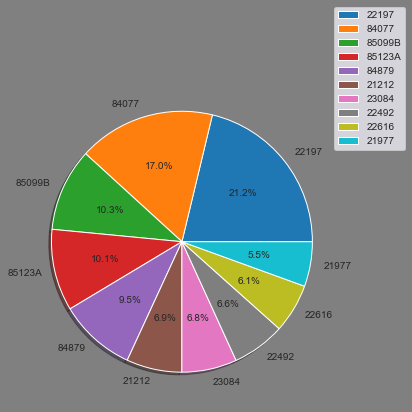

In [30]:
plt.figure(figsize = (8,6),facecolor = 'grey')
labels = product_income['ProductID']
plt.pie(product_income['Total income'],labels = labels,autopct = '%1.1f%%',shadow = True)
plt.legend(loc = 'right',bbox_to_anchor = (1.2,1,0,0))

In [31]:
# 8. Give statistical sumary for this product analysis
df_fill = df.fillna(method = 'pad')

In [32]:
group_3 = df_fill.groupby('StockCode')['Total price'].sum()

In [33]:
productID_1 = df_fill['StockCode'].value_counts()
dic_3 = {'productID':group_3.index,'Quantity sold':productID_1.values,'Total income':group_3.values}
product_df = pd.DataFrame(dic_3)

In [34]:
product_df.describe()

,Quantity sold,Total income
count,4070.000000,4070.000000
mean,133.147174,2395.024062
std,199.903331,7931.603222
min,1.000000,-221520.500000
25%,14.000000,95.197500
50%,62.000000,612.650000
75%,167.000000,2087.657500
max,2313.000000,206245.480000


##### 3.2 RFM analysis(Customer analysis)

In [35]:
# 1. Which are the different countries buying this shop?.
df['Country'].value_counts()


United Kingdom          495478
Germany                   9495
France                    8557
EIRE                      8196
Spain                     2533
Netherlands               2371
Belgium                   2069
Switzerland               2002
Portugal                  1519
Australia                 1259
Norway                    1086
Italy                      803
Channel Islands            758
Finland                    695
Cyprus                     622
Sweden                     462
Unspecified                446
Austria                    401
Denmark                    389
Japan                      358
Poland                     341
Israel                     297
USA                        291
Hong Kong                  288
Singapore                  229
Iceland                    182
Canada                     151
Greece                     146
Malta                      127
United Arab Emirates        68
European Community          61
RSA                         58
Lebanon 

In [36]:
# 2. From this different countries identify the top 5 customers 
# buying frequently from this shop.
potential_cust = df['Country'].value_counts()[:5]


In [37]:
potential_cust

United Kingdom    495478
Germany             9495
France              8557
EIRE                8196
Spain               2533
Name: Country, dtype: int64

Text(0.5, 1.0, 'Number of times purchased by each country from the shop')

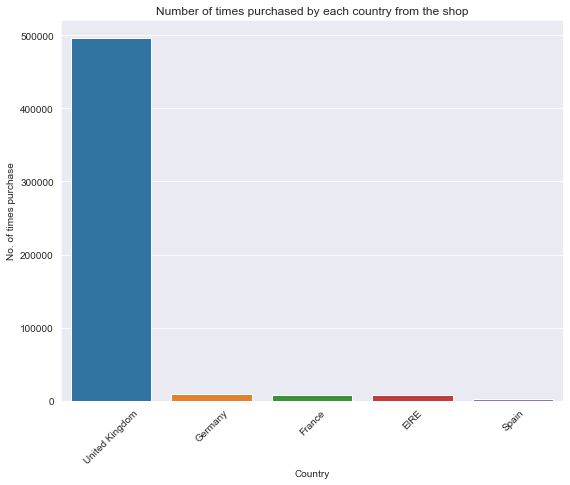

In [38]:
plt.figure(figsize = (9,7))
sns.barplot(x = potential_cust.index,y = potential_cust.values)
plt.xticks(rotation = 45)
plt.xlabel('Country')
plt.ylabel('No. of times purchase')
plt.title('Number of times purchased by each country from the shop')

- From above the most potential customers to this shop are from UK.

In [39]:
# Checking for duplicates
df.duplicated().sum()

5268

In [40]:
# 3. drop all duplicates
df_new = df.drop_duplicates()

In [41]:
df_new.duplicated().sum()

0

In [42]:
df_new

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60


In [43]:
# 4. stastical summary
df_new.describe()


,Quantity,UnitPrice,CustomerID,Total price
count,536641.000000,536641.000000,401604.000000,536641.000000
mean,9.620029,4.632656,15281.160818,18.123861
std,219.130156,97.233118,1714.006089,380.656263
min,-80995.000000,-11062.060000,12346.000000,-168469.600000
25%,1.000000,1.250000,13939.000000,3.750000
50%,3.000000,2.080000,15145.000000,9.870000
75%,10.000000,4.130000,16784.000000,17.400000
max,80995.000000,38970.000000,18287.000000,168469.600000


<AxesSubplot:>

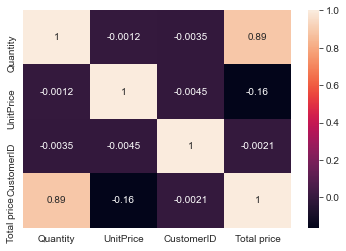

In [44]:
# 5. correlation
sns.heatmap(df_new.corr(), annot = True)

In [45]:
# Get UK data(Potential customer)
group_4 = df_new.groupby('Country')

In [46]:
uk_data = group_4.get_group('United Kingdom')

In [47]:
uk_data 

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541889,581585,22466,FAIRY TALE COTTAGE NIGHT LIGHT,12,2011-12-09 12:31:00,1.95,15804.0,United Kingdom,23.40
541890,581586,22061,LARGE CAKE STAND HANGING STRAWBERY,8,2011-12-09 12:49:00,2.95,13113.0,United Kingdom,23.60
541891,581586,23275,SET OF 3 HANGING OWLS OLLIE BEAK,24,2011-12-09 12:49:00,1.25,13113.0,United Kingdom,30.00
541892,581586,21217,RED RETROSPOT ROUND CAKE TINS,24,2011-12-09 12:49:00,8.95,13113.0,United Kingdom,214.80


In [48]:
uk_clean = uk_data[['InvoiceNo','CustomerID','InvoiceDate','Quantity','UnitPrice','Total price']]

In [49]:
uk_data_clean = uk_clean[(uk_clean['Quantity']>0)&(uk_clean['UnitPrice']>0)] 

In [50]:
uk_data_clean 

,InvoiceNo,CustomerID,InvoiceDate,Quantity,UnitPrice,Total price
0,536365,17850.0,2010-12-01 08:26:00,6,2.55,15.30
1,536365,17850.0,2010-12-01 08:26:00,6,3.39,20.34
2,536365,17850.0,2010-12-01 08:26:00,8,2.75,22.00
3,536365,17850.0,2010-12-01 08:26:00,6,3.39,20.34
4,536365,17850.0,2010-12-01 08:26:00,6,3.39,20.34
...,...,...,...,...,...,...
541889,581585,15804.0,2011-12-09 12:31:00,12,1.95,23.40
541890,581586,13113.0,2011-12-09 12:49:00,8,2.95,23.60
541891,581586,13113.0,2011-12-09 12:49:00,24,1.25,30.00
541892,581586,13113.0,2011-12-09 12:49:00,24,8.95,214.80


In [51]:
# Creating an RFM Table

In [52]:
#Recency calculation
uk_clean['InvoiceDate'].max(),uk_clean['InvoiceDate'].min()

(Timestamp('2011-12-09 12:49:00'), Timestamp('2010-12-01 08:26:00'))

In [53]:
import datetime as dt
PRESENT = dt.datetime(2011,12,10)

In [54]:
PRESENT

datetime.datetime(2011, 12, 10, 0, 0)

In [55]:
RFM = uk_data_clean.groupby('CustomerID').agg({'InvoiceDate': lambda x: (PRESENT-x.max()).days,
                                            
                                             'CustomerID': lambda z : z.count(),
                                            'Total price': lambda y :y.sum()
                                            
                                            })

In [56]:
RFM

,InvoiceDate,CustomerID,Total price
CustomerID,,,
12346.0,325,1.0,77183.60
12747.0,2,103.0,4196.01
12748.0,0,4412.0,33053.19
12749.0,3,199.0,4090.88
12820.0,3,59.0,942.34
...,...,...,...
18280.0,277,10.0,180.60
18281.0,180,7.0,80.82
18282.0,7,12.0,178.05


In [57]:
RFM_Table = RFM.rename(columns = {'InvoiceDate':'Recency','CustomerID':'Frequency','Total price':'Monetary value'}) 

In [58]:
RFM_Table

,Recency,Frequency,Monetary value
CustomerID,,,
12346.0,325,1.0,77183.60
12747.0,2,103.0,4196.01
12748.0,0,4412.0,33053.19
12749.0,3,199.0,4090.88
12820.0,3,59.0,942.34
...,...,...,...
18280.0,277,10.0,180.60
18281.0,180,7.0,80.82
18282.0,7,12.0,178.05


In [59]:
# Dividing the RFM table into qartiles.
RFM_Table['R_quartile'] = pd.qcut(RFM_Table['Recency'],5,[1,2,3,4,5])
RFM_Table['F_quartile'] = pd.qcut(RFM_Table['Frequency'],5,[5,4,3,2,1])
RFM_Table['M_quartile'] = pd.qcut(RFM_Table['Monetary value'],5,[5,4,3,2,1])

In [60]:
RFM_Table

,Recency,Frequency,Monetary value,R_quartile,F_quartile,M_quartile
CustomerID,,,,,,
12346.0,325,1.0,77183.60,5,5,1
12747.0,2,103.0,4196.01,1,2,1
12748.0,0,4412.0,33053.19,1,1,1
12749.0,3,199.0,4090.88,1,1,1
12820.0,3,59.0,942.34,1,2,2
...,...,...,...,...,...,...
18280.0,277,10.0,180.60,5,5,5
18281.0,180,7.0,80.82,5,5,5
18282.0,7,12.0,178.05,1,5,5


In [61]:
# RFM score
RFM_Table['RFM score'] = RFM_Table['R_quartile'].astype(str) + RFM_Table['F_quartile'].astype(str) + RFM_Table['M_quartile'].astype(str) 

In [62]:
RFM_Table

,Recency,Frequency,Monetary value,R_quartile,F_quartile,M_quartile,RFM score
CustomerID,,,,,,,
12346.0,325,1.0,77183.60,5,5,1,551
12747.0,2,103.0,4196.01,1,2,1,121
12748.0,0,4412.0,33053.19,1,1,1,111
12749.0,3,199.0,4090.88,1,1,1,111
12820.0,3,59.0,942.34,1,2,2,122
...,...,...,...,...,...,...,...
18280.0,277,10.0,180.60,5,5,5,555
18281.0,180,7.0,80.82,5,5,5,555
18282.0,7,12.0,178.05,1,5,5,155


In [63]:
# Determine the percentage of customers found in each quartile.
RFM_Table['RFM score'].value_counts(normalize = True)*100

111    7.193878
555    5.918367
211    3.520408
544    3.469388
455    2.729592
         ...   
531    0.051020
514    0.025510
541    0.025510
114    0.025510
314    0.025510
Name: RFM score, Length: 118, dtype: float64

In [64]:
# Identify the quartiles with the best customers
group_6 = RFM_Table.groupby('RFM score')['Monetary value'].sum()


In [65]:
group_6.sort_values(ascending = False)

RFM score
111    2842319.93
211     645947.75
311     371448.62
121     345420.06
221     200551.72
          ...    
225        552.47
114        405.47
314        405.04
125        393.25
514        392.86
Name: Monetary value, Length: 118, dtype: float64

##### Best customers for this UK shop.

In [66]:
RFM_Table[RFM_Table['RFM score']== '111']

,Recency,Frequency,Monetary value,R_quartile,F_quartile,M_quartile,RFM score
CustomerID,,,,,,,
12748.0,0,4412.0,33053.19,1,1,1,111
12749.0,3,199.0,4090.88,1,1,1,111
12839.0,2,314.0,5591.42,1,1,1,111
12841.0,4,414.0,3991.58,1,1,1,111
12856.0,7,311.0,2170.78,1,1,1,111
...,...,...,...,...,...,...,...
18225.0,3,269.0,5504.96,1,1,1,111
18229.0,11,164.0,7276.90,1,1,1,111
18245.0,7,175.0,2567.06,1,1,1,111


##### Top 10 customers

In [67]:
RFM_Table[RFM_Table['RFM score']== '111'].sort_values('Monetary value',ascending = False).head(10)

,Recency,Frequency,Monetary value,R_quartile,F_quartile,M_quartile,RFM score
CustomerID,,,,,,,
18102.0,0,431.0,259657.30,1,1,1,111
17450.0,8,336.0,194390.79,1,1,1,111
17511.0,2,963.0,91062.38,1,1,1,111
16684.0,4,277.0,66653.56,1,1,1,111
14096.0,4,5111.0,65164.79,1,1,1,111
13694.0,3,568.0,65039.62,1,1,1,111
15311.0,0,2366.0,60632.75,1,1,1,111
13089.0,2,1814.0,58762.08,1,1,1,111
15769.0,7,130.0,56252.72,1,1,1,111


##### Second segment of best customers

In [68]:
RFM_Table[RFM_Table['RFM score']== '211'].sort_values('Monetary value',ascending = False).head(10)

,Recency,Frequency,Monetary value,R_quartile,F_quartile,M_quartile,RFM score
CustomerID,,,,,,,
16422.0,17,369.0,34684.40,2,1,1,211
14680.0,25,258.0,28754.11,2,1,1,211
17340.0,29,407.0,12353.29,2,1,1,211
15125.0,25,127.0,11528.48,2,1,1,211
17139.0,15,477.0,10650.77,2,1,1,211
17865.0,30,370.0,10526.32,2,1,1,211
15502.0,15,213.0,10384.93,2,1,1,211
14733.0,16,202.0,9585.91,2,1,1,211
13488.0,17,422.0,8968.31,2,1,1,211


#### 6.Conclusion.

<AxesSubplot:xlabel='Frequency', ylabel='Monetary value'>

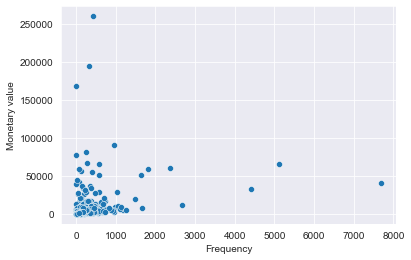

In [69]:
sns.scatterplot(x = RFM_Table['Frequency'],y = RFM_Table['Monetary value'])

### Conclusion
- The best comtomers to this UK shop are those belonging to segment 111, followed by those belonging segments 211,311,121 and 221. This is because of their low recency,high frequency and high monetary values.

In [70]:
import jovian

In [72]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "abehsongkiss/customer-segmentation-using-rfm-analysis-project-21" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/abehsongkiss/customer-segmentation-using-rfm-analysis-project-21


'https://jovian.ai/abehsongkiss/customer-segmentation-using-rfm-analysis-project-21'

h